# Tubes SDR 2020

Based on https://www.kaggle.com/nicholaslincoln/anomaly-detection-forecasting

Authors :
- Yolanda Tania Mulyadi (13318011)
- Leonardi (13318021)

# Checking system specification

## Check CPU

In [ ]:
#comment only if you are not using linux
!cat /proc/cpuinfo

processor	: 0
vendor_id	: GenuineIntel
cpu family	: 6
model		: 79
model name	: Intel(R) Xeon(R) CPU @ 2.20GHz
stepping	: 0
microcode	: 0x1
cpu MHz		: 2200.000
cache size	: 56320 KB
physical id	: 0
siblings	: 2
core id		: 0
cpu cores	: 1
apicid		: 0
initial apicid	: 0
fpu		: yes
fpu_exception	: yes
cpuid level	: 13
wp		: yes
flags		: fpu vme de pse tsc msr pae mce cx8 apic sep mtrr pge mca cmov pat pse36 clflush mmx fxsr sse sse2 ss ht syscall nx pdpe1gb rdtscp lm constant_tsc rep_good nopl xtopology nonstop_tsc cpuid tsc_known_freq pni pclmulqdq ssse3 fma cx16 pcid sse4_1 sse4_2 x2apic movbe popcnt aes xsave avx f16c rdrand hypervisor lahf_lm abm 3dnowprefetch invpcid_single ssbd ibrs ibpb stibp fsgsbase tsc_adjust bmi1 hle avx2 smep bmi2 erms invpcid rtm rdseed adx smap xsaveopt arat md_clear arch_capabilities
bugs		: cpu_meltdown spectre_v1 spectre_v2 spec_store_bypass l1tf mds swapgs taa
bogomips	: 4400.00
clflush size	: 64
cache_alignment	: 64
address sizes	: 46 bits physical, 48 b

## Check RAM

In [ ]:
#comment only if you are not using linux
!cat /proc/meminfo

MemTotal:       13333596 kB
MemFree:        10270212 kB
MemAvailable:   12488100 kB
Buffers:           82840 kB
Cached:          2247636 kB
SwapCached:            0 kB
Active:           645940 kB
Inactive:        2108212 kB
Active(anon):     360420 kB
Inactive(anon):      348 kB
Active(file):     285520 kB
Inactive(file):  2107864 kB
Unevictable:           0 kB
Mlocked:               0 kB
SwapTotal:             0 kB
SwapFree:              0 kB
Dirty:              4912 kB
Writeback:             0 kB
AnonPages:        423812 kB
Mapped:           209344 kB
Shmem:               960 kB
Slab:             171620 kB
SReclaimable:     130540 kB
SUnreclaim:        41080 kB
KernelStack:        3920 kB
PageTables:         5284 kB
NFS_Unstable:          0 kB
Bounce:                0 kB
WritebackTmp:          0 kB
CommitLimit:     6666796 kB
Committed_AS:    2622100 kB
VmallocTotal:   34359738367 kB
VmallocUsed:           0 kB
VmallocChunk:          0 kB
Percpu:              952 kB
AnonHugePages:   

## Check GPU

In [ ]:
#comment only if you are not using linux
!nvidia-smi

Tue Dec 29 15:34:56 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.27.04    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P8     9W /  70W |      0MiB / 15079MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Check CUDA

In [ ]:
#comment only if you are not using linux
!/usr/local/cuda/bin/nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2019 NVIDIA Corporation
Built on Sun_Jul_28_19:07:16_PDT_2019
Cuda compilation tools, release 10.1, V10.1.243


# Import libraries

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as Data
import torch.optim as optim
import time
import math

from collections import Counter
from torch.utils.data import TensorDataset, DataLoader
from torch.autograd import Variable

%matplotlib inline

# Create buffer for checking runtime for each process

In [ ]:
'''
Index explanation :

Dataset preparation :
- 0 : Reading dataset
- 1 : Showing info for dataframe

Data cleaning
- 2 : Convert date and time for to pandas datetime
- 3 : Check for null values
- 4 : Check for missing data
- 5 : Fill missing data with NaN
- 6 : Reducing memory hog
- 7 : Sanity check

- 8 : Combining datasets
- 9 : Figure out sunrise and sunset times

Fill null values :
- 10 : Create additional time features
- 11 : Determine how total yield is calculated
- 12 : Inserting missing time steps

Check data distribution :
- 13 : Check data distribution for plant 1
- 14 : Check data distribution for plant 2

Fixing weird daily_yield data
- 15 : Fixing weird daily_yield data
- 16 : Rescale plant 1's DC power values

Feature engineering :
- 17 : Manually spot check the features
- 18 : Plotting distribution of each feature

EDA (Explorative Data Analysis) :
- 19 : Inspect outliers in yield and hourly_yield of plant 1
- 20 : Inspect outliers in yield and hourly_yield of plant 2
- 21 : Remove some of the features
- 22 : Plotting DC power output for all inverter
- 23 : Plotting overall inverter performance
- 24 : Bivariate relationship plot of plant 1
- 25 : Bivariate relationship plot of plant 2
- 26 : Pearson's correlation plot of plant 1
- 27 : Pearson's correlation plot of plant 2
- 28 : Spearman's correlation plot of plant 1
- 29 : Spearman's correlation plot of plant 2
- 30 : Kendall's correlation plot of plant 1
- 31 : Kendall's correlation plot of plant 2

Anomaly detection :
- 32 : Consistency check by 0 output
- 33 : Consistency check by output distribution
- 34 : Filter out faulty inverters
- 35 : Regress dc_power against module_temperature and irradiation on plant 1
- 36 : Regress dc_power against module_temperature and irradiation on plant 2

Forecasting :
- 37 : LSTM class definition
- 38 : Function for splitting sequences into samples
Plant 1 : 
- 39 : Preparation
- 40 : Training
- 41 : Plotting loss value for each epoch
- 42 : Predicting the values
- 43 : Plotting actual and predicted DC output
Plant 2 : 
- 44 : Preparation
- 45 : Training
- 46 : Plotting loss value for each epoch
- 47 : Predicting the values
- 48 : Plotting actual and predicted DC output
'''

runtime_arr = np.array([0.0 for _ in range(48+1)])
start_time = time.time()
prev_time = start_time
index = 0

# Preparing Dataset

## Reading datasets

In [ ]:
g1_df = pd.read_csv("Plant_1_Generation_Data.csv")
g2_df = pd.read_csv("Plant_2_Generation_Data.csv")
w1_df = pd.read_csv("Plant_1_Weather_Sensor_Data.csv")
w2_df = pd.read_csv("Plant_2_Weather_Sensor_Data.csv")

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

## Showing info for dataframes

In [ ]:
for df in [g1_df, g2_df, w1_df, w2_df]:
  df.columns = [col.lower() for col in df.columns]
  print(df.info(), '\n')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68778 entries, 0 to 68777
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date_time    68778 non-null  object 
 1   plant_id     68778 non-null  int64  
 2   source_key   68778 non-null  object 
 3   dc_power     68778 non-null  float64
 4   ac_power     68778 non-null  float64
 5   daily_yield  68778 non-null  float64
 6   total_yield  68778 non-null  float64
dtypes: float64(4), int64(1), object(2)
memory usage: 3.7+ MB
None 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67698 entries, 0 to 67697
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date_time    67698 non-null  object 
 1   plant_id     67698 non-null  int64  
 2   source_key   67698 non-null  object 
 3   dc_power     67698 non-null  float64
 4   ac_power     67698 non-null  float64
 5   daily_yield  67698 non-null  float64
 

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

## Data cleaning

### Convert date and time format to Pandas datetime format

In [ ]:
g1_df['date_time']= pd.to_datetime(g1_df['date_time'],format='%d-%m-%Y %H:%M')
g2_df['date_time']= pd.to_datetime(g2_df['date_time'],format='%Y-%m-%d %H:%M:%S')
w1_df['date_time']= pd.to_datetime(w1_df['date_time'],format='%Y-%m-%d %H:%M:%S')
w2_df['date_time']= pd.to_datetime(w2_df['date_time'],format='%Y-%m-%d %H:%M:%S')

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

### Check for null values

In [ ]:
for df in [g1_df, g2_df, w1_df, w2_df]:
  print(df.isna().sum(), '\n')

date_time      0
plant_id       0
source_key     0
dc_power       0
ac_power       0
daily_yield    0
total_yield    0
dtype: int64 

date_time      0
plant_id       0
source_key     0
dc_power       0
ac_power       0
daily_yield    0
total_yield    0
dtype: int64 

date_time              0
plant_id               0
source_key             0
ambient_temperature    0
module_temperature     0
irradiation            0
dtype: int64 

date_time              0
plant_id               0
source_key             0
ambient_temperature    0
module_temperature     0
irradiation            0
dtype: int64 



In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

No null value found.

### Check for missing data

In [ ]:
Counter(g1_df.source_key)

Counter({'1BY6WEcLGh8j5v7': 3154,
         '1IF53ai7Xc0U56Y': 3119,
         '3PZuoBAID5Wc2HD': 3118,
         '7JYdWkrLSPkdwr4': 3133,
         'McdE0feGgRqW7Ca': 3124,
         'VHMLBKoKgIrUVDU': 3133,
         'WRmjgnKYAwPKWDb': 3118,
         'YxYtjZvoooNbGkE': 3104,
         'ZnxXDlPa8U1GXgE': 3130,
         'ZoEaEvLYb1n2sOq': 3123,
         'adLQvlD726eNBSB': 3119,
         'bvBOhCH3iADSZry': 3155,
         'iCRJl6heRkivqQ3': 3125,
         'ih0vzX44oOqAx2f': 3130,
         'pkci93gMrogZuBj': 3125,
         'rGa61gmuvPhdLxV': 3124,
         'sjndEbLyjtCKgGv': 3124,
         'uHbuxQJl8lW7ozc': 3125,
         'wCURE6d3bPkepu2': 3126,
         'z9Y9gH1T5YWrNuG': 3126,
         'zBIq5rxdHJRwDNY': 3119,
         'zVJPv84UY57bAof': 3124})

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

### Fill missing data with NaN

Only doing so for 15 minutes interval

In [ ]:
# Store original dataframe shape for validating row counts
original_rowcounts = [df.shape[0] for df in [g1_df, g2_df, w1_df, w2_df]]

# Function to do time insertion
def insert_missing_date_times(obj):
  # Reindexing with 15 minutes interval
  # Any missing time steps will be inserted
  return obj.reindex(pd.date_range(obj.index.min(), obj.index.max(), freq='15min', name='date_time'))

# Apply insertion function to each dataframe
g1_df_new = g1_df.set_index('date_time').groupby('source_key').apply(insert_missing_date_times).drop('source_key', axis=1)
g1_df_new.reset_index(inplace=True)
g2_df_new = g2_df.set_index('date_time').groupby('source_key').apply(insert_missing_date_times).drop('source_key', axis=1)
g2_df_new.reset_index(inplace=True)
w1_df_new = w1_df.set_index('date_time').groupby('source_key').apply(insert_missing_date_times).drop('source_key', axis=1)
w1_df_new.reset_index(inplace=True)
w2_df_new = w2_df.set_index('date_time').groupby('source_key').apply(insert_missing_date_times).drop('source_key', axis=1)
w2_df_new.reset_index(inplace=True)

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

### To reduce memory hog

In [ ]:
g1_df = g1_df_new
g2_df = g2_df_new
w1_df = w1_df_new
w2_df = w2_df_new
del g1_df_new, g2_df_new, w1_df_new, w2_df_new

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

### Sanity check

In [ ]:
# Verifying number of rows added is as many as rows added as NaN
validated_rowcounts = [
  df.isna().sum().max() + original_rowcounts[idx] == df.shape[0] 
  for idx, df in enumerate(
      [g1_df, g2_df, w1_df, w2_df]
      )
  ]

# If all is True and the number of missing values is the same, sanity check passed
print(validated_rowcounts)
print('\n')
for df in [g1_df, g2_df, w1_df, w2_df]:
  print(df.isna().sum(), '\n')

[True, True, True, True]


source_key        0
date_time         0
plant_id       3026
dc_power       3026
ac_power       3026
daily_yield    3026
total_yield    3026
dtype: int64 

source_key        0
date_time         0
plant_id       4110
dc_power       4110
ac_power       4110
daily_yield    4110
total_yield    4110
dtype: int64 

source_key              0
date_time               0
plant_id               82
ambient_temperature    82
module_temperature     82
irradiation            82
dtype: int64 

source_key             0
date_time              0
plant_id               5
ambient_temperature    5
module_temperature     5
irradiation            5
dtype: int64 



In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

## Combining datasets

In [ ]:
# Rename columns and remove unnecessary data
for df in [w1_df, w2_df]:
  df.rename(columns={'source_key': "weather_sensor_key"}, inplace=True)
  df.drop("plant_id", axis=1, inplace=True)

# Mergind
plant1 = pd.merge(g1_df, w1_df, how='left', on=['date_time'])
plant2 = pd.merge(g2_df, w2_df, how='left', on=['date_time'])

# Count nulls
print(plant1.isna().sum(), '\n')
print(plant2.isna().sum(), '\n')

source_key                0
date_time                 0
plant_id               3026
dc_power               3026
ac_power               3026
daily_yield            3026
total_yield            3026
weather_sensor_key        0
ambient_temperature    1804
module_temperature     1804
irradiation            1804
dtype: int64 

source_key                0
date_time                 0
plant_id               4110
dc_power               4110
ac_power               4110
daily_yield            4110
total_yield            4110
weather_sensor_key        0
ambient_temperature     110
module_temperature      110
irradiation             110
dtype: int64 



There are indeed a lot of NaNs

In [ ]:
plant1.head()

,source_key,date_time,plant_id,dc_power,ac_power,daily_yield,total_yield,weather_sensor_key,ambient_temperature,module_temperature,irradiation
0,1BY6WEcLGh8j5v7,2020-05-15 00:00:00,4135001.0,0.0,0.0,0.0,6259559.0,HmiyD2TTLFNqkNe,25.184316,22.857507,0.0
1,1BY6WEcLGh8j5v7,2020-05-15 00:15:00,4135001.0,0.0,0.0,0.0,6259559.0,HmiyD2TTLFNqkNe,25.084589,22.761668,0.0
2,1BY6WEcLGh8j5v7,2020-05-15 00:30:00,4135001.0,0.0,0.0,0.0,6259559.0,HmiyD2TTLFNqkNe,24.935753,22.592306,0.0
3,1BY6WEcLGh8j5v7,2020-05-15 00:45:00,4135001.0,0.0,0.0,0.0,6259559.0,HmiyD2TTLFNqkNe,24.846130,22.360852,0.0
4,1BY6WEcLGh8j5v7,2020-05-15 01:00:00,4135001.0,0.0,0.0,0.0,6259559.0,HmiyD2TTLFNqkNe,24.621525,22.165423,0.0


In [ ]:
plant2.head()

,source_key,date_time,plant_id,dc_power,ac_power,daily_yield,total_yield,weather_sensor_key,ambient_temperature,module_temperature,irradiation
0,4UPUqMRk7TRMgml,2020-05-15 00:00:00,4136001.0,0.0,0.0,9425.0,2429011.0,iq8k7ZNt4Mwm3w0,27.004764,25.060789,0.0
1,4UPUqMRk7TRMgml,2020-05-15 00:15:00,4136001.0,0.0,0.0,9425.0,2429011.0,iq8k7ZNt4Mwm3w0,26.880811,24.421869,0.0
2,4UPUqMRk7TRMgml,2020-05-15 00:30:00,4136001.0,0.0,0.0,9425.0,2429011.0,iq8k7ZNt4Mwm3w0,26.682055,24.427290,0.0
3,4UPUqMRk7TRMgml,2020-05-15 00:45:00,4136001.0,0.0,0.0,9425.0,2429011.0,iq8k7ZNt4Mwm3w0,26.500589,24.420678,0.0
4,4UPUqMRk7TRMgml,2020-05-15 01:00:00,4136001.0,0.0,0.0,7540.0,2429011.0,iq8k7ZNt4Mwm3w0,26.596148,25.088210,0.0


In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

## Figure out when sunrise and sunset occurs, because it's solar power

In [ ]:
p1_times_no_light = plant1[plant1['irradiation']==0.0].groupby('date_time') \
                    ['source_key'].count().reset_index()
p1_times_no_light['hour'] = p1_times_no_light['date_time'].dt.hour

p2_times_no_light = plant2[plant2['irradiation']==0.0].groupby('date_time') \
                    ['source_key'].count().reset_index()
p2_times_no_light['hour'] = p2_times_no_light['date_time'].dt.hour

print("plant1 hours of no sunlight \n", p1_times_no_light.groupby('hour') \
                                        ['source_key'].count(), "\n")
print("plant2 hours of no sunlight \n", p2_times_no_light.groupby('hour') \
                                        ['source_key'].count(), "\n")

plant1 hours of no sunlight 
 hour
0     131
1     128
2     128
3     128
4     128
5      97
18     14
19    131
20    136
21    135
22    136
23    133
Name: source_key, dtype: int64 

plant2 hours of no sunlight 
 hour
0     132
1     135
2     135
3     127
4     131
5      97
18      5
19    119
20    124
21    130
22    130
23    132
Name: source_key, dtype: int64 



Seems like the sun rises between 5am and 6pm. So, any null value outside of this time range can be set to 0.

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

## Fill null values

### Create additional time features

In [ ]:
for df in [plant1, plant2]:
  df['date'] = df['date_time'].dt.date
  df['hour'] = df['date_time'].dt.hour
  df['day'] = df['date_time'].dt.day
  df['weekday'] = df['date_time'].dt.day_name()
  df['month'] = df['date_time'].dt.month
  df['year'] = df['date_time'].dt.year

# Inspect
plant1.head()

,source_key,date_time,plant_id,dc_power,ac_power,daily_yield,total_yield,weather_sensor_key,ambient_temperature,module_temperature,irradiation,date,hour,day,weekday,month,year
0,1BY6WEcLGh8j5v7,2020-05-15 00:00:00,4135001.0,0.0,0.0,0.0,6259559.0,HmiyD2TTLFNqkNe,25.184316,22.857507,0.0,2020-05-15,0,15,Friday,5,2020
1,1BY6WEcLGh8j5v7,2020-05-15 00:15:00,4135001.0,0.0,0.0,0.0,6259559.0,HmiyD2TTLFNqkNe,25.084589,22.761668,0.0,2020-05-15,0,15,Friday,5,2020
2,1BY6WEcLGh8j5v7,2020-05-15 00:30:00,4135001.0,0.0,0.0,0.0,6259559.0,HmiyD2TTLFNqkNe,24.935753,22.592306,0.0,2020-05-15,0,15,Friday,5,2020
3,1BY6WEcLGh8j5v7,2020-05-15 00:45:00,4135001.0,0.0,0.0,0.0,6259559.0,HmiyD2TTLFNqkNe,24.846130,22.360852,0.0,2020-05-15,0,15,Friday,5,2020
4,1BY6WEcLGh8j5v7,2020-05-15 01:00:00,4135001.0,0.0,0.0,0.0,6259559.0,HmiyD2TTLFNqkNe,24.621525,22.165423,0.0,2020-05-15,1,15,Friday,5,2020


In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

### Determine how total yield is calculated to fill null values

In [ ]:
grouped = plant1.groupby(['source_key', 'date']).last().reset_index()

Rows that do not hold to the equation above can be ignored, as most of the rows hold true.

Anything outside of sunlight hours will be set to 0, except for temperatures. Missing daily yields after sunset will be filled with the last non-null value of the day. The other missing ones will be linearly interpolated

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

### Filling by inserting missing time steps

In [ ]:
# Filling missing values outside of sunlight hours with 0 
# Except temperatures
# daily_yield is cumulative, so only filled before the sun rises
for df in [plant1, plant2]:
  df.loc[
      (df['dc_power'].isna()) & ((df['hour'] < 5) | (df['hour'] > 18)), 
      'dc_power'
    ] = 0
  df.loc[
      (df['ac_power'].isna()) & ((df['hour'] < 5) | (df['hour'] > 18)), 
      'dc_power'
    ] = 0
  df.loc[
      (df['irradiation'].isna()) & (df['hour'] < 5), 
      'daily_yield'
    ] = 0
  df.loc[
      (df['irradiation'].isna()) & ((df['hour'] < 5) | (df['hour'] > 18)), 
      'irradiation'
    ] = 0

# Fill missing daily_yield after sunset with the last non-null value of the day
for df in [plant1, plant2]:
  fill_values = \
       df[~df['daily_yield'].isna()] \
      .groupby(["source_key", "date"])["daily_yield"] \
      .last().reset_index()
  fill_values.rename(
      columns={"daily_yield": "daily_yield_fill_value_after_sunset"}, 
      inplace=True)
  df = pd.merge(df, fill_values, how='left', on=['source_key', 'date'])
  df.loc[(df['daily_yield'].isna()) & (df['hour'] > 18), 
          'daily_yield'] \
    = df.loc[(df['daily_yield'].isna()) & (df['hour'] > 18), 
              'daily_yield_fill_value_after_sunset']
  df.drop("daily_yield_fill_value_after_sunset", axis=1, inplace=True)

# Interpolate other mising values
for df in [plant1, plant2]:
  df['dc_power'].interpolate(method='linear', axis=0, inplace=True)
  df['ac_power'].interpolate(method='linear', axis=0, inplace=True)
  df['daily_yield'].interpolate(method='linear', axis=0, inplace=True)
  df['module_temperature'].interpolate(method='linear', axis=0, inplace=True)
  df['ambient_temperature'].interpolate(method='linear', axis=0, inplace=True)
  df['irradiation'].interpolate(method='linear', axis=0, inplace=True)

# Fill missing total_yield
for df in [plant1, plant2]:
  final_non_null_total_yields = \
      df[~df['total_yield'].isna()] \
      .groupby(["source_key", "date"])["total_yield"] \
      .last().reset_index()
  final_daily_yields = \
      df.groupby(["source_key", "date"])["daily_yield"] \
      .last() \
      .reset_index()
  fill_values = \
      pd.merge(final_non_null_total_yields, 
               final_daily_yields, 
               how='left', 
               on=['source_key', 'date'])
  fill_values['total_yield_fill_value'] = \
      fill_values['total_yield'] + fill_values['daily_yield']
  df = \
      pd.merge(df, fill_values.drop(['total_yield', 'daily_yield'], axis=1), 
               how='left', 
               on=['source_key', 
                   'date'])
  df['total_yield'].fillna(df['total_yield_fill_value'], inplace=True)
  df.drop('total_yield_fill_value', axis=1, inplace=True)

# Fill missing plant ID
for df in [plant1, plant2]:
  df.sort_values(['source_key', 'date_time'], ascending=True, inplace=True)
  df['total_yield'].fillna(method='ffill', inplace=True)
  df['plant_id'].fillna(method='ffill', inplace=True)

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

## Check data distribution

In [ ]:
sns.set(rc={'figure.figsize':(11.7, 8.27)})

### Plant 1

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



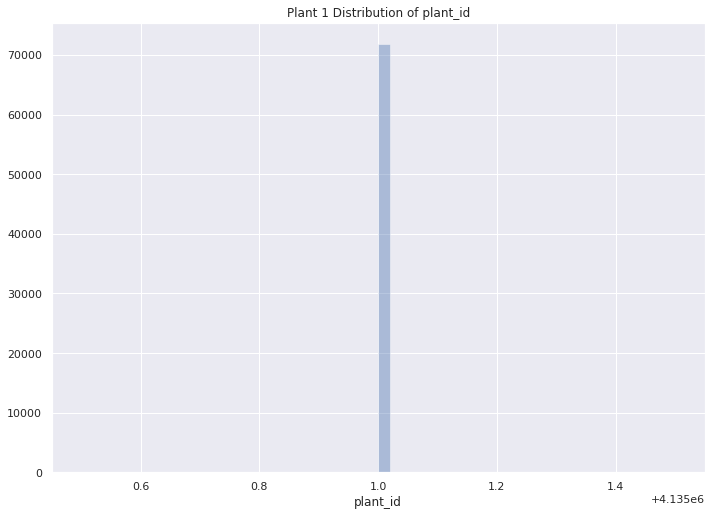

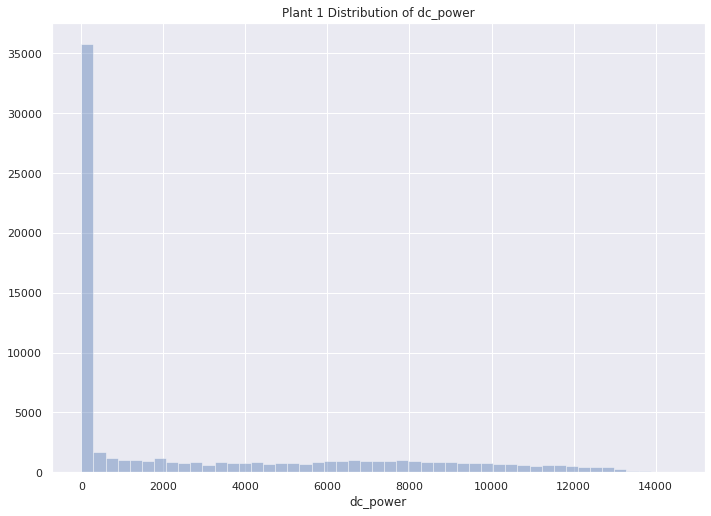

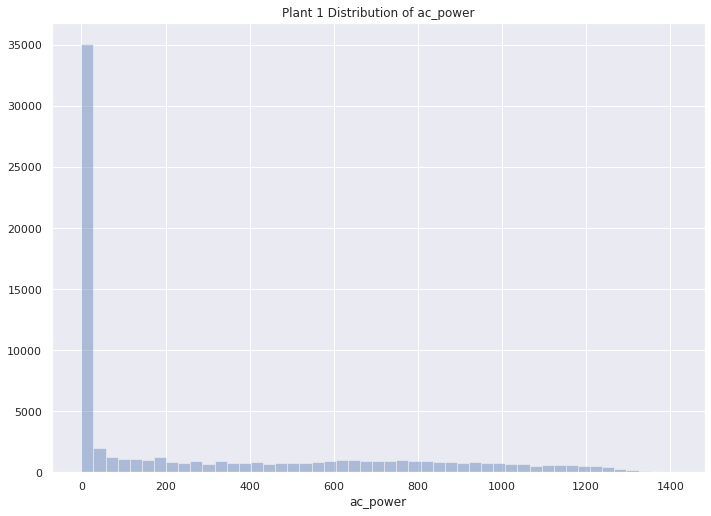

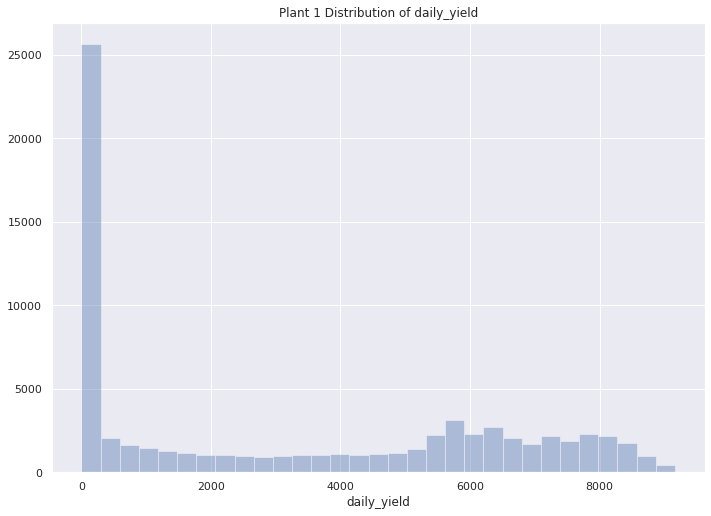

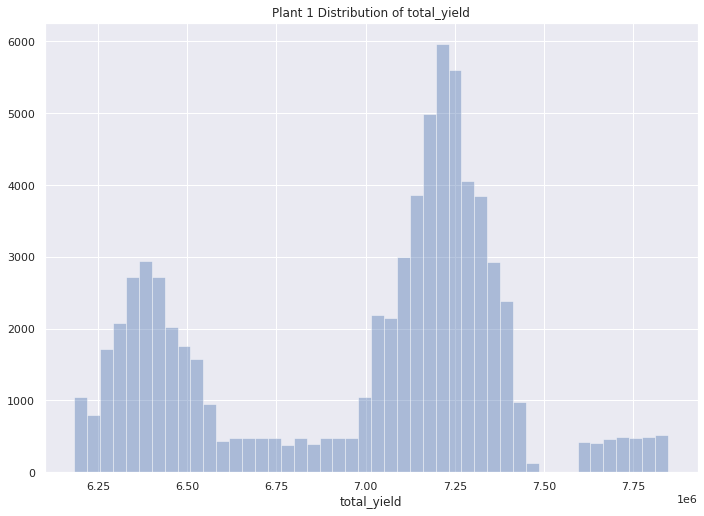

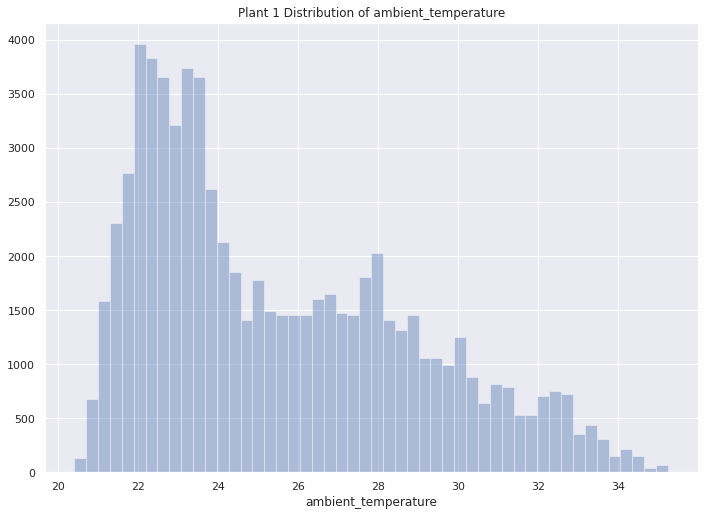

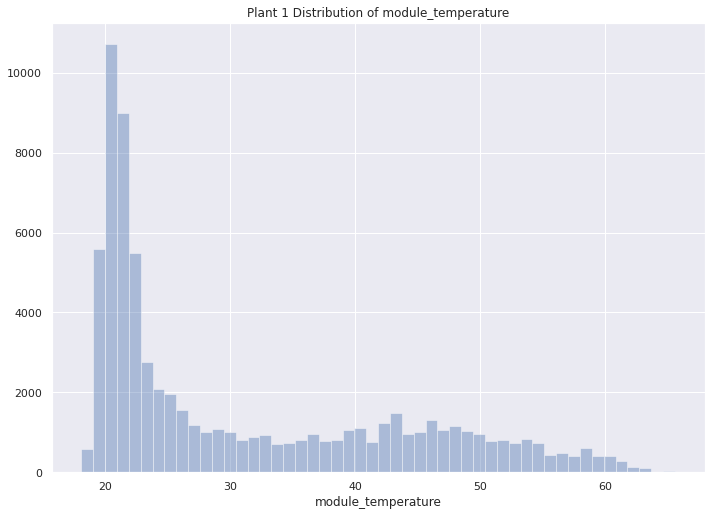

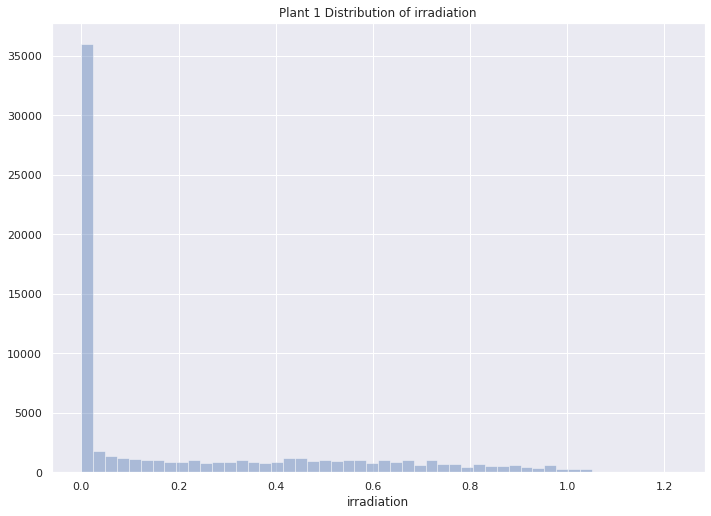

In [ ]:
for col in plant1.columns[plant1.dtypes == 'float']:
  sns.distplot(plant1[col], kde=False)
  plt.title(f"Plant 1 Distribution of {col}")
  plt.show()

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

### Plant 2

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



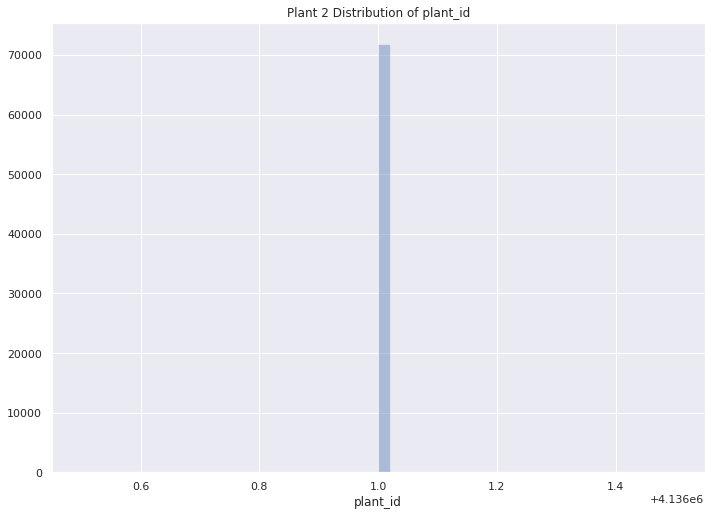

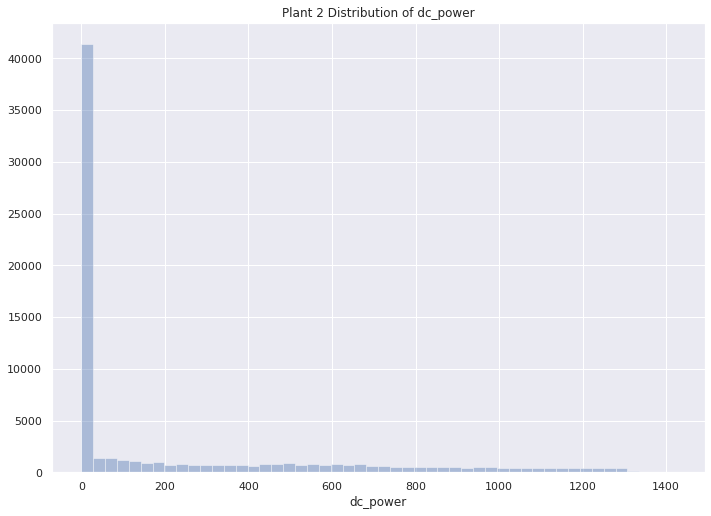

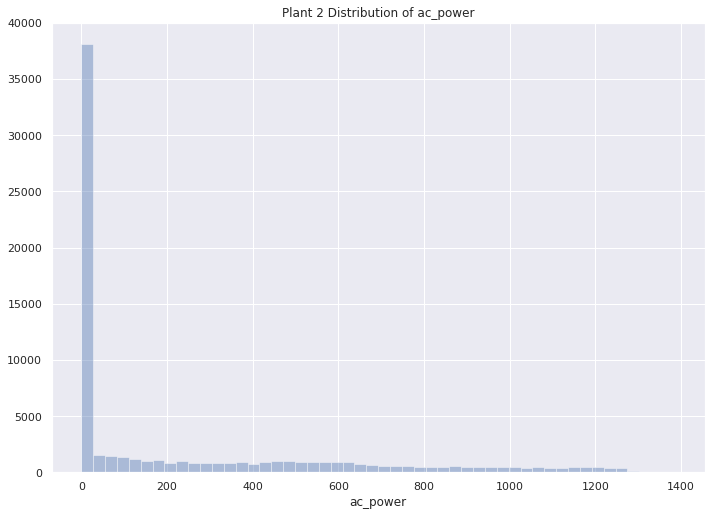

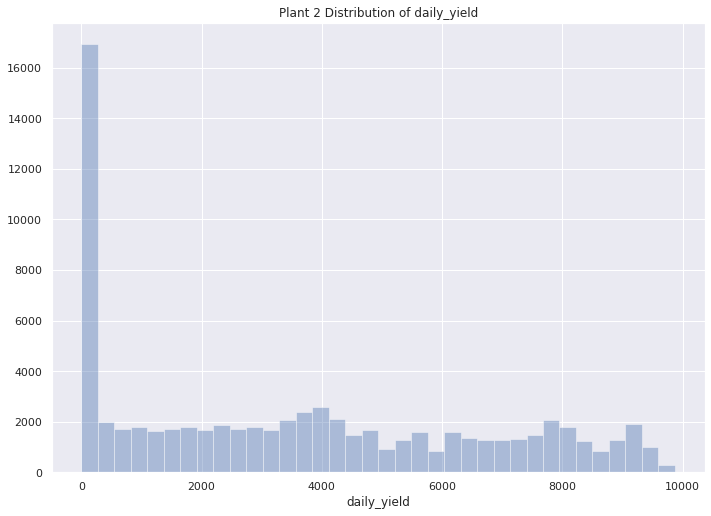

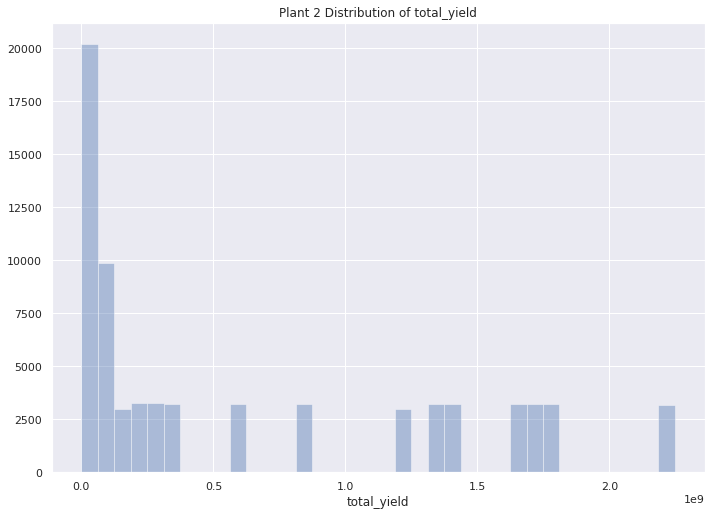

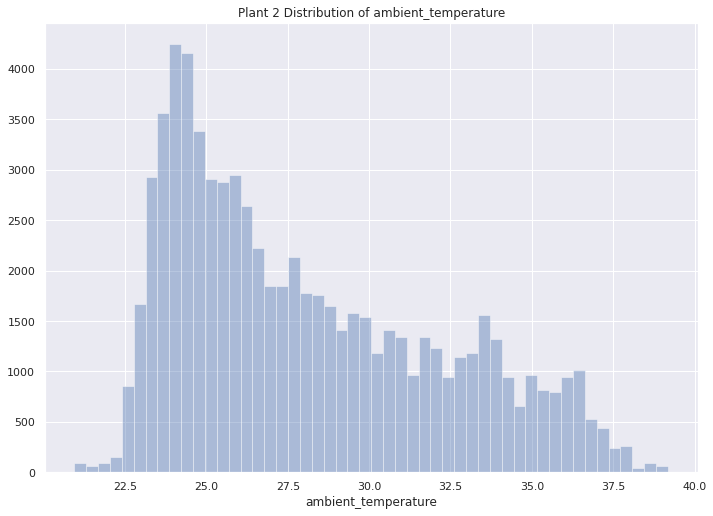

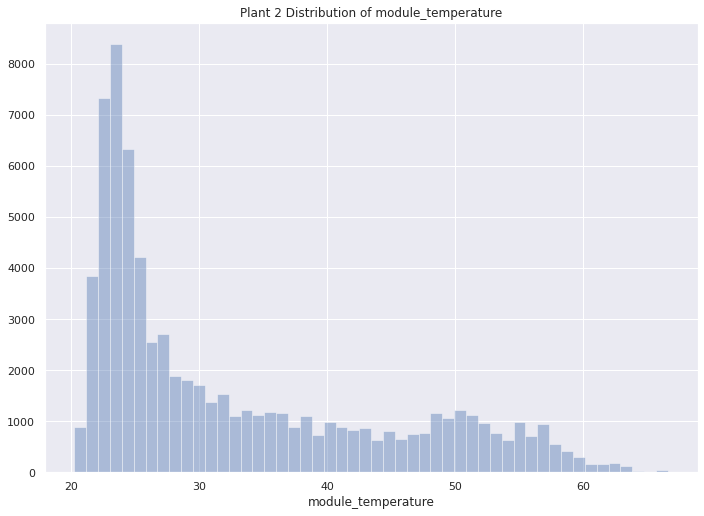

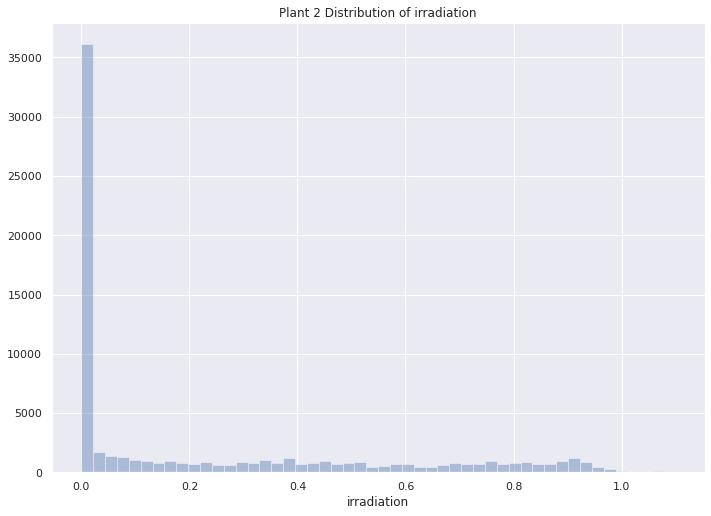

In [ ]:
for col in plant2.columns[plant2.dtypes == 'float']:
  sns.distplot(plant2[col], kde=False)
  plt.title(f"Plant 2 Distribution of {col}")
  plt.show()

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

As can be seen, there are some errors, such as daily_yields that are above 0 after midnight and before sunrise time. These values will be set to 0.

## Fixing weird daily_yield data

In [ ]:
for df in [plant1, plant2]:
  df.loc[(df['daily_yield'] > 0) & (df['hour'] < 5), 'daily_yield'] = 0

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

### Rescale plant 1's DC power values for easier comparison to plant 2's

In [ ]:
plant1['dc_power'] /= 10.

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

# Feature Engineering

Feature calculation will be done for DC power, AC power, and yield at different levels. The levels are:
- 15 minute level (1 value per row)
- hour level (1 value per inverter per hour)
- day level (1 value per inverter per day)
- inverter level (1 value per inverter)

In [ ]:
for df in [plant1, plant2]:
  df.sort_values(['source_key', 'date_time'], ascending=True, inplace=True)
  df.rename(columns={"daily_yield": "cumulative_daily_yield"}, inplace=True)
    
  # 15 minute level features (1 value per row)
  df['dc_ac_ratio'] = np.where(df['ac_power'] == 0, 
                               0, 
                               df['dc_power']/df['ac_power'])
  df['yield'] = df['cumulative_daily_yield'].diff().fillna(0)
  # Fix differences at the boundaries
  source_key_mask = df['source_key'] != df['source_key'].shift(1)
  day_mask = df['date'] != df['date'].shift(1)
  df.loc[source_key_mask, 'yield'] = 0
  df.loc[day_mask, 'yield'] = 0
    
  # Hour level features (1 value per inverter per hour)
  df['avg_hourly_dc_power'] = df.groupby(['source_key', 'hour'])['dc_power'] \
                              .transform(func=np.mean)
  df['avg_hourly_ac_power'] = df.groupby(['source_key', 'hour'])['ac_power'] \
                              .transform(func=np.mean)
  df['hourly_yield'] = df.groupby(['source_key', 'hour'])['yield'] \
                        .transform(func=np.sum)
    
  # Day level features (1 value per inverter per day)
  df['avg_daily_dc_power'] = df.groupby(['source_key', 'date'])['dc_power'] \
                              .transform(func=np.mean)
  df['avg_daily_ac_power'] = df.groupby(['source_key', 'date'])['ac_power'] \
                              .transform(func=np.mean)
  df['avg_daily_dc_ac_ratio'] = df.groupby(['source_key', 'date']) \
                                  ['dc_ac_ratio'].transform(func=np.mean)
  # Daily_yield is cumulative
  # So the final value when grouped is the total daily yield
  df['total_daily_yield'] = df.groupby(['source_key', 'date']) \
                              ['cumulative_daily_yield'] \
                              .transform(func='last')
    
  # Inverter level features (1 value per inverter)
  # Average daily yield should be calculated using the daily total, so there should be 1 average per inverter
  df['avg_daily_yield'] = df.groupby(['source_key'])['total_daily_yield'].transform(func=np.mean)

## Manually spot check the features

In [ ]:
plant1[plant1['hour'] > 6].head()

,source_key,date_time,plant_id,dc_power,ac_power,cumulative_daily_yield,total_yield,weather_sensor_key,ambient_temperature,module_temperature,irradiation,date,hour,day,weekday,month,year,dc_ac_ratio,yield,avg_hourly_dc_power,avg_hourly_ac_power,hourly_yield,avg_daily_dc_power,avg_daily_ac_power,avg_daily_dc_ac_ratio,total_daily_yield,avg_daily_yield
28,1BY6WEcLGh8j5v7,2020-05-15 07:00:00,4135001.0,173.457143,170.014286,72.714286,6259631.714,HmiyD2TTLFNqkNe,24.537398,27.185653,0.141940,2020-05-15,7,15,Friday,5,2020,1.020250,37.839286,242.987185,239.244993,6945.511905,245.146559,240.068235,0.532566,1438.5,6078.476471
29,1BY6WEcLGh8j5v7,2020-05-15 07:15:00,4135001.0,185.637500,181.937500,116.250000,6259675.250,HmiyD2TTLFNqkNe,24.815960,28.888478,0.154713,2020-05-15,7,15,Friday,5,2020,1.020337,43.535714,242.987185,239.244993,6945.511905,245.146559,240.068235,0.532566,1438.5,6078.476471
30,1BY6WEcLGh8j5v7,2020-05-15 07:30:00,4135001.0,184.228571,180.585714,162.428571,6259721.429,HmiyD2TTLFNqkNe,24.988790,29.605644,0.148799,2020-05-15,7,15,Friday,5,2020,1.020172,46.178571,242.987185,239.244993,6945.511905,245.146559,240.068235,0.532566,1438.5,6078.476471
31,1BY6WEcLGh8j5v7,2020-05-15 07:45:00,4135001.0,187.787500,184.062500,206.375000,6259765.375,HmiyD2TTLFNqkNe,25.216180,29.547111,0.144793,2020-05-15,7,15,Friday,5,2020,1.020238,43.946429,242.987185,239.244993,6945.511905,245.146559,240.068235,0.532566,1438.5,6078.476471
32,1BY6WEcLGh8j5v7,2020-05-15 08:00:00,4135001.0,324.600000,318.671429,263.571429,6259822.571,HmiyD2TTLFNqkNe,25.419513,31.412545,0.201639,2020-05-15,8,15,Friday,5,2020,1.018604,57.196429,481.145833,471.865314,14954.892857,245.146559,240.068235,0.532566,1438.5,6078.476471


In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

## Plotting the distribution of each feature

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



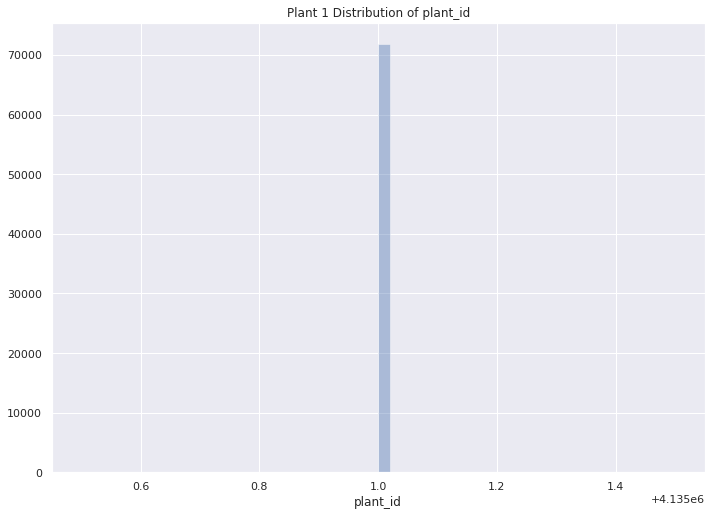

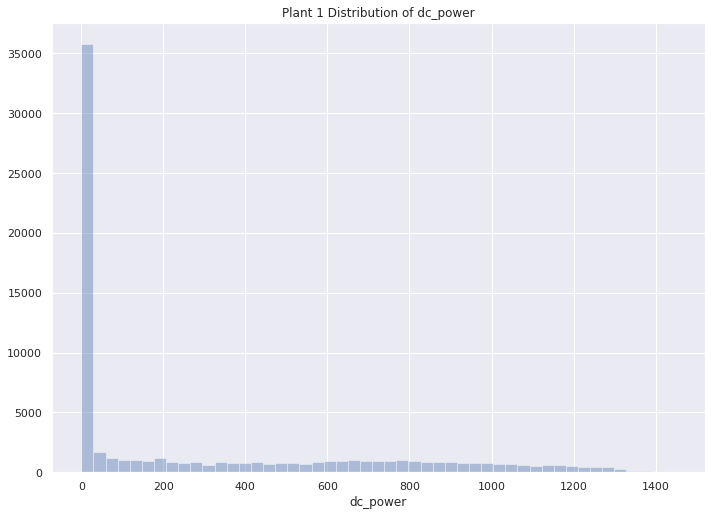

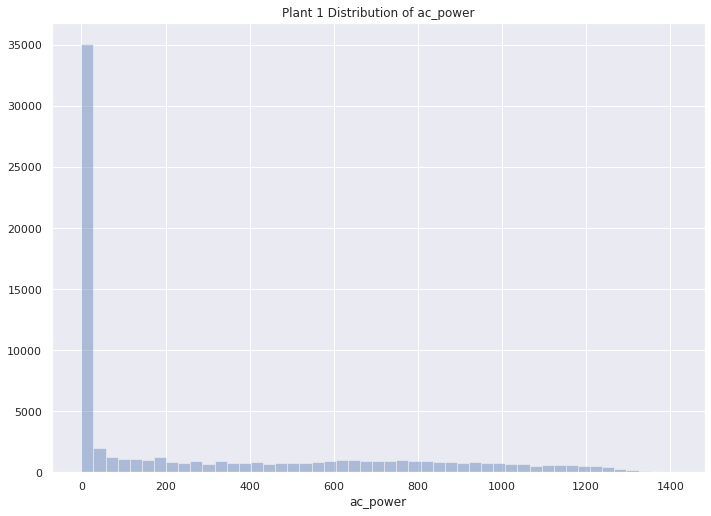

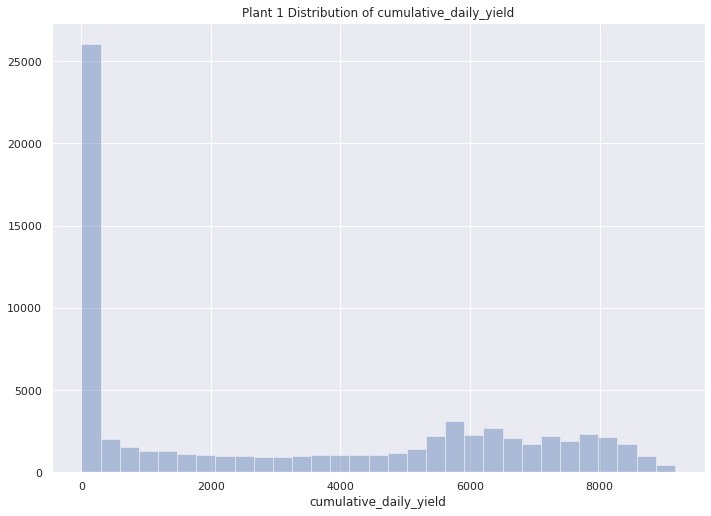

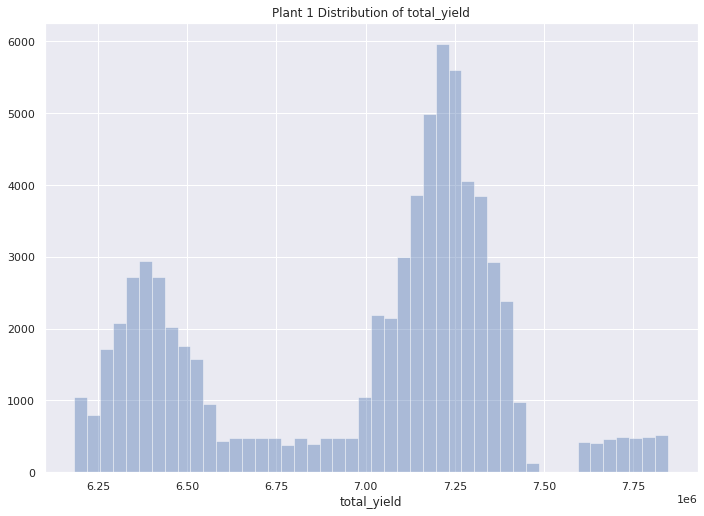

...

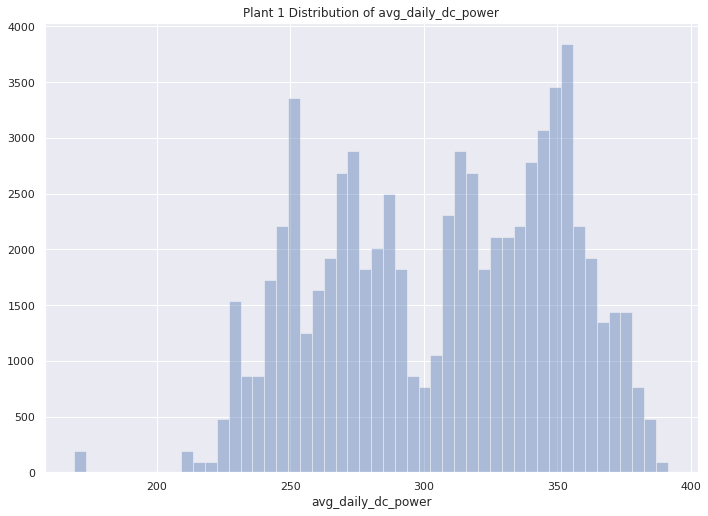

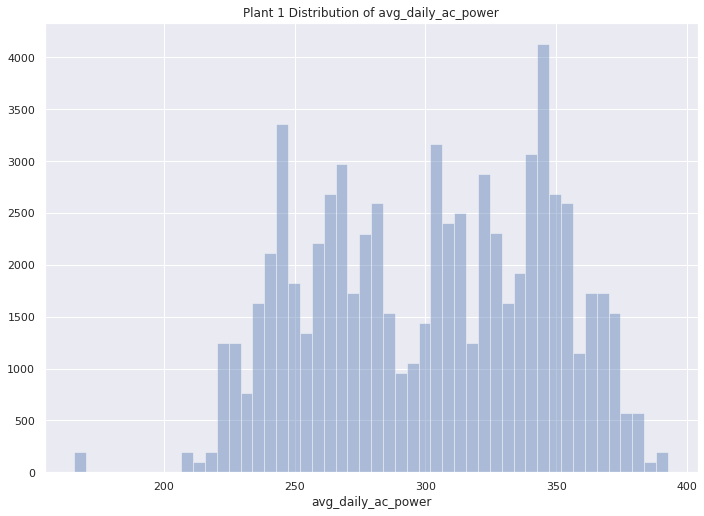

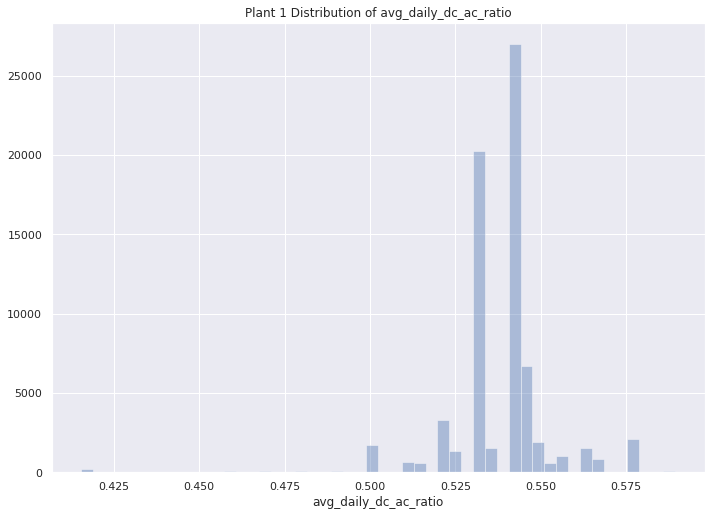

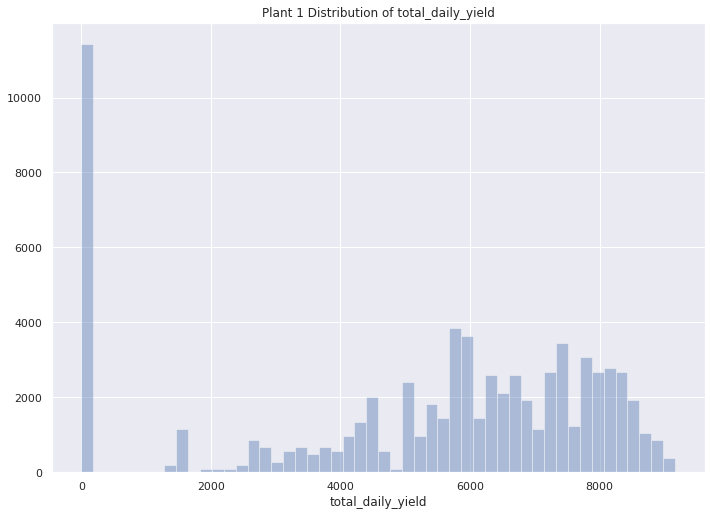

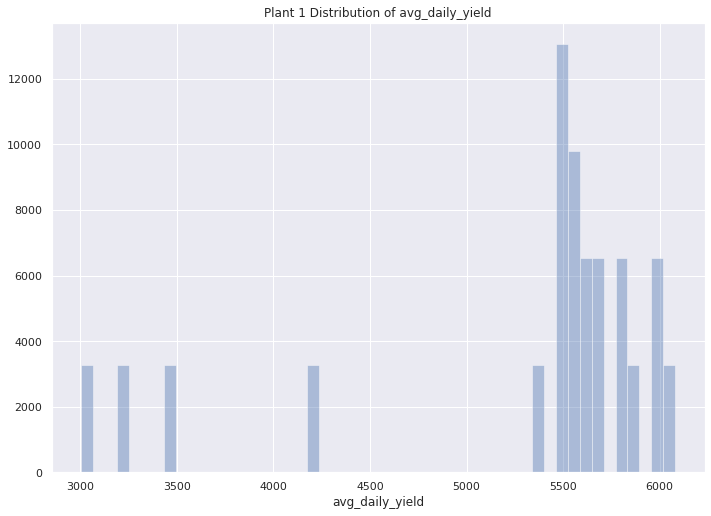

In [ ]:
for col in plant1.columns[plant1.dtypes=='float']:
  sns.distplot(plant1[col], kde=False)
  plt.title(f"Plant 1 Distribution of {col}")
  plt.show()

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

## EDA (Explorative Data Analysis)

There are some noteable things:
- The large number of skewed distributions is caused by the large number of zero values.
- The new yield and hourly_yield features have some extreme outliers
- Plant 2 had days when no power was generated
- dc_ac_ratio is either 1 or 0. This means either dc_power or ac_power can be used

### Inspect outliers in yield and hourly_yield

#### Plant 1

In [ ]:
plant1[plant1['hourly_yield'] < -2000].head()

,source_key,date_time,plant_id,dc_power,ac_power,cumulative_daily_yield,total_yield,weather_sensor_key,ambient_temperature,module_temperature,irradiation,date,hour,day,weekday,month,year,dc_ac_ratio,yield,avg_hourly_dc_power,avg_hourly_ac_power,hourly_yield,avg_daily_dc_power,avg_daily_ac_power,avg_daily_dc_ac_ratio,total_daily_yield,avg_daily_yield
72,1BY6WEcLGh8j5v7,2020-05-15 18:00:00,4135001.0,26.400000,25.485714,5749.285714,6265308.286,HmiyD2TTLFNqkNe,31.132414,30.225331,0.022545,2020-05-15,18,15,Friday,5,2020,1.035874,9.535714,19.782314,19.139758,-6464.839287,245.146559,240.068235,0.532566,1438.5,6078.476471
73,1BY6WEcLGh8j5v7,2020-05-15 18:15:00,4135001.0,7.828571,7.542857,5753.142857,6265312.143,HmiyD2TTLFNqkNe,29.243111,28.682507,0.009150,2020-05-15,18,15,Friday,5,2020,1.037879,3.857143,19.782314,19.139758,-6464.839287,245.146559,240.068235,0.532566,1438.5,6078.476471
74,1BY6WEcLGh8j5v7,2020-05-15 18:30:00,4135001.0,0.000000,0.000000,5754.000000,6265313.000,HmiyD2TTLFNqkNe,28.495518,27.285992,0.001841,2020-05-15,18,15,Friday,5,2020,0.000000,0.857143,19.782314,19.139758,-6464.839287,245.146559,240.068235,0.532566,1438.5,6078.476471
75,1BY6WEcLGh8j5v7,2020-05-15 18:45:00,4135001.0,0.000000,0.000000,5754.000000,6265313.000,HmiyD2TTLFNqkNe,27.884064,25.961947,0.000000,2020-05-15,18,15,Friday,5,2020,0.000000,0.000000,19.782314,19.139758,-6464.839287,245.146559,240.068235,0.532566,1438.5,6078.476471
92,1BY6WEcLGh8j5v7,2020-05-15 23:00:00,4135001.0,0.000000,0.000000,5754.000000,6265313.000,HmiyD2TTLFNqkNe,22.236018,21.241317,0.000000,2020-05-15,23,15,Friday,5,2020,0.000000,0.000000,0.000000,0.980213,-10567.200000,245.146559,240.068235,0.532566,1438.5,6078.476471


In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

#### Plant 2

In [ ]:
plant2[plant2['hourly_yield'] < -2000].head()

,source_key,date_time,plant_id,dc_power,ac_power,cumulative_daily_yield,total_yield,weather_sensor_key,ambient_temperature,module_temperature,irradiation,date,hour,day,weekday,month,year,dc_ac_ratio,yield,avg_hourly_dc_power,avg_hourly_ac_power,hourly_yield,avg_daily_dc_power,avg_daily_ac_power,avg_daily_dc_ac_ratio,total_daily_yield,avg_daily_yield
24,4UPUqMRk7TRMgml,2020-05-15 06:00:00,4136001.0,15.406667,14.860000,0.800000,2.429012e+06,iq8k7ZNt4Mwm3w0,24.742787,24.077230,0.012962,2020-05-15,6,15,Friday,5,2020,1.036788,0.800000,65.712474,75.200933,-28363.023883,178.256815,174.417485,0.362778,4201.0,6594.198281
25,4UPUqMRk7TRMgml,2020-05-15 06:15:00,4136001.0,27.433333,26.493333,6.133333,2.429017e+06,iq8k7ZNt4Mwm3w0,24.763911,24.356189,0.021038,2020-05-15,6,15,Friday,5,2020,1.035481,5.333333,65.712474,75.200933,-28363.023883,178.256815,174.417485,0.362778,4201.0,6594.198281
26,4UPUqMRk7TRMgml,2020-05-15 06:30:00,4136001.0,58.885714,57.028571,15.714286,2.429027e+06,iq8k7ZNt4Mwm3w0,24.786323,24.548886,0.042435,2020-05-15,6,15,Friday,5,2020,1.032565,9.580952,65.712474,75.200933,-28363.023883,178.256815,174.417485,0.362778,4201.0,6594.198281
27,4UPUqMRk7TRMgml,2020-05-15 06:45:00,4136001.0,158.013333,154.486667,39.466667,2.429050e+06,iq8k7ZNt4Mwm3w0,25.048245,25.746662,0.103496,2020-05-15,6,15,Friday,5,2020,1.022828,23.752381,65.712474,75.200933,-28363.023883,178.256815,174.417485,0.362778,4201.0,6594.198281
28,4UPUqMRk7TRMgml,2020-05-15 07:00:00,4136001.0,313.833333,308.340000,98.533333,2.429110e+06,iq8k7ZNt4Mwm3w0,25.673202,28.674707,0.199450,2020-05-15,7,15,Friday,5,2020,1.017816,59.066667,258.217851,263.020279,-10035.709597,178.256815,174.417485,0.362778,4201.0,6594.198281


In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

### Remove some of the features

Features related to AC power is removed, as the conversion ratio is either 1 or 0. 

Data for one of them also represent the other.

In [ ]:
features_to_keep = [
    "source_key", "plant_id", 
    "date_time", "date", "hour", "day", "weekday", "month", "year",    
    'dc_power', 'cumulative_daily_yield', 
    'ambient_temperature', 'module_temperature', 'irradiation',
    'avg_hourly_dc_power',
    'avg_daily_dc_power', 
    'total_daily_yield', 'avg_daily_yield',
    'yield', 'hourly_yield',
]
plant1.drop([col for col in plant1.columns if col not in features_to_keep], 
            axis=1, 
            inplace=True)
plant2.drop([col for col in plant2.columns if col not in features_to_keep], 
            axis=1, 
            inplace=True)

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

### Plotting DC power output for all inverter

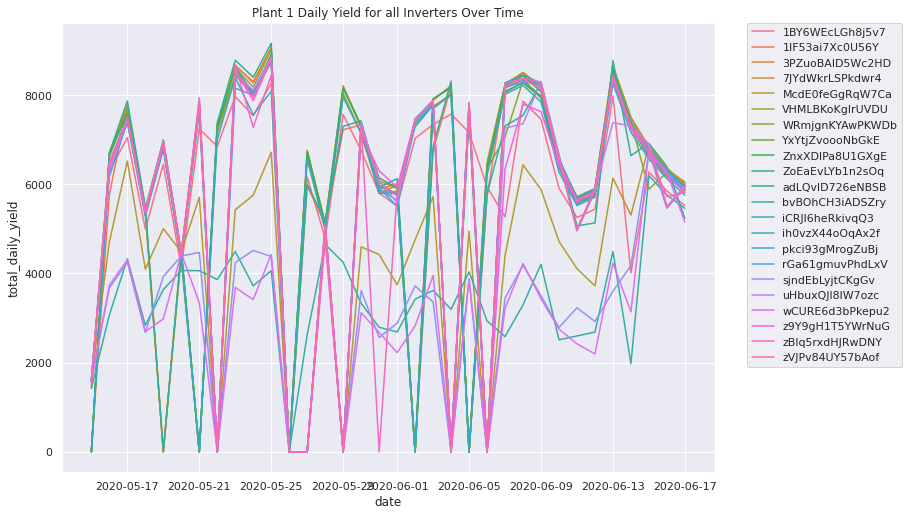

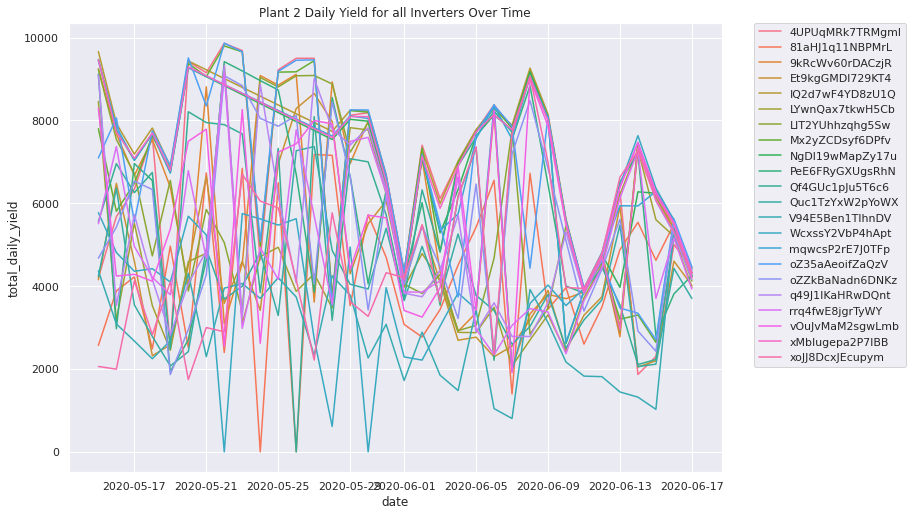

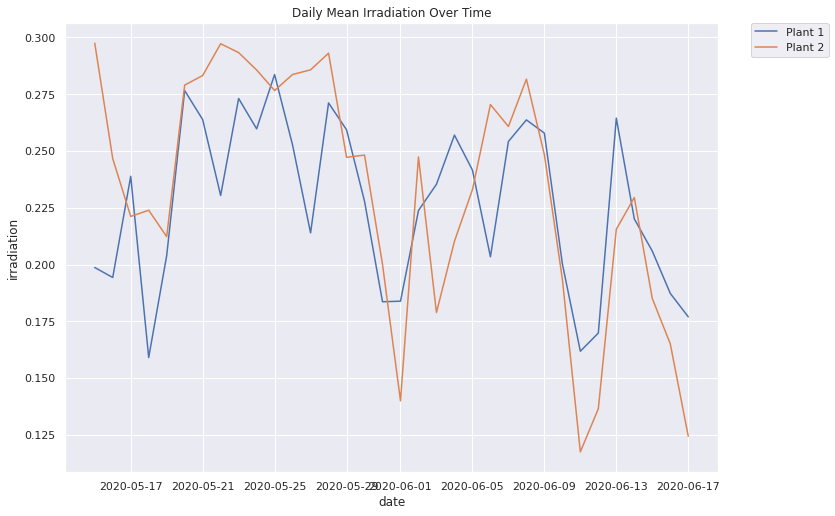

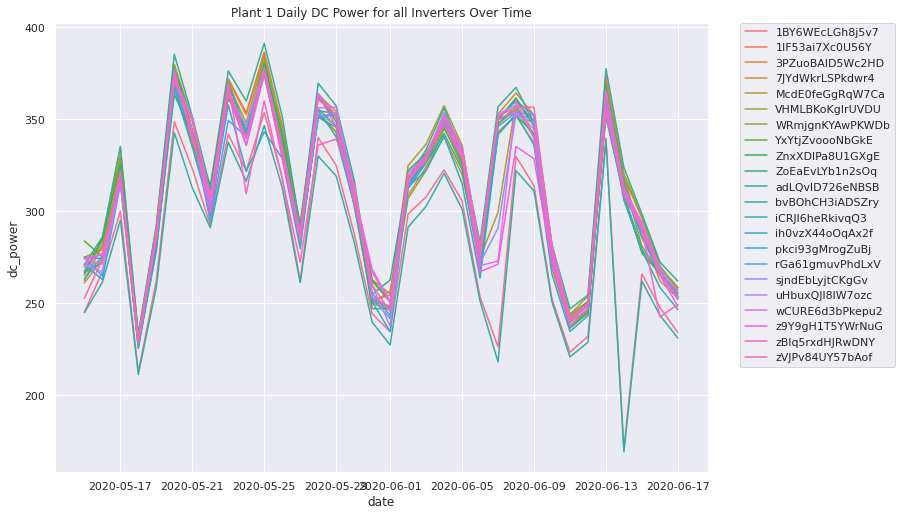

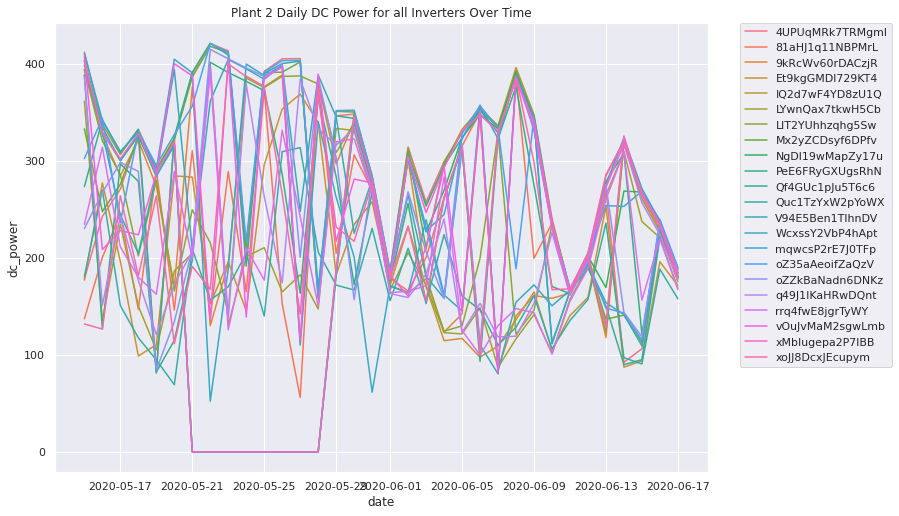

In [ ]:
p1_grouped = plant1.groupby(['source_key', 'date']).last().reset_index()
p2_grouped = plant2.groupby(['source_key', 'date']).last().reset_index()

sns.lineplot(data=p1_grouped, x='date', y='total_daily_yield', hue='source_key')
plt.title("Plant 1 Daily Yield for all Inverters Over Time")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

sns.lineplot(data=p2_grouped, x='date', y='total_daily_yield', hue='source_key')
plt.title("Plant 2 Daily Yield for all Inverters Over Time")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

p1_mean_grouped = plant1.groupby('date').mean().reset_index()
p2_mean_grouped = plant2.groupby('date').mean().reset_index()

sns.lineplot(data=p1_mean_grouped, x='date', y='irradiation', label="Plant 1")
sns.lineplot(data=p2_mean_grouped, x='date', y='irradiation', label="Plant 2")
plt.title("Daily Mean Irradiation Over Time")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

p1_mean_grouped = plant1.groupby(['source_key', 'date']).mean().reset_index()
p2_mean_grouped = plant2.groupby(['source_key', 'date']).mean().reset_index()

sns.lineplot(data=p1_mean_grouped, x='date', y='dc_power', hue='source_key')
plt.title("Plant 1 Daily DC Power for all Inverters Over Time")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

sns.lineplot(data=p2_mean_grouped, x='date', y='dc_power', hue='source_key')
plt.title("Plant 2 Daily DC Power for all Inverters Over Time")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

It can be seen that plant 1 has some inverters that had no yield for some days. A couple of inverters has DC power that is lower than the rest.

In the meantime, plant 2 has more variation. Some inverters had no yield for some days, and one had no output for sever consecutive days.

The irradiation for both plants are mostly the same.

### Plotting overall inverter performance

Perhaps the variation of performance are caused by various factors, but the plot above only show the performance for each inverter. It would be wise to show the overall performance. I will plot it by hour of the day, for the entire time period.

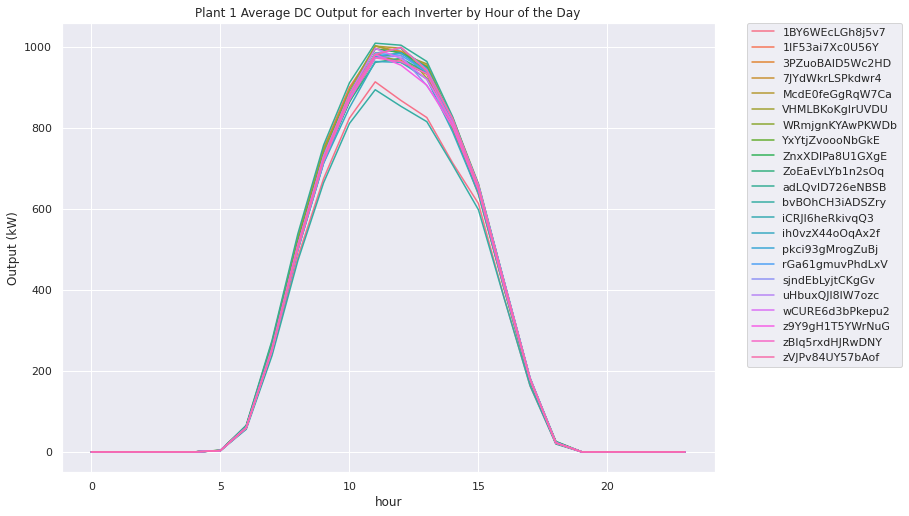

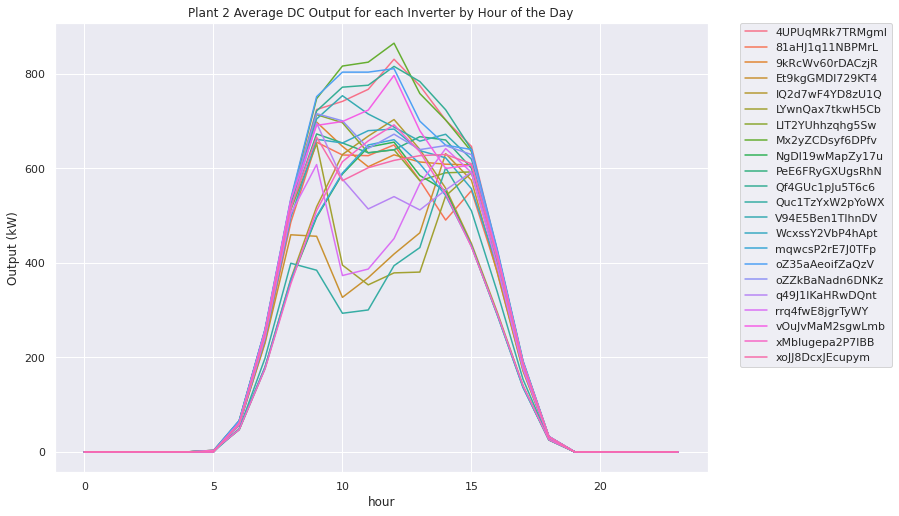

In [ ]:
p1_grouped = plant1.groupby(['source_key', 'hour']).last().reset_index()
p2_grouped = plant2.groupby(['source_key', 'hour']).last().reset_index()

sns.lineplot(data=p1_grouped, 
             x='hour', 
             y='avg_hourly_dc_power', 
             hue='source_key')
plt.title("Plant 1 Average DC Output for each Inverter by Hour of the Day")
plt.ylabel("Output (kW)")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

sns.lineplot(data=p2_grouped, 
             x='hour', 
             y='avg_hourly_dc_power', 
             hue='source_key')
plt.title("Plant 2 Average DC Output for each Inverter by Hour of the Day")
plt.ylabel("Output (kW)")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

Plant 1 has a couple of inverters withlower average DC power than the rest.

Plant 2 has so much variation.

On average, plant 1 has more consistency, but plant 2 has higher yield.

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

### Bivariate relationship plot

 Let's check the trend of correlation relationship between data

#### Plant 1

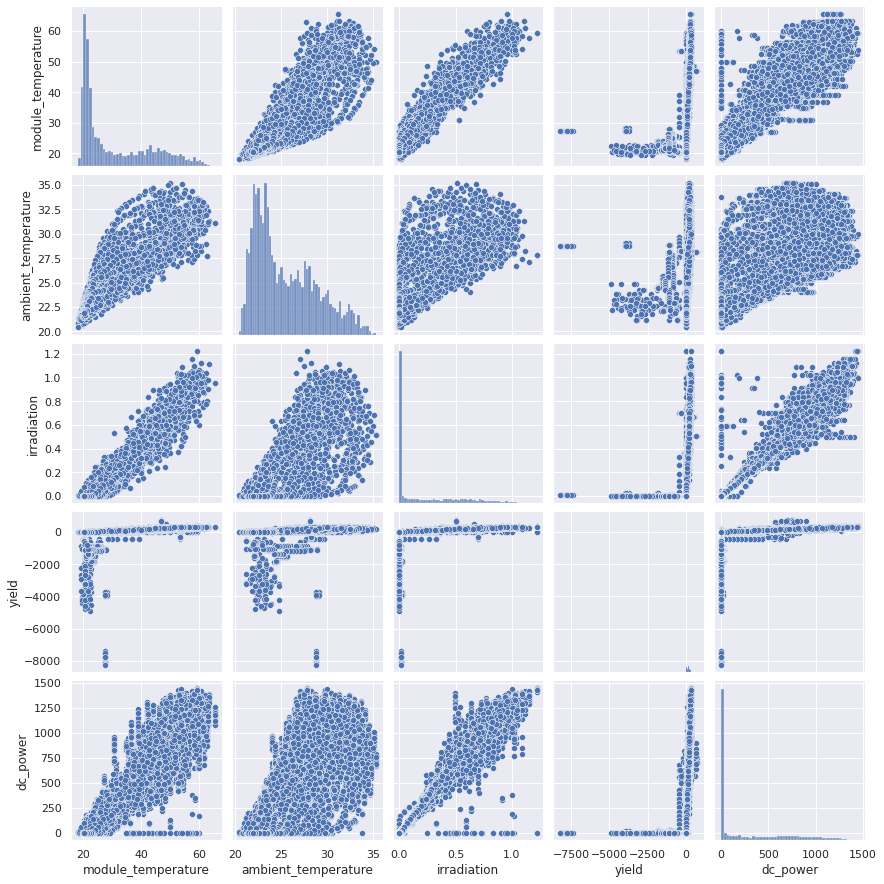

In [ ]:
sns.pairplot(data=plant1[['module_temperature', 'ambient_temperature', 
                          'irradiation', 'yield', 'dc_power']])
plt.show()

Seems like the data suitable for input are module_temperature and irradiation. WHile the one suitable for output is dc_power. The correlation data for yield is strange.

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

#### Plant 2

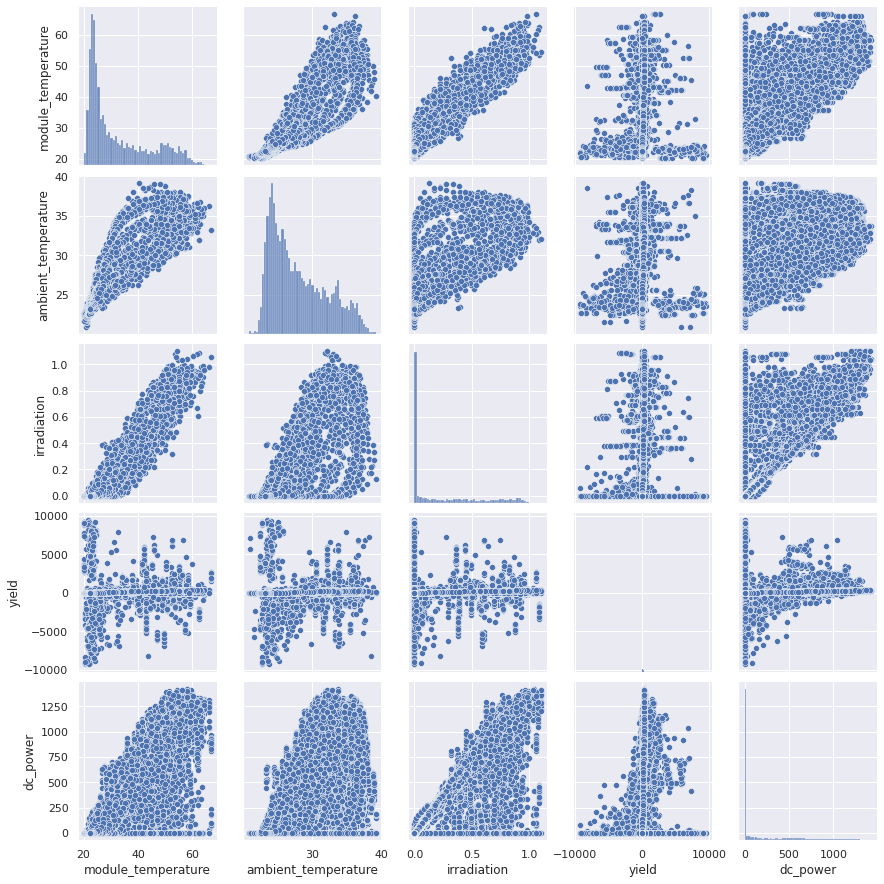

In [ ]:
sns.pairplot(data=plant2[['module_temperature', 'ambient_temperature',
                          'irradiation', 'yield', 'dc_power']])
plt.show()

The correlation relationship for this plant's data is similar to plant 1's. 

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

Measuring variable correlation through 3 other methods such as ***Pearson’s Correlation,  Spearman’s Correlation, dan Kendall’s Correlation*** to produce output in the form of heat maps and quantitative results.

### Pearson's Correlation

#### Plant 1

,module_temperature,ambient_temperature,irradiation,yield,dc_power
module_temperature,1.00000,0.85548,0.96190,0.44201,0.95541
ambient_temperature,0.85548,1.00000,0.72646,0.31806,0.72623
irradiation,0.96190,0.72646,1.00000,0.45272,0.98961
yield,0.44201,0.31806,0.45272,1.00000,0.45666
dc_power,0.95541,0.72623,0.98961,0.45666,1.00000


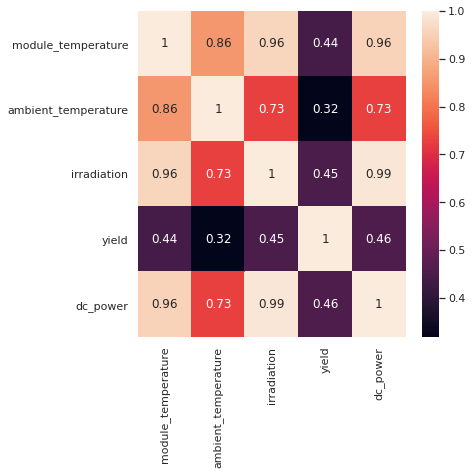

In [ ]:
plant1_corr = plant1[['module_temperature', 'ambient_temperature',
                          'irradiation', 'yield', 'dc_power']]
corr1 = plant1_corr.corr(method='pearson').round(5)

#Plotting hasil korelasi Pearson dalam persebaran heatmap dengan ukuran 10x10
fig, ax = plt.subplots(figsize=(6,6))
sns.heatmap(corr1,
            xticklabels=corr1.columns,
            yticklabels=corr1.columns,
            ax=ax,
            annot=True)
corr1

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

#### Plant 2

,module_temperature,ambient_temperature,irradiation,yield,dc_power
module_temperature,1.00000,0.84742,0.94685,0.10353,0.71221
ambient_temperature,0.84742,1.00000,0.66773,0.07948,0.52732
irradiation,0.94685,0.66773,1.00000,0.10298,0.74679
yield,0.10353,0.07948,0.10298,1.00000,0.17842
dc_power,0.71221,0.52732,0.74679,0.17842,1.00000


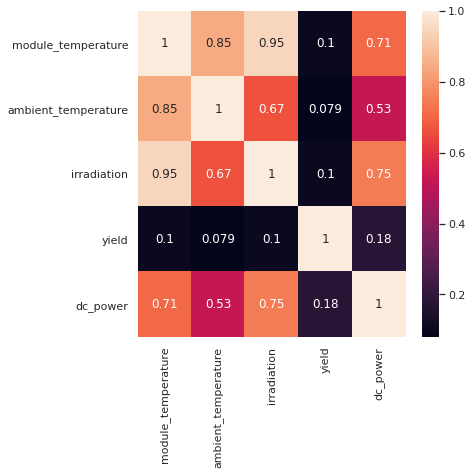

In [ ]:
plant2_corr = plant2[['module_temperature', 'ambient_temperature',
                          'irradiation', 'yield', 'dc_power']]
corr1 = plant2_corr.corr(method='pearson').round(5)

#Plotting hasil korelasi Pearson dalam persebaran heatmap dengan ukuran 10x10
fig, ax = plt.subplots(figsize=(6,6))
sns.heatmap(corr1,
            xticklabels=corr1.columns,
            yticklabels=corr1.columns,
            ax=ax,
            annot=True)
corr1

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

### Spearman's Correlation

#### Plant 1

,module_temperature,ambient_temperature,irradiation,yield,dc_power
module_temperature,1.00000,0.91019,0.89589,0.89144,0.89412
ambient_temperature,0.91019,1.00000,0.74188,0.74555,0.73954
irradiation,0.89589,0.74188,1.00000,0.97431,0.98726
yield,0.89144,0.74555,0.97431,1.00000,0.97906
dc_power,0.89412,0.73954,0.98726,0.97906,1.00000


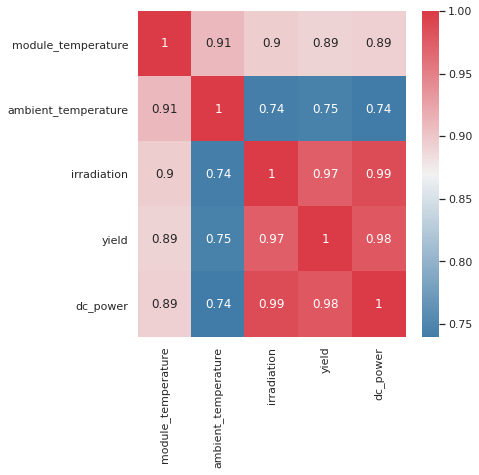

In [ ]:
plant1_corr = plant1[['module_temperature', 'ambient_temperature',
                          'irradiation', 'yield', 'dc_power']]
corr2 = plant1_corr.corr(method='spearman').round(5)

#Plotting hasil korelasi Spearman dalam perseberan heatmap dengan ukuran 10x10
fig, ax = plt.subplots(figsize=(6,6))
sns.heatmap(corr2,
            xticklabels=corr2.columns,
            yticklabels=corr2.columns,
            ax=ax,
            cmap=sns.diverging_palette(240, 10, as_cmap=True),
            annot=True)
corr2

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

#### Plant 2

,module_temperature,ambient_temperature,irradiation,yield,dc_power
module_temperature,1.00000,0.91627,0.85710,0.56231,0.66185
ambient_temperature,0.91627,1.00000,0.66304,0.42848,0.50508
irradiation,0.85710,0.66304,1.00000,0.65467,0.77214
yield,0.56231,0.42848,0.65467,1.00000,0.89626
dc_power,0.66185,0.50508,0.77214,0.89626,1.00000


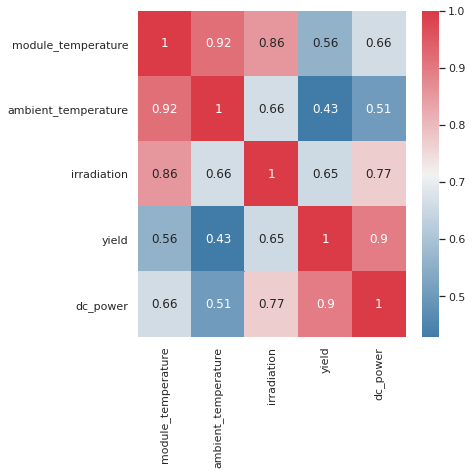

In [ ]:
plant2_corr = plant2[['module_temperature', 'ambient_temperature',
                          'irradiation', 'yield', 'dc_power']]
corr2 = plant2_corr.corr(method='spearman').round(5)

#Plotting hasil korelasi Spearman dalam perseberan heatmap dengan ukuran 10x10
fig, ax = plt.subplots(figsize=(6,6))
sns.heatmap(corr2,
            xticklabels=corr2.columns,
            yticklabels=corr2.columns,
            ax=ax,
            cmap=sns.diverging_palette(240, 10, as_cmap=True),
            annot=True)
corr2

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

### Kendall's Correlation

#### Plant 1

,module_temperature,ambient_temperature,irradiation,yield,dc_power
module_temperature,1.00000,0.84742,0.94685,0.10353,0.71221
ambient_temperature,0.84742,1.00000,0.66773,0.07948,0.52732
irradiation,0.94685,0.66773,1.00000,0.10298,0.74679
yield,0.10353,0.07948,0.10298,1.00000,0.17842
dc_power,0.71221,0.52732,0.74679,0.17842,1.00000


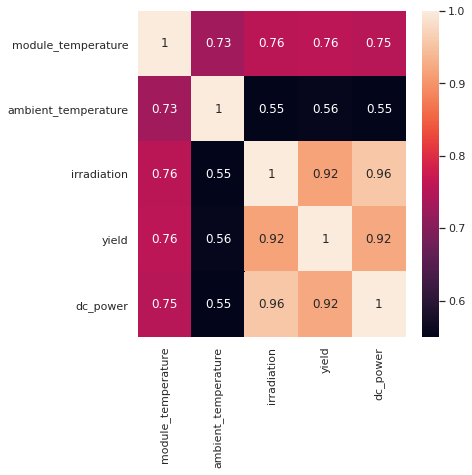

In [ ]:
plant1_corr = plant1[['module_temperature', 'ambient_temperature',
                          'irradiation', 'yield', 'dc_power']]
corr3 = plant1_corr.corr(method='kendall').round(5)

#Plotting hasil korelasi Pearson dalam persebaran heatmap dengan ukuran 10x10
fig, ax = plt.subplots(figsize=(6,6))
sns.heatmap(corr3,
            xticklabels=corr3.columns,
            yticklabels=corr3.columns,
            ax=ax,
            annot=True)
corr1

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

#### Plant 2

,module_temperature,ambient_temperature,irradiation,yield,dc_power
module_temperature,1.00000,0.84742,0.94685,0.10353,0.71221
ambient_temperature,0.84742,1.00000,0.66773,0.07948,0.52732
irradiation,0.94685,0.66773,1.00000,0.10298,0.74679
yield,0.10353,0.07948,0.10298,1.00000,0.17842
dc_power,0.71221,0.52732,0.74679,0.17842,1.00000


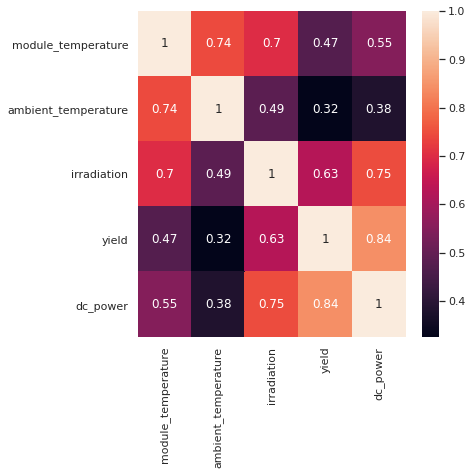

In [ ]:
plant2_corr = plant2[['module_temperature', 'ambient_temperature',
                          'irradiation', 'yield', 'dc_power']]
corr3 = plant2_corr.corr(method='kendall').round(5)

#Plotting hasil korelasi Pearson dalam persebaran heatmap dengan ukuran 10x10
fig, ax = plt.subplots(figsize=(6,6))
sns.heatmap(corr3,
            xticklabels=corr3.columns,
            yticklabels=corr3.columns,
            ax=ax,
            annot=True)
corr1

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

Temperature and irradiation are strongly corrrelated

Seems like the most suitable output data to be used is the output power, as yield has some strange correlation.

## Anomaly Detection

### Consistency check by 0 output

Consistency check can be performed by checking the standard deviation or the number of times the inverter stopped working (0 output or 0 yield). The latter one is easier to be worked with, as there are so many data that is according to the criteria.

In [ ]:
a = plant1[plant1['dc_power'] == 0] \
      .groupby('source_key')['date_time'] \
      .count().reset_index() \
      .rename(columns={"date_time": "nbr_zeros_dc_power"}) \
      .sort_values('nbr_zeros_dc_power', ascending=False)
b = plant1.groupby(['source_key'])[['source_key', 'avg_daily_yield']] \
      .mean().reset_index() \
      .sort_values('avg_daily_yield', ascending=False)
plant1_efficiency = pd.merge(a, b, how='inner', on='source_key')
 
a = plant2[plant2['dc_power'] == 0].groupby('source_key')['date_time'] \
      .count() \
      .reset_index() \
      .rename(columns={"date_time": "nbr_zeros_dc_power"}) \
      .sort_values('nbr_zeros_dc_power', ascending=False)
b = plant2.groupby(['source_key'])[['source_key', 'avg_daily_yield']] \
      .mean() \
      .reset_index() \
      .sort_values('avg_daily_yield', ascending=False)
plant2_efficiency = pd.merge(a, b, how='inner', on='source_key')

fig = px.scatter(
    plant1_efficiency, x='nbr_zeros_dc_power', y='avg_daily_yield', 
    color='source_key', hover_data=['source_key'],
    title="Plant 1 Inverter Avg Daily Yield by Nbr Occurrences of 0 DC Output"
)
fig.update_layout(shapes = [
    {'type': 'line', 'yref': 'paper', 'xref': 'paper',
     'y0': 0, 'y1': 1, 'x0': 0, 'x1': 1}
])
fig.show()

fig = px.scatter(
    plant2_efficiency, x='nbr_zeros_dc_power', y='avg_daily_yield', 
    color='source_key', hover_data=['source_key'],
    title="Plant 2 Inverter Avg Daily Yield by Nbr Occurrences of 0 DC Output"
)
fig.update_layout(shapes = [
    {'type': 'line', 'yref': 'paper', 'xref': 'paper', 
     'y0': 0, 'y1': 1, 'x0': 0, 'x1': 1}
])
fig.show()

The inverters on the upper left are the best, while the ones on the bottom right are the worst.

The worst ones are the faulty ones.

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

### Other alternative: plant DC power distribution & consistency check

If the inverters work well, they should be generate DC power when they receive irradiation. We will check if there is inverter that does not generate any DC power when it gains irradiation

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



Skewness: 0.169696
Kurtosis: -1.151650


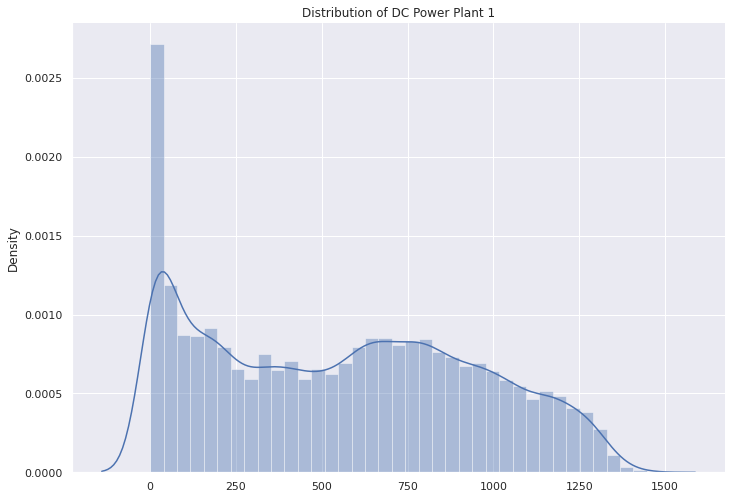

In [ ]:
plant1_dis = plant1[plant1['irradiation'] != 0]
sns.distplot(np.sort(plant1_dis['dc_power'].values))
plt.title("Distribution of DC Power Plant 1")
sns.despine()
print("Skewness: %f" % plant1_dis['dc_power'].skew())
print("Kurtosis: %f" % plant1_dis['dc_power'].kurt())

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



Skewness: 1.434584
Kurtosis: 0.814072


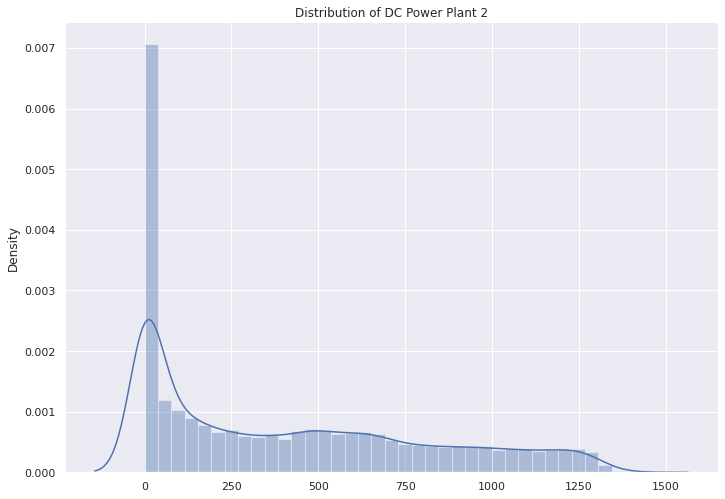

In [ ]:
plant2_dis = plant2[plant2['irradiation'] != 0]
sns.distplot(np.sort(plant2_dis['dc_power'].values))
plt.title("Distribution of DC Power Plant 2")
sns.despine()
print("Skewness: %f" % plant2['dc_power'].skew())
print("Kurtosis: %f" % plant2['dc_power'].kurt())

Anomalies can be found using dc power and average daily yield data. An inverter that works well is an inverter that produces high DC power and average daily yield consistently when it receieve irradiation.The inverters on the upper right are the best, while the ones on the bottom left are the worst. Inverters that need to be repaired are determined by limiting the margin of error on the dc power data and average daily yield with confidence level 95%

In [ ]:
plant1_a = plant1_dis.groupby('source_key')['dc_power'].mean().reset_index()
plant1_b = plant1_dis.groupby('source_key')['avg_daily_yield'].mean() \
                                                              .reset_index()
plant1_efficiency = pd.merge(plant1_a, plant1_b, how='inner', on='source_key') \
                    .sort_values('avg_daily_yield', ascending=False)

mean_dc = plant1_efficiency['dc_power'].mean()
mean_avg = plant1_efficiency['avg_daily_yield'].mean()
moe_dc = 1.96*plant1_efficiency['dc_power'].std()/np.sqrt(len(plant1_efficiency))
moe_avg = 1.96*plant1_efficiency['avg_daily_yield'].std()/np.sqrt(len(plant1_efficiency))

anomalies = plant1_efficiency[ \
            (plant1_efficiency['dc_power'] < mean_dc-moe_dc) & \
            (plant1_efficiency['avg_daily_yield']< mean_avg-moe_avg)]

plant1_efficiency['condition'] = np.where(plant1_efficiency \
                                          .source_key \
                                          .isin(anomalies.source_key), \
                                          'need to be fixed', 'good')


fig = px.scatter(
    plant1_efficiency, x='dc_power', y='avg_daily_yield', 
    color='condition', hover_data=['source_key'],
    title="Plant 1 Inverter Avg Daily Yield vs DC Power Generated"
)
fig.show()

print('Source Key of Plant 1 Inverter that Need to be Repaired:')
print(anomalies.source_key.to_string(index=False))

Source Key of Plant 1 Inverter that Need to be Repaired:
 bvBOhCH3iADSZry


It can be seen that most inverters on plant 1 produce high DC power and average daily yield consistently. Only a few inverters need repair so the anomalies can be deciced easily. With current data, there is only 1 inverter in plant 1 that need repair.

In [ ]:
plant2_a = plant2_dis.groupby('source_key')['dc_power'].mean().reset_index()
plant2_b = plant2_dis.groupby('source_key')['avg_daily_yield'].mean() \
                                                              .reset_index()
plant2_efficiency = pd.merge(plant2_a, plant2_b, how='inner', on='source_key') \
                    .sort_values('avg_daily_yield', ascending=False)

mean_dc = plant2_efficiency['dc_power'].mean()
mean_avg = plant2_efficiency['avg_daily_yield'].mean()
moe_dc = 1.96*plant2_efficiency['dc_power'].std()/np.sqrt(len(plant2_efficiency))
moe_avg = 1.96*plant2_efficiency['avg_daily_yield'].std()/np.sqrt(len(plant2_efficiency))

anomalies = plant2_efficiency[ \
            (plant2_efficiency['dc_power'] < mean_dc-moe_dc) & \
            (plant2_efficiency['avg_daily_yield']< mean_avg-moe_avg)]

plant2_efficiency['condition'] = np.where(plant2_efficiency.source_key \
                                          .isin(anomalies.source_key), \
                                          'need to be fixed', 'good')

fig = px.scatter(
    plant2_efficiency, x='dc_power', y='avg_daily_yield', 
    color='condition', hover_data=['source_key'],
    title="Plant 2 Inverter Avg Daily Yield vs DC Power Generated"
)
fig.show()

mean_dc = plant2_efficiency['dc_power'].mean()
mean_avg = plant2_efficiency['avg_daily_yield'].mean()
 
print('Source Key of Plant 2 Inverter that Need to be Repaired:')
print(anomalies.source_key.to_string(index=False))

Source Key of Plant 2 Inverter that Need to be Repaired:
 rrq4fwE8jgrTyWY
 LYwnQax7tkwH5Cb
 Et9kgGMDl729KT4
 Quc1TzYxW2pYoWX


It can be seen that inverter plant 2 performs worse than plant 1. Inverters in plant 2 have different performances so that anomalies are difficult to see. With current data, there are 4 inverters in plant 2 that need repair.

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

### Performance check

Checking for times when the output is low, while the input is high. This means checking for times when inverter performance is low, when irradiation is high.

#### Filter out faulty inverters

In [ ]:
plant1_good = plant1[plant1['avg_daily_yield']>4000].copy() 
plant2_good = plant2[plant2['avg_daily_yield']>4700].copy()

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

### Regress dc_power against module_temperature and irradiation

dc_power only seems to be linearly related to irradiation and module_temperature. So, some linear regression will be done. The result from the regression can be used to check for anomalies in dc_power.

No bias will be added, as there must be no power when there is no irradiation.

#### Plant 1

In [ ]:
# Define inputs and outputs matrix
inputs = torch.Tensor(plant1_good[['module_temperature', 
                                   'irradiation']].values)
targets = torch.Tensor(plant1_good[['dc_power']].values)

inputs = Variable(inputs)
targets = Variable(targets)

# Use CUDA if available
if torch.cuda.is_available():
  inputs.cuda()
  targets.cuda()

# Define input and output vector's dimension
input_dim = inputs.shape[1]
output_dim = targets.shape[1]

# Define dataset
train_ds = TensorDataset(inputs, targets)

# Define data loader
batch_size = 4
train_dl = DataLoader(train_ds, batch_size, shuffle=True)

# Define model
model = nn.Linear(input_dim, output_dim, bias=False)

# Define optimizer
opt = torch.optim.SGD(model.parameters(), lr=5*1e-5)

# Define loss function
loss_fn = F.mse_loss

# Training
num_epochs = 100
loss_arr = np.zeros(num_epochs)
for epoch in range(num_epochs):
  for step, (xb, yb) in enumerate(train_dl):
    b_x = Variable(xb)
    b_y = Variable(yb)
    # Generate predictions
    pred = model(b_x)
    loss = loss_fn(pred, b_y)
    #print(loss)

    # Perform gradient descent
    opt.zero_grad()
    loss.backward()
    opt.step()

  # Storing loss value
  loss_val = loss_fn(model(inputs), targets)
  loss_arr[epoch] = loss_val.detach().numpy()
  print("[", epoch+1, "/", num_epochs, "], Loss: ", loss_arr[epoch]+0)

[ 1 / 100 ], Loss:  67835.2265625
[ 2 / 100 ], Loss:  60469.5625
[ 3 / 100 ], Loss:  51285.75390625
[ 4 / 100 ], Loss:  46402.7421875
[ 5 / 100 ], Loss:  41425.8984375
[ 6 / 100 ], Loss:  37113.55859375
[ 7 / 100 ], Loss:  31976.30078125
[ 8 / 100 ], Loss:  28845.37890625
[ 9 / 100 ], Loss:  25717.248046875
[ 10 / 100 ], Loss:  23107.236328125
[ 11 / 100 ], Loss:  20377.1953125
[ 12 / 100 ], Loss:  18547.873046875
[ 13 / 100 ], Loss:  17309.2421875
[ 14 / 100 ], Loss:  14816.548828125
[ 15 / 100 ], Loss:  13394.4384765625
[ 16 / 100 ], Loss:  12133.765625
[ 17 / 100 ], Loss:  11052.033203125
[ 18 / 100 ], Loss:  10110.6005859375
[ 19 / 100 ], Loss:  9223.8037109375
[ 20 / 100 ], Loss:  8435.359375
[ 21 / 100 ], Loss:  8147.53369140625
[ 22 / 100 ], Loss:  7262.25341796875
[ 23 / 100 ], Loss:  6814.62744140625
[ 24 / 100 ], Loss:  6472.08056640625
[ 25 / 100 ], Loss:  5816.67333984375
[ 26 / 100 ], Loss:  5451.2275390625
[ 27 / 100 ], Loss:  5216.2880859375
[ 28 / 100 ], Loss:  4866.836

Showing the loss value for each epoch

[Text(0, 0.5, 'loss value'),
 Text(0.5, 0, 'epoch'),
 Text(0.5, 1.0, 'Loss Value for Each Epoch')]

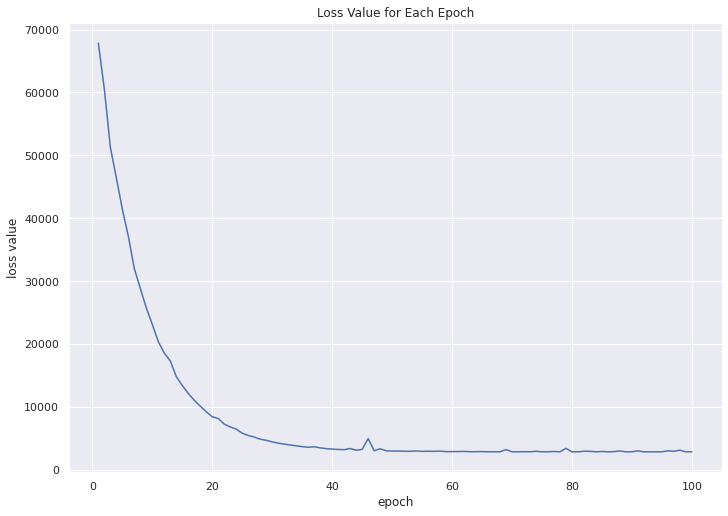

In [ ]:
# Plotting loss value
x = np.arange(1, num_epochs+1, 1)
ax = plt.axes()
ax.plot(x, loss_arr)
ax.set(xlabel='epoch', ylabel='loss value', title='Loss Value for Each Epoch')

It might also be wise to see where the prediction differs from the actual value.

A line plot will show the difference between the actual and predicted values.

Then, two scatter plots will show when the difference happened. One for each inverter, and one for average power output.

In [ ]:
# Checking where dc_power is lower than expected

# Calculate residuals
preds = model(inputs).detach().numpy()
actual_output = np.reshape(plant1_good['dc_power'].to_numpy(), 
                           (len(plant1_good['dc_power'].to_numpy()), 1))
residuals = preds - actual_output

# 1 means dc_power is lower than expected, and vice versa
plant1_good['lower_power_than_expected'] = np.where(residuals > 0, 1, 0)

# Average of the above dataframe
plant1_good['1day_ma_of_lower_power_than_expected'] \
    = plant1_good.groupby('date')['lower_power_than_expected'] \
      .transform(np.mean)

Plotting for both predicted and actual power output

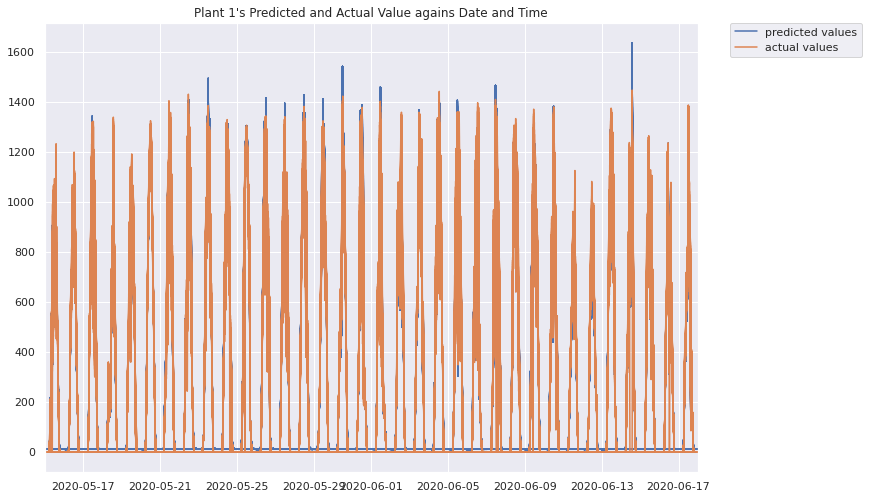

In [ ]:
# Plotting
x = np.reshape(plant1_good['date_time'].to_numpy(), 
               (len(plant1_good['dc_power'].to_numpy()), 1))
y1 = preds
y2 = actual_output

plt.title("Plant 1's Predicted and Actual Value agains Date and Time")
plt.plot(x, y1, label='predicted values')
plt.plot(x, y2, label='actual values')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xlim(plant1_good.date_time.min(), plant1_good.date_time.max())
plt.show()

Plotting for when the power is lower than expected for individual inverter and daily average

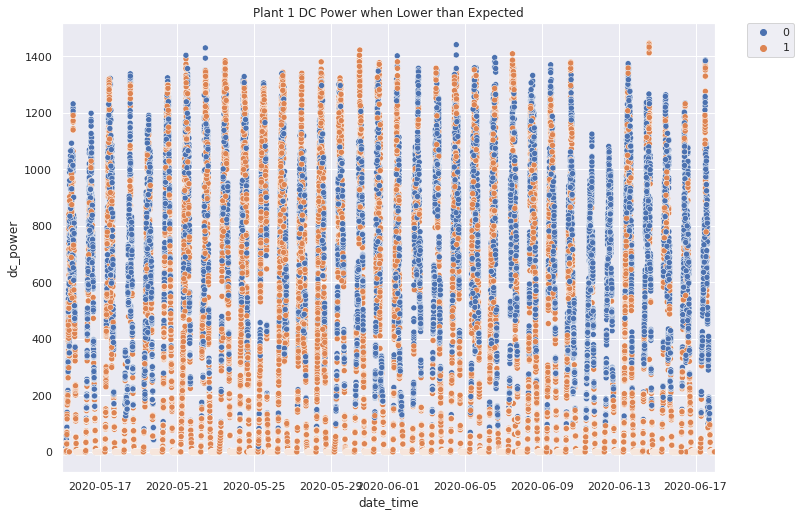

In [ ]:
# Individual inverter
sns.scatterplot(data=plant1_good, 
                x='date_time', 
                y='dc_power', 
                hue='lower_power_than_expected')
plt.title('Plant 1 DC Power when Lower than Expected')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xlim(plant1_good.date_time.min(), plant1_good.date_time.max())
plt.show()

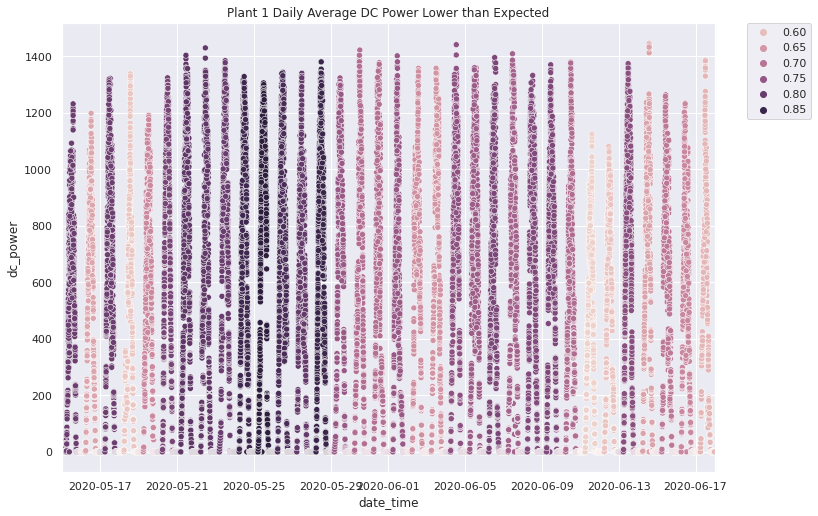

In [ ]:
# Daily average
sns.scatterplot(data=plant1_good, 
                x='date_time', 
                y='dc_power', 
                hue='1day_ma_of_lower_power_than_expected')
plt.title("Plant 1 Daily Average DC Power Lower than Expected")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xlim(plant1_good.date_time.min(), plant1_good.date_time.max())
plt.show()

It can be seen that there are times when dc_power is lower than expected. There might be various factor that contribute to this phenomenom, such as weather, temperature, and humidity. But, for simplicity's sake let's assume that the panels need cleaning. Either way, there is not enough data to accurately pinpoint the exact cause.

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

#### Plant 2

In [ ]:
# Define inputs and outputs matrix
inputs = torch.Tensor(plant2_good[['module_temperature', 
                                   'irradiation']].values)
targets = torch.Tensor(plant2_good[['dc_power']].values)

inputs = Variable(inputs)
targets = Variable(targets)

# Use CUDA if available
if torch.cuda.is_available():
  inputs.cuda()
  targets.cuda()

# Define input and output vector's dimension
input_dim = inputs.shape[1]
output_dim = targets.shape[1]

# Define dataset
train_ds = TensorDataset(inputs, targets)

# Define data loader
batch_size = 4
train_dl = DataLoader(train_ds, batch_size, shuffle=True)

# Define model
model = nn.Linear(input_dim, output_dim, bias=False)

# Define optimizer
opt = torch.optim.SGD(model.parameters(), lr=0.00002)

# Define loss function
loss_fn = F.mse_loss

# Training
num_epochs = 100
loss_arr = np.zeros(num_epochs)
for epoch in range(num_epochs):
  for step, (xb, yb) in enumerate(train_dl):
    b_x = Variable(xb)
    b_y = Variable(yb)
    # Generate predictions
    pred = model(b_x)
    loss = loss_fn(pred, b_y)

    # Perform gradient descent
    opt.zero_grad()
    loss.backward()
    opt.step()

  # Storing loss value
  loss_val = loss_fn(model(inputs), targets)
  loss_arr[epoch] = loss_val.detach().numpy()
  print("[", epoch+1, "/", num_epochs, "], Loss: ", loss_arr[epoch])

[ 1 / 100 ], Loss:  98094.0625
[ 2 / 100 ], Loss:  93274.4296875
[ 3 / 100 ], Loss:  91450.7421875
[ 4 / 100 ], Loss:  92923.3515625
[ 5 / 100 ], Loss:  87865.3359375
[ 6 / 100 ], Loss:  87696.8515625
[ 7 / 100 ], Loss:  84940.375
[ 8 / 100 ], Loss:  84276.9140625
[ 9 / 100 ], Loss:  82098.15625
[ 10 / 100 ], Loss:  80959.1171875
[ 11 / 100 ], Loss:  80150.03125
[ 12 / 100 ], Loss:  78658.5625
[ 13 / 100 ], Loss:  77473.984375
[ 14 / 100 ], Loss:  76377.171875
[ 15 / 100 ], Loss:  78284.2734375
[ 16 / 100 ], Loss:  74528.34375
[ 17 / 100 ], Loss:  73692.078125
[ 18 / 100 ], Loss:  72840.5859375
[ 19 / 100 ], Loss:  72040.703125
[ 20 / 100 ], Loss:  74169.5078125
[ 21 / 100 ], Loss:  70640.0625
[ 22 / 100 ], Loss:  69904.0546875
[ 23 / 100 ], Loss:  71524.640625
[ 24 / 100 ], Loss:  69246.0
[ 25 / 100 ], Loss:  69954.1796875
[ 26 / 100 ], Loss:  68742.28125
[ 27 / 100 ], Loss:  67049.921875
[ 28 / 100 ], Loss:  67596.4375
[ 29 / 100 ], Loss:  67030.375
[ 30 / 100 ], Loss:  65734.1171875

Plotting loss value for each epoch

[Text(0, 0.5, 'loss value'),
 Text(0.5, 0, 'epoch'),
 Text(0.5, 1.0, 'Loss Value for Each Epoch')]

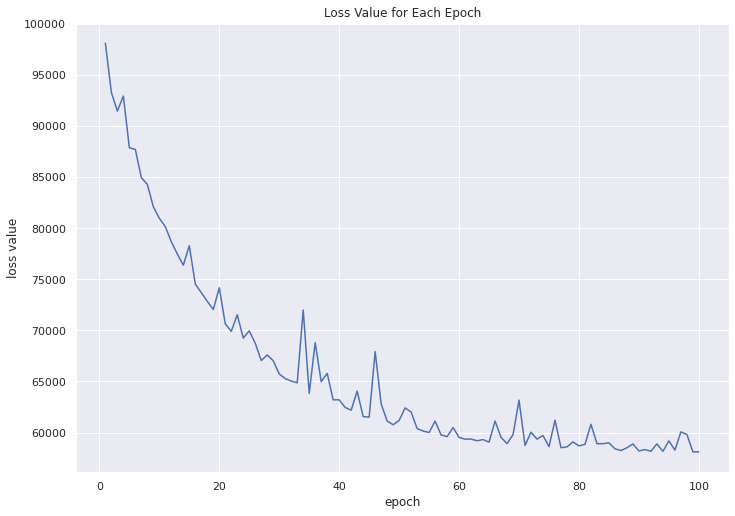

In [ ]:
# Plotting loss value
x = np.arange(1, num_epochs+1, 1)
ax = plt.axes()
ax.plot(x, loss_arr)
ax.set(xlabel='epoch', ylabel='loss value', title='Loss Value for Each Epoch')

To see where the prediction differs from actual value. Basically the same as plant 1's.

In [ ]:
# Checking where dc_power is lower than expected

# Calculate residuals
preds = model(inputs).detach().numpy()
actual_output = np.reshape(plant2_good['dc_power'].to_numpy(), 
                           (len(plant2_good['dc_power'].to_numpy()), 1))
residuals = preds - actual_output

# 1 means dc_power is lower than expected, and vice versa
plant2_good['lower_power_than_expected'] = np.where(residuals > 0, 1, 0)

# Average of the above dataframe
plant2_good['1day_ma_of_lower_power_than_expected'] \
    = plant2_good.groupby('date')['lower_power_than_expected'] \
      .transform(np.mean)

Plotting for both predicted and actual power output

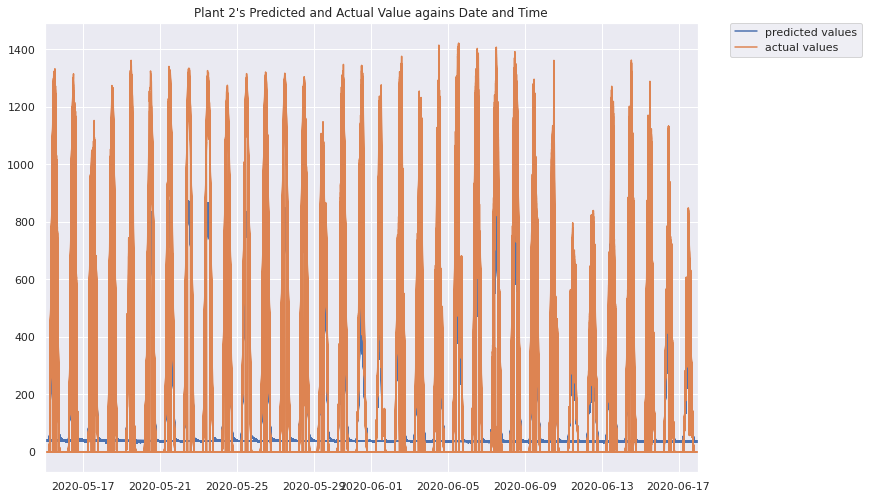

In [ ]:
# Plotting
x = np.reshape(plant2_good['date_time'].to_numpy(), 
               (len(plant2_good['dc_power'].to_numpy()), 1))
y1 = preds
y2 = actual_output

plt.title("Plant 2's Predicted and Actual Value agains Date and Time")
plt.plot(x, y1, label='predicted values')
plt.plot(x, y2, label='actual values')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xlim(plant1_good.date_time.min(), plant1_good.date_time.max())
plt.show()

Plotting for when the power is lower than expected for individual inverter and daily average

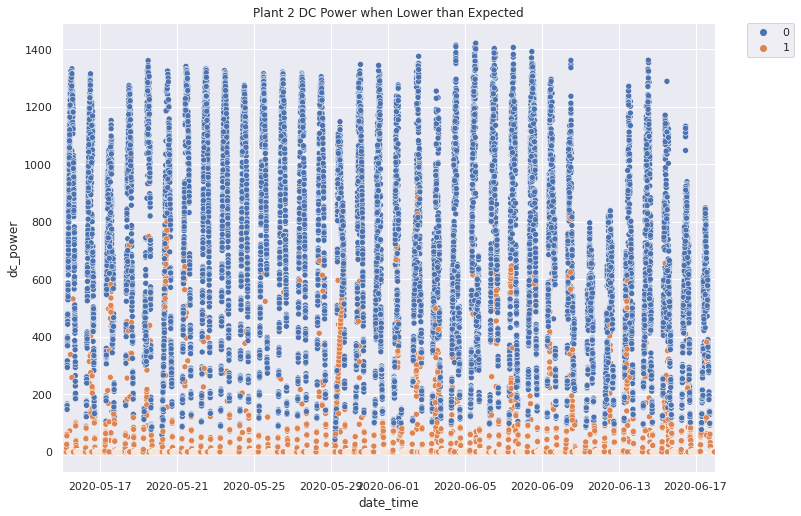

In [ ]:
# Individual inverter
sns.scatterplot(data=plant2_good, 
                x='date_time', 
                y='dc_power', 
                hue='lower_power_than_expected')
plt.title('Plant 2 DC Power when Lower than Expected')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xlim(plant1_good.date_time.min(), plant2_good.date_time.max())
plt.show()

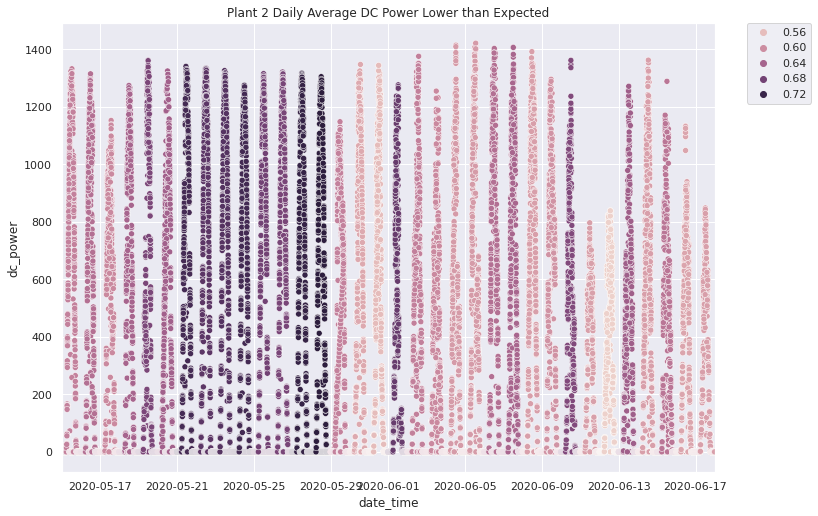

In [ ]:
# Daily average
sns.scatterplot(data=plant2_good, 
                x='date_time', 
                y='dc_power', 
                hue='1day_ma_of_lower_power_than_expected')
plt.title("Plant 2 Daily Average DC Power Lower than Expected")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xlim(plant2_good.date_time.min(), plant2_good.date_time.max())
plt.show()

It can be seen that there are times when dc_power is lower than expected. This case is similar to plant 1's.

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

# Forecasting

LSTM will be used for forecasting future dc_power, as it is much better than regular two layer neural network for linear regression. This happens because the data for the factors are incomplete, such as no data for the stain on the panel or the weather is present.

## LSTM class

In [ ]:
class Net(torch.nn.Module):
  def __init__(self, n_features, seq_length):
    super(Net, self).__init__()
    self.n_features = n_features
    self.seq_len = seq_length
    self.n_hidden = 100 # number of hidden states
    self.n_layers = 1 # number of LSTM layers (stacked)
    
    self.l_lstm = nn.LSTM(input_size = n_features, 
                          hidden_size = self.n_hidden,
                          num_layers = self.n_layers, 
                          batch_first = True)
    self.l_linear = nn.Linear(self.n_hidden*self.seq_len, 1, bias=False)
    
  def init_hidden(self, batch_size):
    hidden_state = torch.zeros(self.n_layers, batch_size, self.n_hidden)
    cell_state = torch.zeros(self.n_layers, batch_size, self.n_hidden)
    self.hidden = (hidden_state, cell_state)
    
  def forward(self, x):        
    batch_size, seq_len, _ = x.size()
        
    lstm_out, self.hidden = self.l_lstm(x, self.hidden)
    x = lstm_out.contiguous().view(batch_size, -1)
    return self.l_linear(x)

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

## For splitting sequences into samples

In [ ]:
# Function to split sequences into samples
def split_sequences(sequences, n_steps):
  x, y = list(), list()
  for index in range(len(sequences)):
    # Find the end of this pattern
    end_index = index + n_steps
        
    # Check if we are beyond the dataset
    if end_index > len(sequences):
      break
        
    # Gather input and output parts of the pattern
    seq_x, seq_y = sequences[index:end_index, :-1], sequences[end_index-1, -1]
    x.append(seq_x)
    y.append(seq_y)
        
  return np.array(x), np.array(y)

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

## Plant 1

### Defining training data and test data

In [ ]:
# Define training data and test data
p1_train_data = plant1_good[['module_temperature', 'irradiation', 'dc_power']] \
                .values.astype('float32')
p1_test_data = p1_train_data

### Define number of features and timesteps

In [ ]:
n_features = 2
n_timesteps = 1

### Convert dataset into inputs and outputs

In [ ]:
x, y = split_sequences(p1_train_data, n_timesteps)

### Create neural network

In [ ]:
net = Net(n_features, n_timesteps)
loss_fn = nn.MSELoss()
opt = optim.Adam(net.parameters(), lr=5*1e-4)

### Define number of epochs and training batch size

In [ ]:
num_epochs = 25
batch_size = 18

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

### Training

In [ ]:
net.train()

n = math.floor(len(x)/batch_size)
x_input = n*batch_size

loss_arr = np.zeros(num_epochs)
for epoch in range(num_epochs):
  for batch in range(0, x_input, batch_size):
    input = x[batch : batch+batch_size, :, :]
    target = y[batch : batch+batch_size]

    x_batch = torch.tensor(input, dtype=torch.float32)
    y_batch = torch.tensor(target, dtype=torch.float32)
    if torch.cuda.is_available():
      x_batch.cuda()
      y_batch.cuda()

    net.init_hidden(x_batch.size(0))
    output = net(x_batch)
    loss = loss_fn(output.view(-1), y_batch)

    loss.backward()
    opt.step()
    opt.zero_grad()

  loss_arr[epoch] = loss.item()
  print("[", epoch+1, "/", num_epochs, "], Loss: ", loss_arr[epoch])

[ 1 / 25 ], Loss:  1013.804931640625
[ 2 / 25 ], Loss:  168.69744873046875
[ 3 / 25 ], Loss:  65.1490249633789
[ 4 / 25 ], Loss:  17.938026428222656
[ 5 / 25 ], Loss:  2.755007028579712
[ 6 / 25 ], Loss:  2.354524850845337
[ 7 / 25 ], Loss:  3.3706212043762207
[ 8 / 25 ], Loss:  1.1198787689208984
[ 9 / 25 ], Loss:  0.0899738147854805
[ 10 / 25 ], Loss:  1.6086279153823853
[ 11 / 25 ], Loss:  2.019075632095337
[ 12 / 25 ], Loss:  1.7999176979064941
[ 13 / 25 ], Loss:  1.7979161739349365
[ 14 / 25 ], Loss:  1.6017320156097412
[ 15 / 25 ], Loss:  1.0881762504577637
[ 16 / 25 ], Loss:  0.6021087169647217
[ 17 / 25 ], Loss:  0.344530314207077
[ 18 / 25 ], Loss:  0.17257888615131378
[ 19 / 25 ], Loss:  0.07439957559108734
[ 20 / 25 ], Loss:  0.03466348350048065
[ 21 / 25 ], Loss:  0.03349102661013603
[ 22 / 25 ], Loss:  0.045517511665821075
[ 23 / 25 ], Loss:  0.05315788462758064
[ 24 / 25 ], Loss:  0.05535542964935303
[ 25 / 25 ], Loss:  0.05532728135585785


In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

### Plotting the loss value for each epoch

[Text(0, 0.5, 'loss value'),
 Text(0.5, 0, 'epoch'),
 Text(0.5, 1.0, 'Loss Value for Each Epoch')]

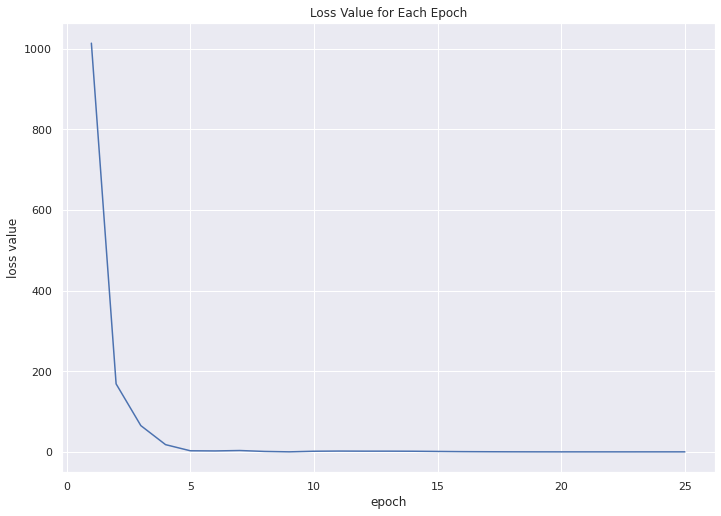

In [ ]:
x = np.arange(1, num_epochs+1, 1)
ax = plt.axes()
ax.plot(x, loss_arr)
ax.set(xlabel='epoch', ylabel='loss value', title='Loss Value for Each Epoch')

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

### Predicting the values

In [ ]:
x, _ = split_sequences(p1_test_data, n_timesteps)

n = math.floor(len(x)/batch_size)
x_input = n*batch_size

p1_preds_arr = np.array([0 for _ in range(0, 
                                          x_input, 
                                          1)], 
                        dtype=np.float32)

for batch in range(0, x_input, batch_size):

  input = x[batch : batch+batch_size, :, :]

  x_batch = torch.tensor(input, dtype=torch.float32)
  if torch.cuda.is_available():
    x_batch.cuda()

  output = net(x_batch)
  p1_preds_arr[batch: batch+batch_size] = np.reshape(output.detach().numpy(),batch_size)  


In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

### Plotting dc_power and predicted dc_power

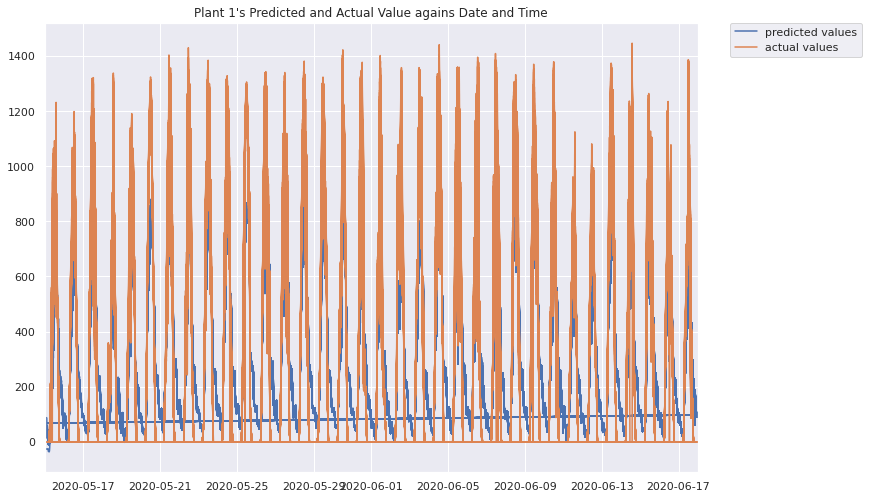

In [ ]:
x = np.reshape(plant1_good['date_time'].to_numpy(), 
               (len(plant1_good['dc_power'].to_numpy()), 1))
x= x[0:x_input,:]
y1 = p1_preds_arr
y2 = np.reshape(plant1_good['dc_power'].to_numpy(), 
                (len(plant1_good['dc_power'].to_numpy()), 1))
y2= y2[0:x_input,:]
plt.title("Plant 1's Predicted and Actual Value agains Date and Time")
plt.plot(x, y1, label='predicted values')
plt.plot(x, y2, label='actual values')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xlim(plant1_good.date_time.min(), plant1_good.date_time.max())
plt.show()

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

## Plant 2

### Defining training data and test data

In [ ]:
# Define training data and test data
p2_train_data = plant2_good[['module_temperature', 'irradiation', 'dc_power']] \
                .values.astype('float32')
p2_test_data = p2_train_data

### Define number of features and timesteps

In [ ]:
n_features = 2
n_timesteps = 1

### Convert dataset into inputs and outputs

In [ ]:
x, y = split_sequences(p2_train_data, n_timesteps)

### Create neural network

In [ ]:
net = Net(n_features, n_timesteps)
loss_fn = nn.MSELoss()
opt = optim.Adam(net.parameters(), lr=0.0004)

### Define number of epochs and training batch size

In [ ]:
num_epochs = 50
batch_size = 12

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

### Training

In [ ]:
net.train()

n = math.floor(len(x)/batch_size)
x_input = n*batch_size

loss_arr = np.zeros(num_epochs)
for epoch in range(num_epochs):
  for batch in range(0, x_input, batch_size):
    input = x[batch : batch+batch_size, :, :]
    target = y[batch : batch+batch_size]

    x_batch = torch.tensor(input, dtype=torch.float32)
    y_batch = torch.tensor(target, dtype=torch.float32)
    if torch.cuda.is_available():
      x_batch.cuda()
      y_batch.cuda()

    net.init_hidden(x_batch.size(0))
    output = net(x_batch)
    loss = loss_fn(output.view(-1), y_batch)

    loss.backward()
    opt.step()
    opt.zero_grad()

  loss_arr[epoch] = loss.item()
  print("[", epoch+1, "/", num_epochs, "], Loss: ", loss_arr[epoch])

[ 1 / 50 ], Loss:  2678.660400390625
[ 2 / 50 ], Loss:  910.4822387695312
[ 3 / 50 ], Loss:  142.41696166992188
[ 4 / 50 ], Loss:  32.244384765625
[ 5 / 50 ], Loss:  10.491303443908691
[ 6 / 50 ], Loss:  2.377514123916626
[ 7 / 50 ], Loss:  7.902172565460205
[ 8 / 50 ], Loss:  2.8931758403778076
[ 9 / 50 ], Loss:  0.7519574165344238
[ 10 / 50 ], Loss:  0.6287152767181396
[ 11 / 50 ], Loss:  1.4773932695388794
[ 12 / 50 ], Loss:  1.665732979774475
[ 13 / 50 ], Loss:  0.8608290553092957
[ 14 / 50 ], Loss:  0.726841926574707
[ 15 / 50 ], Loss:  2.4650323390960693
[ 16 / 50 ], Loss:  4.370765209197998
[ 17 / 50 ], Loss:  4.061713695526123
[ 18 / 50 ], Loss:  3.6631715297698975
[ 19 / 50 ], Loss:  3.400350332260132
[ 20 / 50 ], Loss:  2.627519369125366
[ 21 / 50 ], Loss:  1.9913039207458496
[ 22 / 50 ], Loss:  1.5032988786697388
[ 23 / 50 ], Loss:  1.2035146951675415
[ 24 / 50 ], Loss:  1.0672762393951416
[ 25 / 50 ], Loss:  1.0152267217636108
[ 26 / 50 ], Loss:  1.0267027616500854
[ 27 / 5

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

### Plotting the loss value for each epoch

[Text(0, 0.5, 'loss value'),
 Text(0.5, 0, 'epoch'),
 Text(0.5, 1.0, 'Loss Value for Each Epoch')]

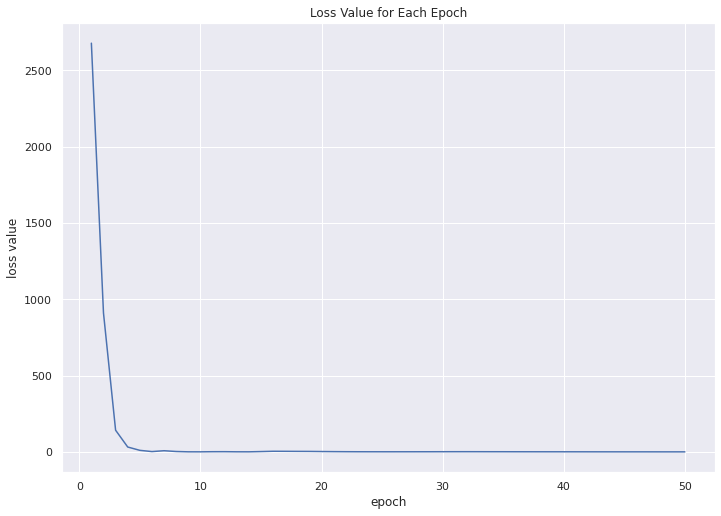

In [ ]:
x = np.arange(1, num_epochs+1, 1)
ax = plt.axes()
ax.plot(x, loss_arr)
ax.set(xlabel='epoch', ylabel='loss value', title='Loss Value for Each Epoch')

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

### Predicting the values

In [ ]:
x, _ = split_sequences(p2_test_data, n_timesteps)

n = math.floor(len(x)/batch_size)
x_input = n*batch_size

p2_preds_arr = np.array([0 for _ in range(0, 
                                          x_input, 
                                          1)], 
                        dtype=np.float32)

for batch in range(0, x_input, batch_size):

  input = x[batch : batch+batch_size, :, :]

  x_batch = torch.tensor(input, dtype=torch.float32)
  if torch.cuda.is_available():
    x_batch.cuda()

  output = net(x_batch)
  p2_preds_arr[batch: batch+batch_size] = np.reshape(output.detach().numpy(),12)


In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

### Plotting dc_power and predicted dc_power

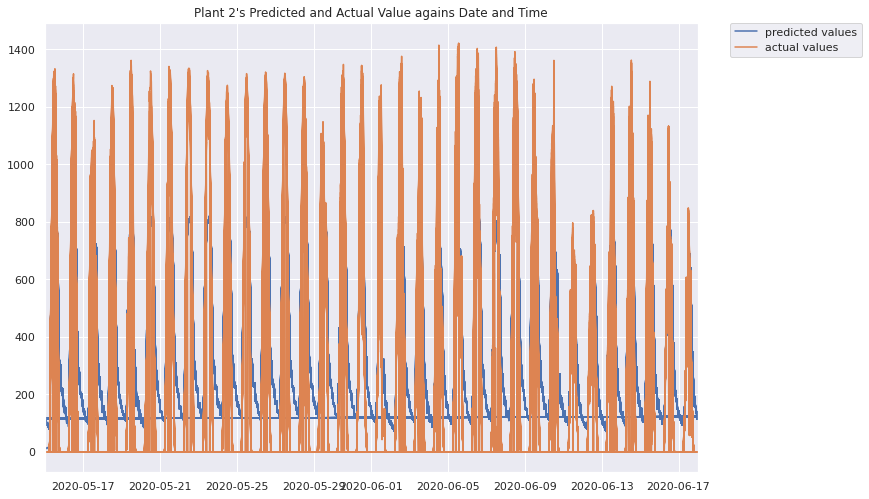

In [ ]:
x = np.reshape(plant2_good['date_time'].to_numpy(), 
               (len(plant2_good['dc_power'].to_numpy()), 1))
y1 = p2_preds_arr
y2 = np.reshape(plant2_good['dc_power'].to_numpy(), 
                (len(plant2_good['dc_power'].to_numpy()), 1))

plt.title("Plant 2's Predicted and Actual Value agains Date and Time")
plt.plot(x, y1, label='predicted values')
plt.plot(x, y2, label='actual values')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xlim(plant1_good.date_time.min(), plant1_good.date_time.max())
plt.show()

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

In [ ]:
# Storing runtime values
# For index meaning, look at the index explanation above
code_exec_time = runtime_arr

This is the end of modification program. For time measurement and comparison for each program, please check below source program (the last part of this notebook).
<hr style="border:1.5px solid gray"> </hr>

# From this point onwards, the codes are basically the same the source's

# The only modifications are time library for checking runtime



# Solar Power Generation: Anomaly Detection & Forecasting

This notebooks shows how important data cleaning and exploration is.  Simply throwing this data into an AutoML program for forecasting would be reckless, because there are too many gotchas in the way the data is measured and variables that are not included in this dataset but that are critical for solar power forecasting.  For example, there are no nulls, but that does not mean there are no missing observations.  

The notebook focuses on data cleaning and exploration, missing value imputation, visualization, anomaly and outlier detection, and forecasting.  However, it should be emphasized that the dataset has significant limitations when used for forecasting.  So it really should only be used for anomaly and outlier detection, or in other words, looking for faulty equipment.

In [ ]:
import pandas as pd
from collections import Counter
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression
import plotly.express as px

import tensorflow as tf
from tensorflow.keras.layers import Input, LSTM, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

import time

# Create buffer for checking runtime for each process

In [ ]:
'''
Index explanation :

- 0 : read datasets

Data Cleaning :
- 1 : convert date-times to pandas datetime format
- 2 : checking for null values
- 3 : counting missing data
- 4 : fill NaNs
- 5 : prepare data for merging
- 6 : figure out sunset and sunrise time
- 7 : create additional time features
- 8 : determine how total yield is calculated
- 9 : fill null values
- 10 : plotting data distribution for each plant
- 11 : fix unreasonably daily_yield values

Feature Engineering :
- 12 : calculate other useful features
- 13 : manually spot check the features
- 14 : inspect outliers in yield and hourly_yield
- 15 : remove some feature

Exploratory Data Analysis : 
- 16 : view an inverter's DC output over time
- 17 : plotting daily_yield, irradiation, and dc_power for all inverters
- 18 : plotting dc_output for each plant by the hour
- 19 : plotting bivariate relationship plot for each plant data
- 20 : searching for faulty inverters
- 21 : filter out faulty inverters and regress dc_power

Forecasting Future Output :
- 22 : LSTM class definition
- 23 : modelling each variable
- 24 : build LSTM object and training
- 25 : plotting loss
- 26 : forecasting using true targets
'''

runtime_arr = np.array([0 for _ in range(26+1)])
start_time = time.time()
prev_time = start_time
index = 0

# Preparing Dataset

In [ ]:
g1 = pd.read_csv("Plant_1_Generation_Data.csv")
g2 = pd.read_csv("Plant_2_Generation_Data.csv")
w1 = pd.read_csv("Plant_1_Weather_Sensor_Data.csv")
w2 = pd.read_csv("Plant_2_Weather_Sensor_Data.csv")

# I prefer to work with lowercase column names
for df in [g1, g2, w1, w2]:
    df.columns = [col.lower() for col in df.columns]
    print(df.info(), "\n")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68778 entries, 0 to 68777
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date_time    68778 non-null  object 
 1   plant_id     68778 non-null  int64  
 2   source_key   68778 non-null  object 
 3   dc_power     68778 non-null  float64
 4   ac_power     68778 non-null  float64
 5   daily_yield  68778 non-null  float64
 6   total_yield  68778 non-null  float64
dtypes: float64(4), int64(1), object(2)
memory usage: 3.7+ MB
None 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67698 entries, 0 to 67697
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date_time    67698 non-null  object 
 1   plant_id     67698 non-null  int64  
 2   source_key   67698 non-null  object 
 3   dc_power     67698 non-null  float64
 4   ac_power     67698 non-null  float64
 5   daily_yield  67698 non-null  float64
 

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

## Data Cleaning

Steps to take:
1. Convert date-times to Pandas datetime format.
2. Check for Null values and decide what to do with them.
3. Check for missing time steps (all sensors should have readings for the same datetimes), and insert Null values if there are missing time steps.
4. If Nulls are inserted for missing time steps, decide what to do with them.
5. Look for univariate outliers and decide what to do with them.

In [ ]:
# convert date-times to pandas datetime format
g1['date_time']= pd.to_datetime(g1['date_time'],format='%d-%m-%Y %H:%M')
g2['date_time']= pd.to_datetime(g2['date_time'],format='%Y-%m-%d %H:%M:%S')
w1['date_time']= pd.to_datetime(w1['date_time'],format='%Y-%m-%d %H:%M:%S')
w2['date_time']= pd.to_datetime(w2['date_time'],format='%Y-%m-%d %H:%M:%S')

for df in [g1, g2, w1, w2]:
    print(df.date_time.head(), "\n")

0   2020-05-15
1   2020-05-15
2   2020-05-15
3   2020-05-15
4   2020-05-15
Name: date_time, dtype: datetime64[ns] 

0   2020-05-15
1   2020-05-15
2   2020-05-15
3   2020-05-15
4   2020-05-15
Name: date_time, dtype: datetime64[ns] 

0   2020-05-15 00:00:00
1   2020-05-15 00:15:00
2   2020-05-15 00:30:00
3   2020-05-15 00:45:00
4   2020-05-15 01:00:00
Name: date_time, dtype: datetime64[ns] 

0   2020-05-15 00:00:00
1   2020-05-15 00:15:00
2   2020-05-15 00:30:00
3   2020-05-15 00:45:00
4   2020-05-15 01:00:00
Name: date_time, dtype: datetime64[ns] 



In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

In [ ]:
# check for null values
for df in [g1, g2, w1, w2]:
    print(df.isna().sum(), "\n")

date_time      0
plant_id       0
source_key     0
dc_power       0
ac_power       0
daily_yield    0
total_yield    0
dtype: int64 

date_time      0
plant_id       0
source_key     0
dc_power       0
ac_power       0
daily_yield    0
total_yield    0
dtype: int64 

date_time              0
plant_id               0
source_key             0
ambient_temperature    0
module_temperature     0
irradiation            0
dtype: int64 

date_time              0
plant_id               0
source_key             0
ambient_temperature    0
module_temperature     0
irradiation            0
dtype: int64 



In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

In [ ]:
# there are no nulls, but are there date-times that are completely missing from some sensors?
Counter(g1.source_key)

Counter({'1BY6WEcLGh8j5v7': 3154,
         '1IF53ai7Xc0U56Y': 3119,
         '3PZuoBAID5Wc2HD': 3118,
         '7JYdWkrLSPkdwr4': 3133,
         'McdE0feGgRqW7Ca': 3124,
         'VHMLBKoKgIrUVDU': 3133,
         'WRmjgnKYAwPKWDb': 3118,
         'YxYtjZvoooNbGkE': 3104,
         'ZnxXDlPa8U1GXgE': 3130,
         'ZoEaEvLYb1n2sOq': 3123,
         'adLQvlD726eNBSB': 3119,
         'bvBOhCH3iADSZry': 3155,
         'iCRJl6heRkivqQ3': 3125,
         'ih0vzX44oOqAx2f': 3130,
         'pkci93gMrogZuBj': 3125,
         'rGa61gmuvPhdLxV': 3124,
         'sjndEbLyjtCKgGv': 3124,
         'uHbuxQJl8lW7ozc': 3125,
         'wCURE6d3bPkepu2': 3126,
         'z9Y9gH1T5YWrNuG': 3126,
         'zBIq5rxdHJRwDNY': 3119,
         'zVJPv84UY57bAof': 3124})

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

There are date-times that are missing from some sensors.  I will fill these with NAs, and determine how to handle them.

In [ ]:
# insert rows for missing date-times to be filled with NAs
# https://stackoverflow.com/questions/62690513/python-pandas-insert-rows-for-missing-dates-time-series-in-groupby-dataframe

# store original dataframe shapes to validate row counts after inserting nulls for missing time steps
original_rowcounts = [df.shape[0] for df in [g1, g2, w1, w2]]

# define a function to do the time step insertions
def insert_missing_date_times(x):
    """
    Re-indexes a Pandas series to a date-time sequence with a frequency of 15 minutes.
    Any missing time steps in the original series index will be inserted.
    """
    return x.reindex(pd.date_range(x.index.min(), x.index.max(), freq='15min', name='date_time'))

# apply the insertion function to each dataframe
g1_new = g1.set_index('date_time').groupby('source_key').apply(insert_missing_date_times).drop('source_key', axis=1)
g1_new.reset_index(inplace=True)
g2_new = g2.set_index('date_time').groupby('source_key').apply(insert_missing_date_times).drop('source_key', axis=1)
g2_new.reset_index(inplace=True)
w1_new = w1.set_index('date_time').groupby('source_key').apply(insert_missing_date_times).drop('source_key', axis=1)
w1_new.reset_index(inplace=True)
w2_new = w2.set_index('date_time').groupby('source_key').apply(insert_missing_date_times).drop('source_key', axis=1)
w2_new.reset_index(inplace=True)

# now that the indices have been updated, it is safe to overwrite the originals and drop the temporary dfs
g1 = g1_new
g2 = g2_new
w1 = w1_new
w2 = w2_new
del g1_new, g2_new, w1_new, w2_new

# verify that the math works out: there should be just as many rows added as missing values
validated_rowcounts = [
    df.isna().sum().max() + original_rowcounts[idx] == df.shape[0] for idx, df in enumerate(
        [g1, g2, w1, w2]
    )
]
print(validated_rowcounts)  # should all be True

# check the number of missing values
print("\n")
for df in [g1, g2, w1, w2]:
    print(df.isna().sum(), "\n")


[True, True, True, True]


source_key        0
date_time         0
plant_id       3026
dc_power       3026
ac_power       3026
daily_yield    3026
total_yield    3026
dtype: int64 

source_key        0
date_time         0
plant_id       4110
dc_power       4110
ac_power       4110
daily_yield    4110
total_yield    4110
dtype: int64 

source_key              0
date_time               0
plant_id               82
ambient_temperature    82
module_temperature     82
irradiation            82
dtype: int64 

source_key             0
date_time              0
plant_id               5
ambient_temperature    5
module_temperature     5
irradiation            5
dtype: int64 



In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

Now it should be easy to combine the generator and weather datasets, since the datetimes should match.

In [ ]:
# prepare the weather data for merging
for df in [w1, w2]:
    df.rename(columns={"source_key": "weather_sensor_key"}, inplace=True)
    df.drop("plant_id", axis=1, inplace=True)

# merge the data
plant1 = pd.merge(g1, w1, how='left', on=['date_time'])
plant2 = pd.merge(g2, w2, how='left', on=['date_time'])

# count nulls and inspect the data
print(plant1.isna().sum(), "\n")
print(plant2.isna().sum(), "\n")

plant1.head()

source_key                0
date_time                 0
plant_id               3026
dc_power               3026
ac_power               3026
daily_yield            3026
total_yield            3026
weather_sensor_key        0
ambient_temperature    1804
module_temperature     1804
irradiation            1804
dtype: int64 

source_key                0
date_time                 0
plant_id               4110
dc_power               4110
ac_power               4110
daily_yield            4110
total_yield            4110
weather_sensor_key        0
ambient_temperature     110
module_temperature      110
irradiation             110
dtype: int64 



,source_key,date_time,plant_id,dc_power,ac_power,daily_yield,total_yield,weather_sensor_key,ambient_temperature,module_temperature,irradiation
0,1BY6WEcLGh8j5v7,2020-05-15 00:00:00,4135001.0,0.0,0.0,0.0,6259559.0,HmiyD2TTLFNqkNe,25.184316,22.857507,0.0
1,1BY6WEcLGh8j5v7,2020-05-15 00:15:00,4135001.0,0.0,0.0,0.0,6259559.0,HmiyD2TTLFNqkNe,25.084589,22.761668,0.0
2,1BY6WEcLGh8j5v7,2020-05-15 00:30:00,4135001.0,0.0,0.0,0.0,6259559.0,HmiyD2TTLFNqkNe,24.935753,22.592306,0.0
3,1BY6WEcLGh8j5v7,2020-05-15 00:45:00,4135001.0,0.0,0.0,0.0,6259559.0,HmiyD2TTLFNqkNe,24.846130,22.360852,0.0
4,1BY6WEcLGh8j5v7,2020-05-15 01:00:00,4135001.0,0.0,0.0,0.0,6259559.0,HmiyD2TTLFNqkNe,24.621525,22.165423,0.0


In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

In [ ]:
# before filling null values, figure out when sunrise/sunset occur
p1_times_of_no_light = plant1[plant1['irradiation']==0.0].groupby('date_time')['source_key'].count().reset_index()
p1_times_of_no_light['hour'] = p1_times_of_no_light['date_time'].dt.hour

p2_times_of_no_light = plant2[plant2['irradiation']==0.0].groupby('date_time')['source_key'].count().reset_index()
p2_times_of_no_light['hour'] = p2_times_of_no_light['date_time'].dt.hour

print("plant1 hours of no sunlight \n", p1_times_of_no_light.groupby('hour')['source_key'].count(), "\n")
print("plant2 hours of no sunlight \n", p2_times_of_no_light.groupby('hour')['source_key'].count(), "\n")

plant1 hours of no sunlight 
 hour
0     131
1     128
2     128
3     128
4     128
5      97
18     14
19    131
20    136
21    135
22    136
23    133
Name: source_key, dtype: int64 

plant2 hours of no sunlight 
 hour
0     132
1     135
2     135
3     127
4     131
5      97
18      5
19    119
20    124
21    130
22    130
23    132
Name: source_key, dtype: int64 



In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

It looks like the sun is shining between the hours of 5am and 6pm.  So any null values outside of this range can safely be set to 0.  To make it easier to fill these values, I will create a bunch of time features first.

In [ ]:
# create additional time features
for df in [plant1, plant2]:
    df['date'] = df['date_time'].dt.date
    df['hour'] = df['date_time'].dt.hour
    df['day'] = df['date_time'].dt.day
    df['weekday'] = df['date_time'].dt.day_name()
    df['month'] = df['date_time'].dt.month
    df['year'] = df['date_time'].dt.year

# inspect
plant1.head()

,source_key,date_time,plant_id,dc_power,ac_power,daily_yield,total_yield,weather_sensor_key,ambient_temperature,module_temperature,irradiation,date,hour,day,weekday,month,year
0,1BY6WEcLGh8j5v7,2020-05-15 00:00:00,4135001.0,0.0,0.0,0.0,6259559.0,HmiyD2TTLFNqkNe,25.184316,22.857507,0.0,2020-05-15,0,15,Friday,5,2020
1,1BY6WEcLGh8j5v7,2020-05-15 00:15:00,4135001.0,0.0,0.0,0.0,6259559.0,HmiyD2TTLFNqkNe,25.084589,22.761668,0.0,2020-05-15,0,15,Friday,5,2020
2,1BY6WEcLGh8j5v7,2020-05-15 00:30:00,4135001.0,0.0,0.0,0.0,6259559.0,HmiyD2TTLFNqkNe,24.935753,22.592306,0.0,2020-05-15,0,15,Friday,5,2020
3,1BY6WEcLGh8j5v7,2020-05-15 00:45:00,4135001.0,0.0,0.0,0.0,6259559.0,HmiyD2TTLFNqkNe,24.846130,22.360852,0.0,2020-05-15,0,15,Friday,5,2020
4,1BY6WEcLGh8j5v7,2020-05-15 01:00:00,4135001.0,0.0,0.0,0.0,6259559.0,HmiyD2TTLFNqkNe,24.621525,22.165423,0.0,2020-05-15,1,15,Friday,5,2020


In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

In [ ]:
# determine how total yield is calculated so that its nulls can be filled
grouped = plant1.groupby(['source_key', 'date']).last().reset_index()
# this should be mostly True
grouped['total_yield'] - grouped['daily_yield'] == grouped['total_yield'].shift(1)

0      False
1       True
2       True
3       True
4       True
       ...  
743     True
744     True
745     True
746    False
747     True
Length: 748, dtype: bool

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

Total yield = previous total yield + daily yield at the end of the day, or at least, it seems like that is how it is calculated.  There are rows where this equation does not hold, so there may be adjustments made to yield that are not included as features in this dataset, so there is no way to know for certain.  Nevertheless, I will assume the equation holds mostly true for now, especially since I am just using it to fill a few missing values.

To fill the missing values, I will fill anything outside the hours of sunlight with 0, except for temperatures.  Then I will fill missing daily yields after sunset with the last non-null value for that day.  Then I will linearly interpolate other missing values, because the observations are ordered by time and follow roughly linear trends throughout the day.  Linear interpolation may chop off the parabolic peaks in these patterns, corresponding to noon/max sunlight, but there are so few missing values, it should not matter very much.  I just need them to be filled close to what they would be.

After interpolation, there should be no more missing values.

In [ ]:
# fill the null values created by inserting the missing time steps

# start by filling missing values outside the hours of sunlight with 0 (except for temperatures)
# daily_yield is cumulative, so only fill it before the sun rises
for df in [plant1, plant2]:
    df.loc[(df['dc_power'].isna()) & ((df['hour'] < 5) | (df['hour'] > 18)), 'dc_power'] = 0
    df.loc[(df['ac_power'].isna()) & ((df['hour'] < 5) | (df['hour'] > 18)), 'ac_power'] = 0
    df.loc[(df['irradiation'].isna()) & (df['hour'] < 5), 'daily_yield'] = 0
    df.loc[(df['irradiation'].isna()) & ((df['hour'] < 5) | (df['hour'] > 18)), 'irradiation'] = 0

# fill missing daily_yield after sunset with the last non-null value for that day
for df in [plant1, plant2]:
    fill_values = df[~df['daily_yield'].isna()].groupby(["source_key", "date"])["daily_yield"].last().reset_index()
    fill_values.rename(columns={"daily_yield": "daily_yield_fill_value_after_sunset"}, inplace=True)
    df = pd.merge(df, fill_values, how='left', on=['source_key', 'date'])
    df.loc[(df['daily_yield'].isna()) & (df['hour'] > 18), 'daily_yield'] = df.loc[(df['daily_yield'].isna()) & (df['hour'] > 18), 'daily_yield_fill_value_after_sunset']
    df.drop("daily_yield_fill_value_after_sunset", axis=1, inplace=True)

# linearly interpolate other missing values, but ignore total_yield because it = previous total yield + daily yield
for df in [plant1, plant2]:
    df['dc_power'].interpolate(method='linear', axis=0, inplace=True)
    df['ac_power'].interpolate(method='linear', axis=0, inplace=True)
    df['daily_yield'].interpolate(method='linear', axis=0, inplace=True)
    df['module_temperature'].interpolate(method='linear', axis=0, inplace=True)
    df['ambient_temperature'].interpolate(method='linear', axis=0, inplace=True)
    df['irradiation'].interpolate(method='linear', axis=0, inplace=True)

# fill missing total_yield by getting the most recent non-null value and adding the current daily yield
for df in [plant1, plant2]:
    final_non_null_total_yields = df[~df['total_yield'].isna()].groupby(["source_key", "date"])["total_yield"].last().reset_index()
    final_daily_yields = df.groupby(["source_key", "date"])["daily_yield"].last().reset_index()
    fill_values = pd.merge(final_non_null_total_yields, final_daily_yields, how='left', on=['source_key', 'date'])
    fill_values['total_yield_fill_value'] = fill_values['total_yield'] + fill_values['daily_yield']
    df = pd.merge(df, fill_values.drop(['total_yield', 'daily_yield'], axis=1), how='left', on=['source_key', 'date'])
    df['total_yield'].fillna(df['total_yield_fill_value'], inplace=True)
    df.drop('total_yield_fill_value', axis=1, inplace=True)

# if there are still any missing total_yields, fill them with the most recent non-null value up to that time
# also fill missing plant IDs this way, since they are all the same
for df in [plant1, plant2]:
    df.sort_values(['source_key', 'date_time'], ascending=True, inplace=True)
    df['total_yield'].fillna(method='ffill', inplace=True)
    df['plant_id'].fillna(method='ffill', inplace=True)

# finally, ensure there are no more missing values
for df in [plant1, plant2]:
    print(df.isna().sum(), "\n")


source_key             0
date_time              0
plant_id               0
dc_power               0
ac_power               0
daily_yield            0
total_yield            0
weather_sensor_key     0
ambient_temperature    0
module_temperature     0
irradiation            0
date                   0
hour                   0
day                    0
weekday                0
month                  0
year                   0
dtype: int64 

source_key             0
date_time              0
plant_id               0
dc_power               0
ac_power               0
daily_yield            0
total_yield            0
weather_sensor_key     0
ambient_temperature    0
module_temperature     0
irradiation            0
date                   0
hour                   0
day                    0
weekday                0
month                  0
year                   0
dtype: int64 



In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

Now I will identify outliers due to measurement error.  The tricky part here will be distinguishing between outliers that are indications of possible problems with the inverter versus sensor reading errors.  Right now I only want to identify the latter.  Those might be more extreme outliers or points that do not make any sense at all.  A visual spot check should reveal if there are any of these.

Something important to remember here is that sensor readings should be consistent overall, but they should be consistent by hour of the day as well.  So I will also need to check distributions by hour of the day.  It is possible that extreme outliers could be masked in the larger distribution, but become noticeable when viewed from the hourly level.

In [ ]:
sns.set(rc={'figure.figsize':(11.7, 8.27)})

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



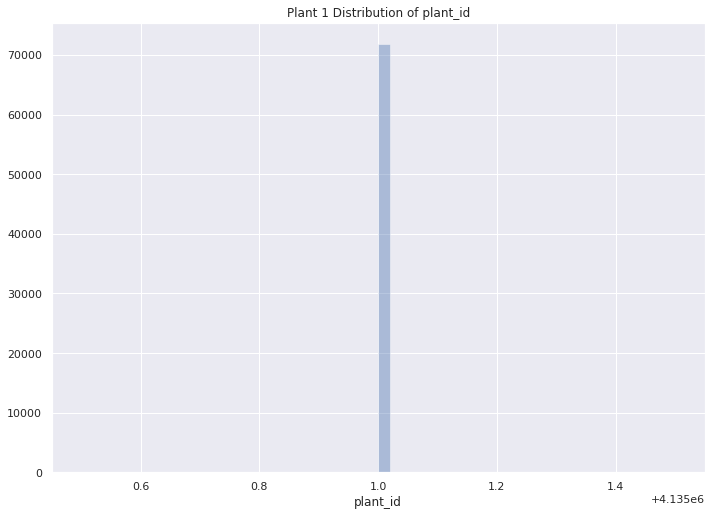

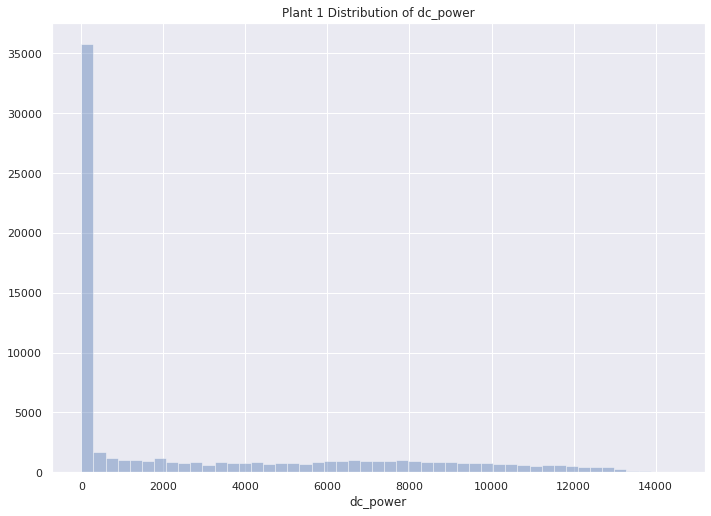

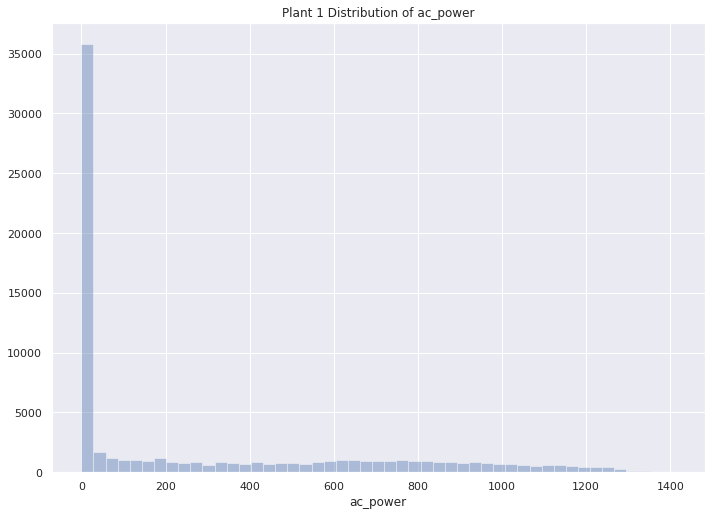

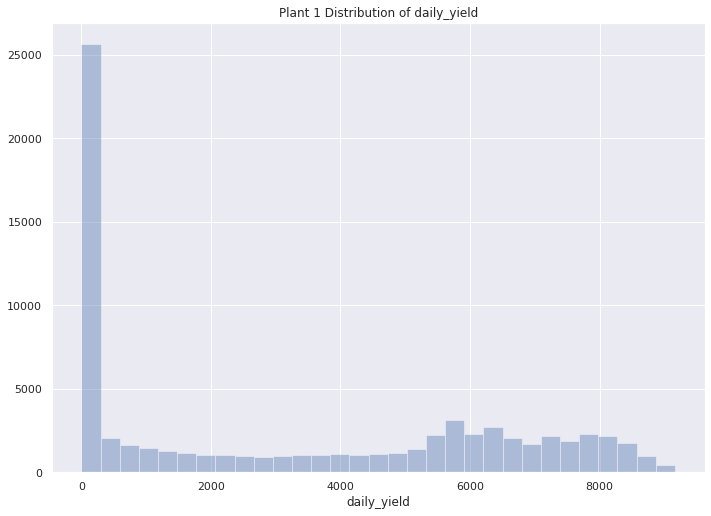

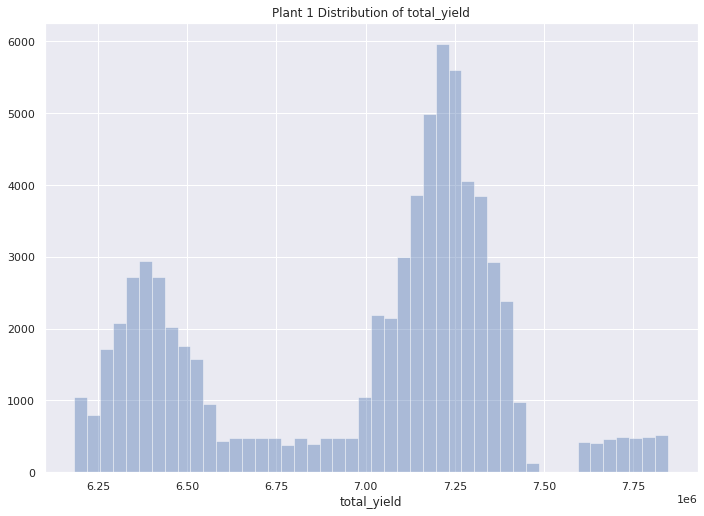

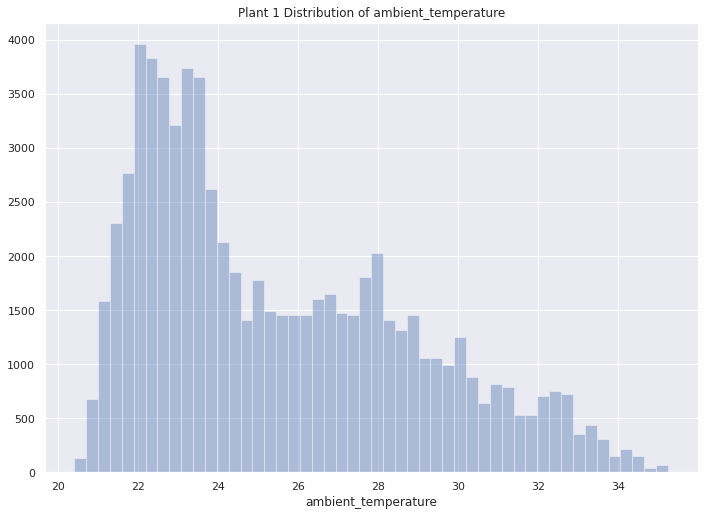

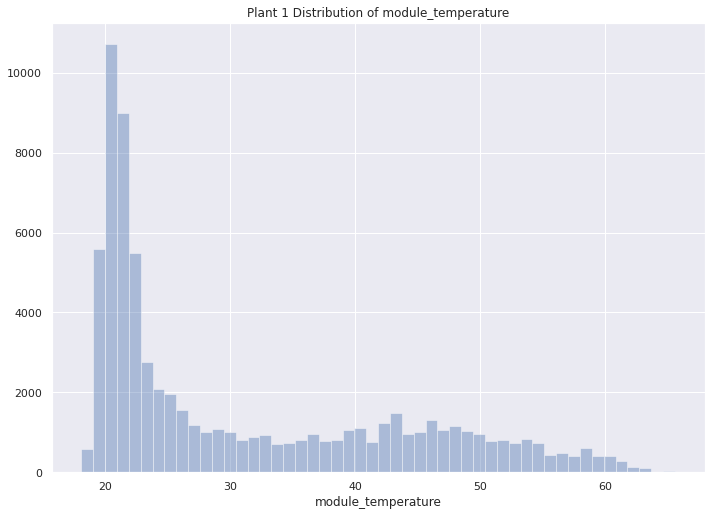

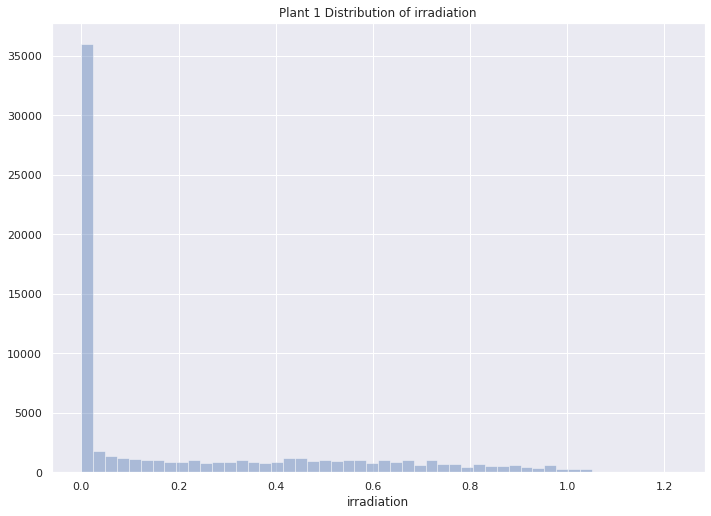

In [ ]:
# plant 1
for col in plant1.columns[plant1.dtypes == 'float']:
    sns.distplot(plant1[col], kde=False)
    plt.title(f"Plant 1 Distribution of {col}")
    plt.show()

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



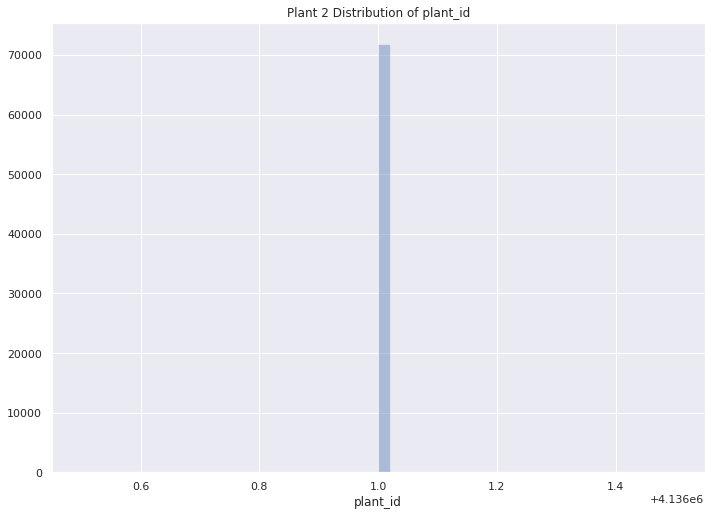

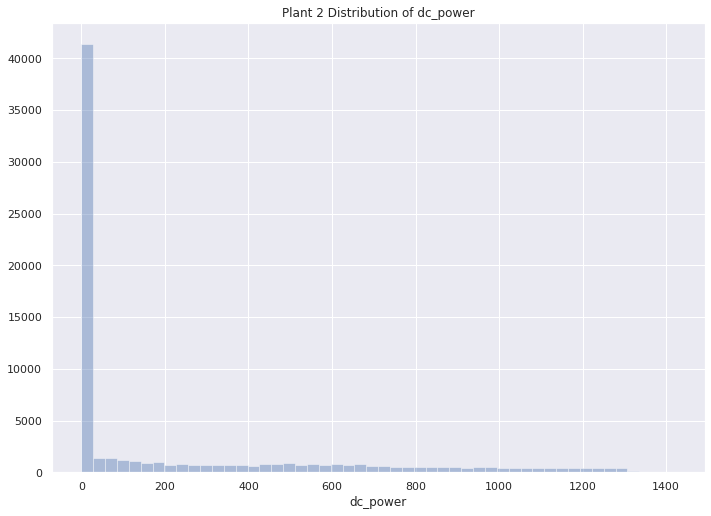

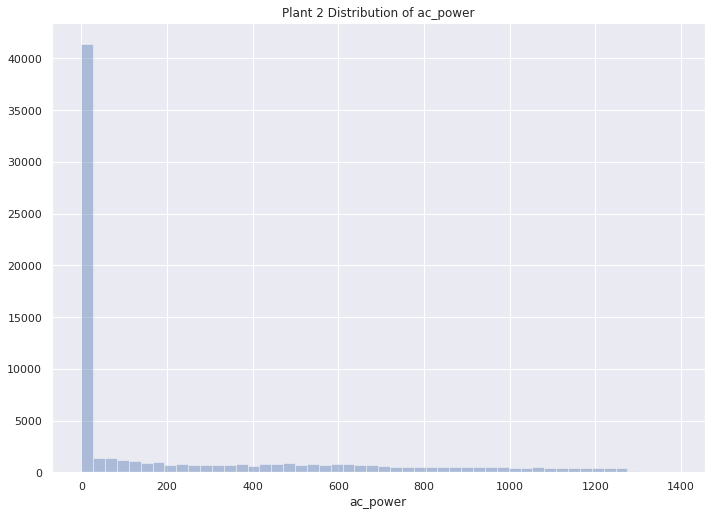

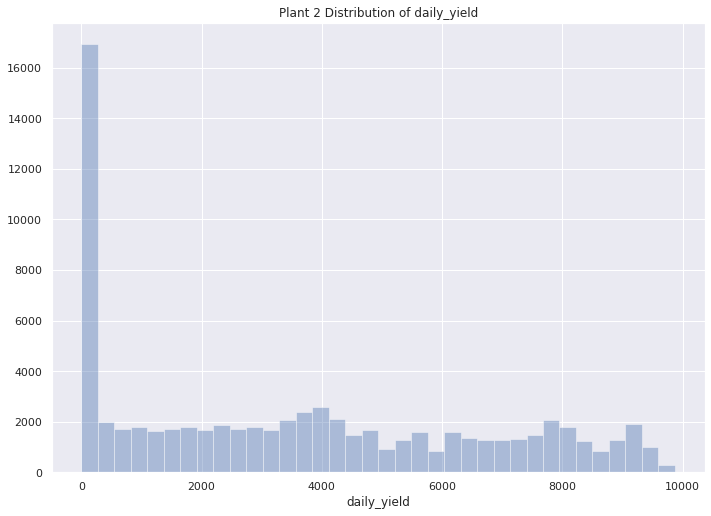

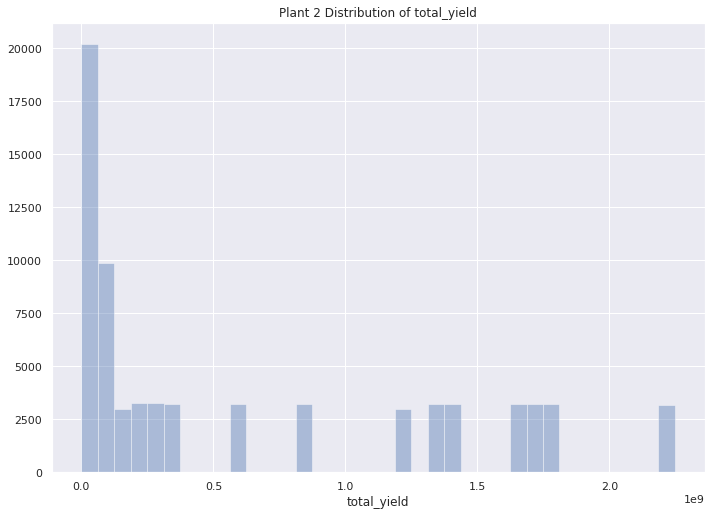

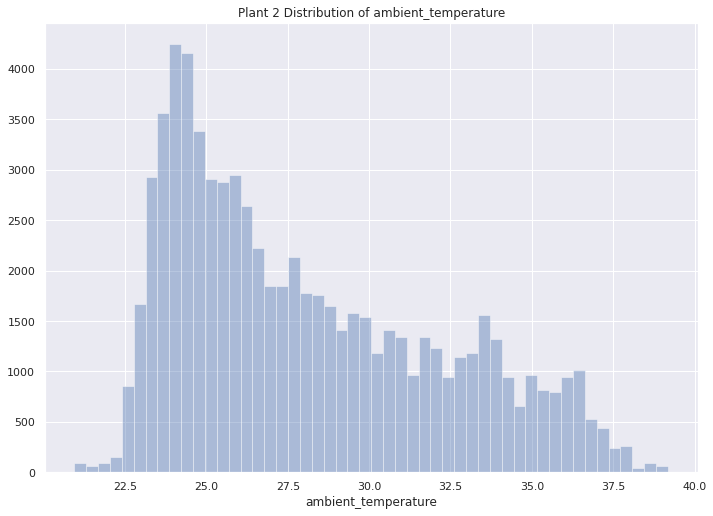

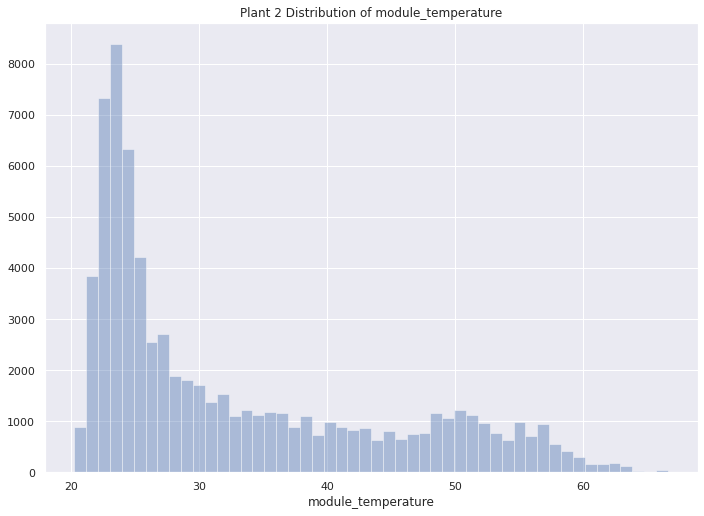

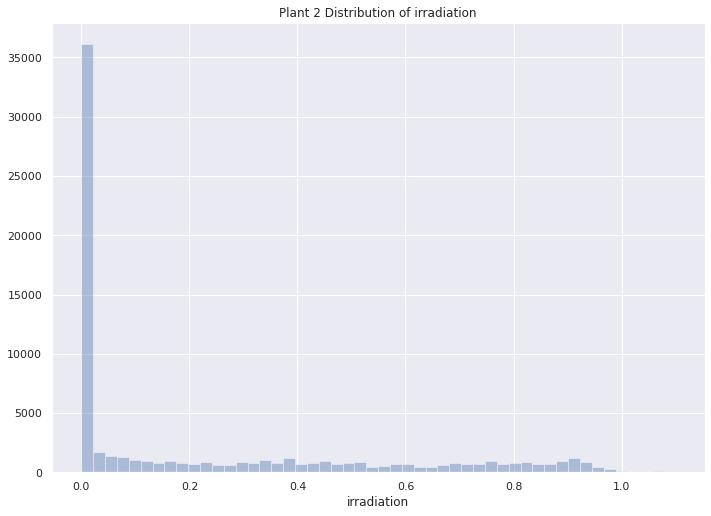

In [ ]:
# plant 2
for col in plant2.columns[plant2.dtypes == 'float']:
    sns.distplot(plant2[col], kde=False)
    plt.title(f"Plant 2 Distribution of {col}")
    plt.show()

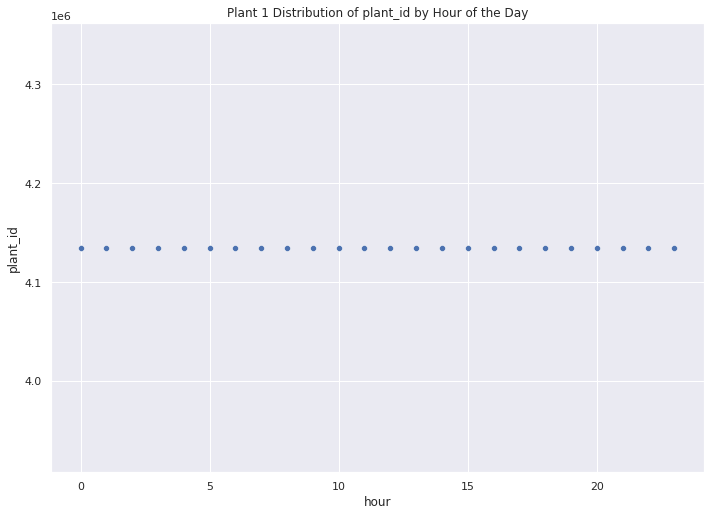

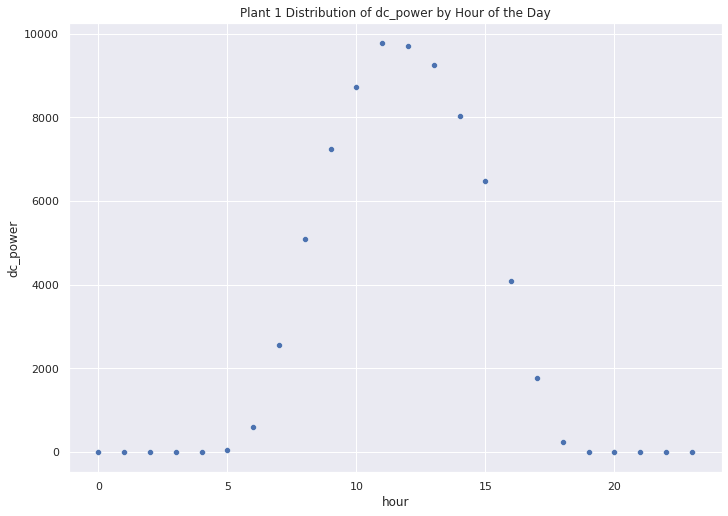

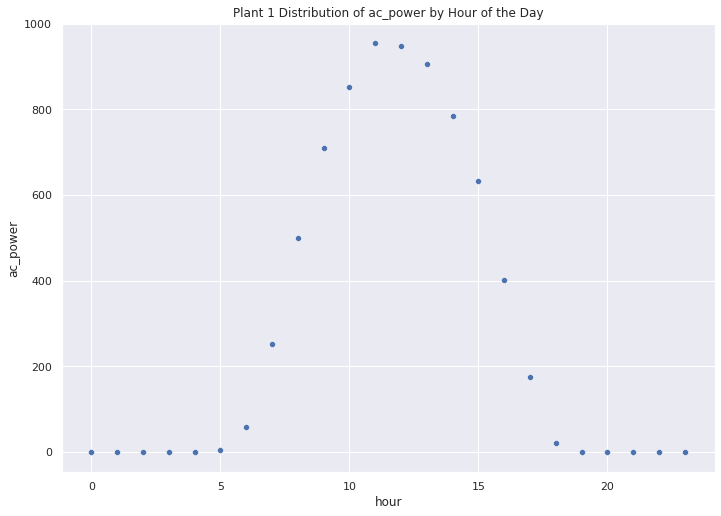

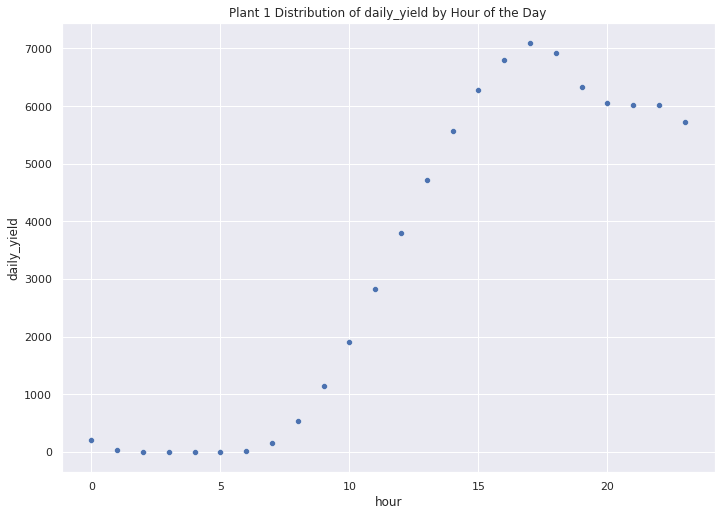

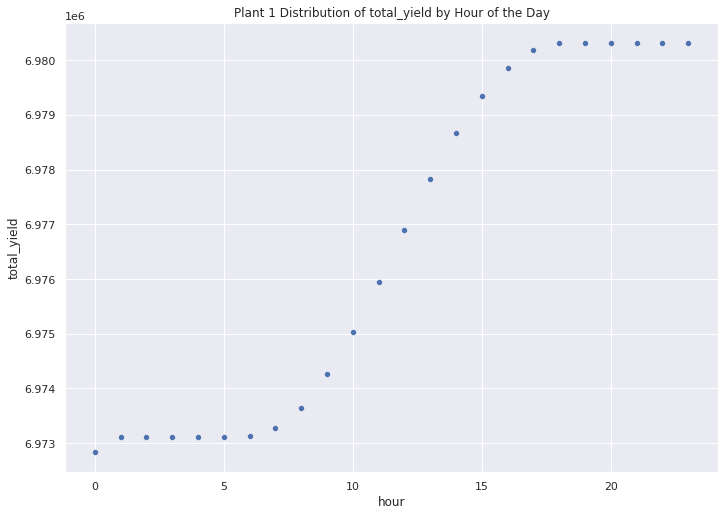

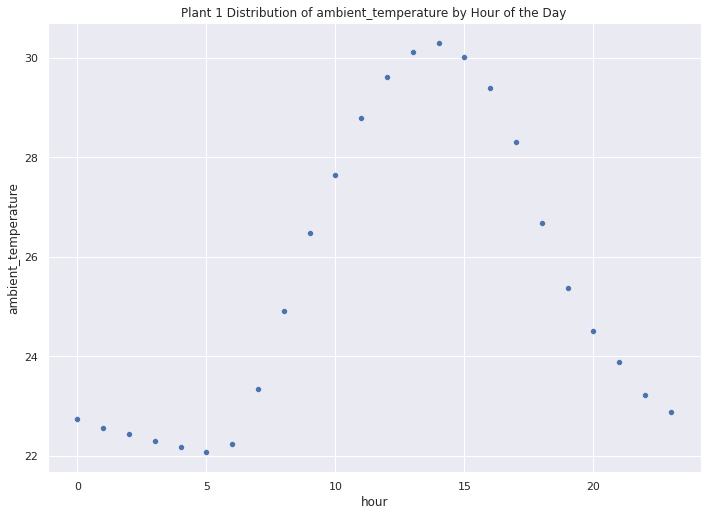

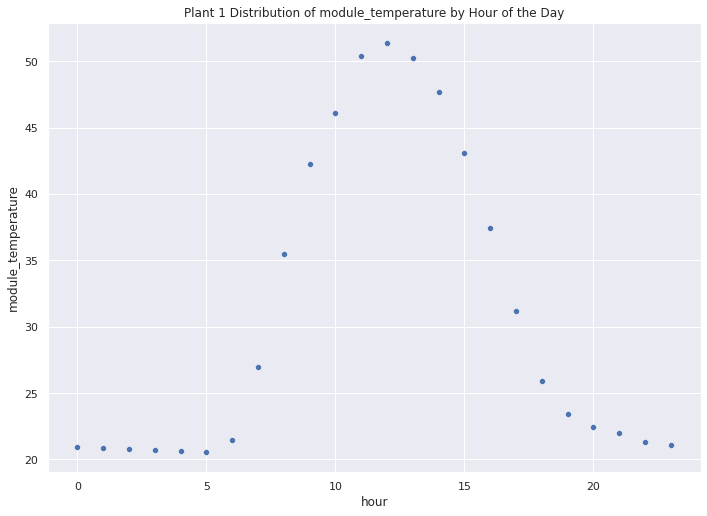

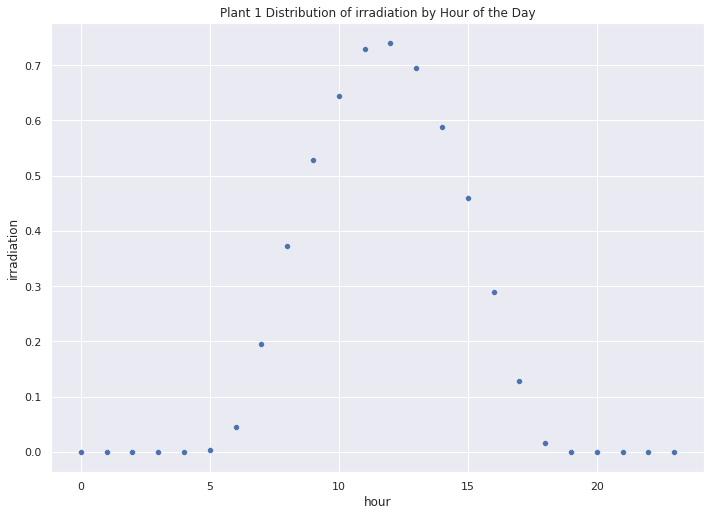

In [ ]:
# plant 1 by hour of the day
for col in plant1.columns[plant1.dtypes=='float']:
    grouped = plant1.groupby('hour').mean().reset_index()
    sns.scatterplot(data=grouped, x='hour', y=col)
    plt.title(f"Plant 1 Distribution of {col} by Hour of the Day")
    plt.show()

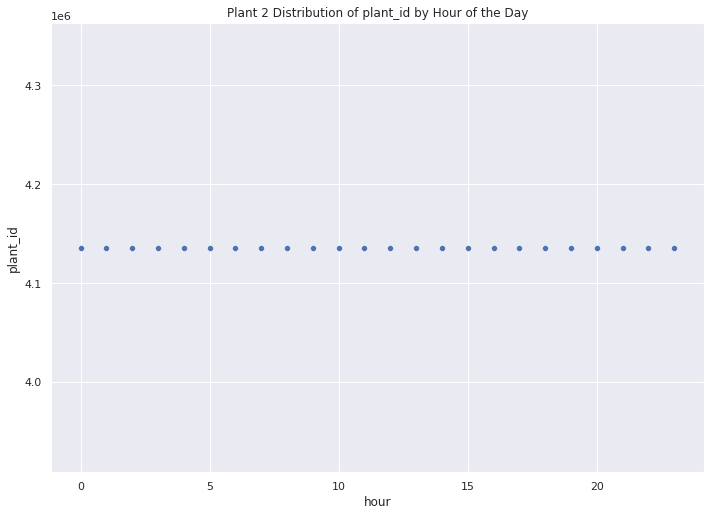

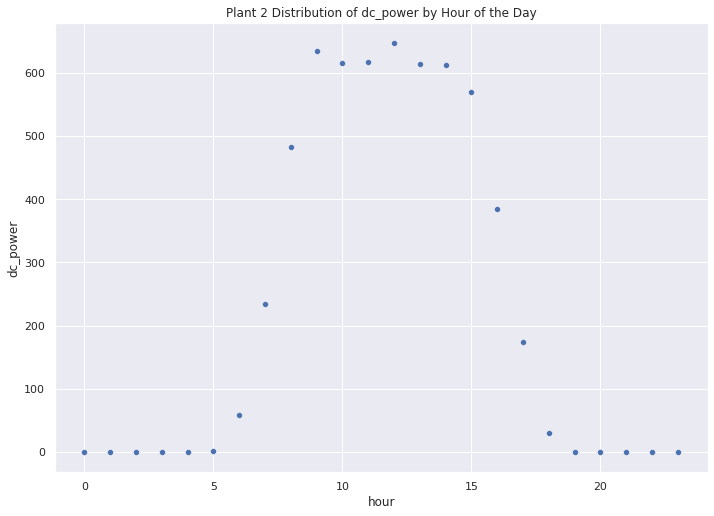

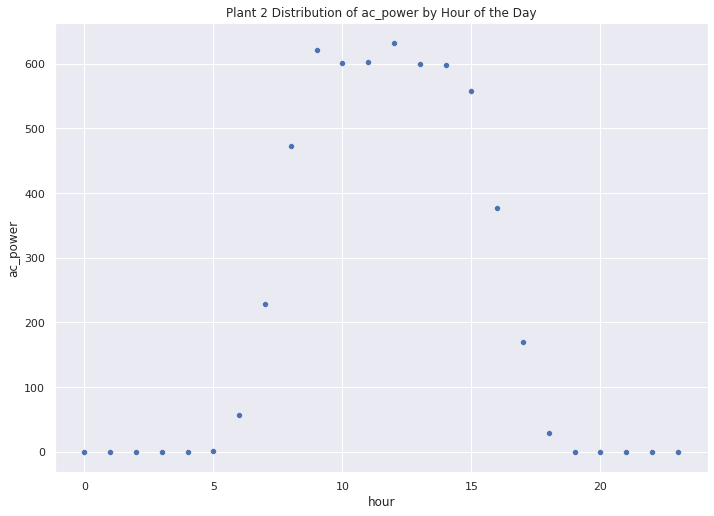

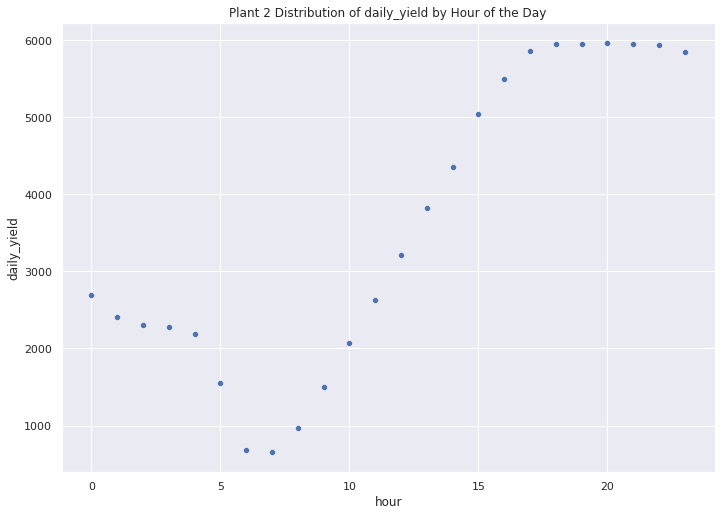

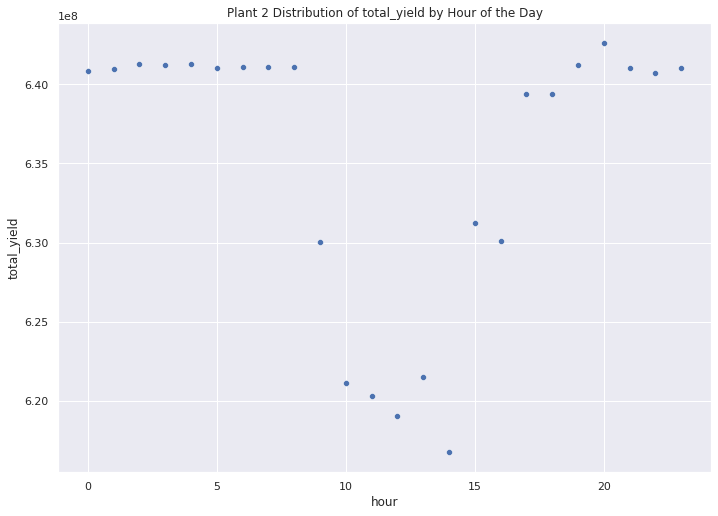

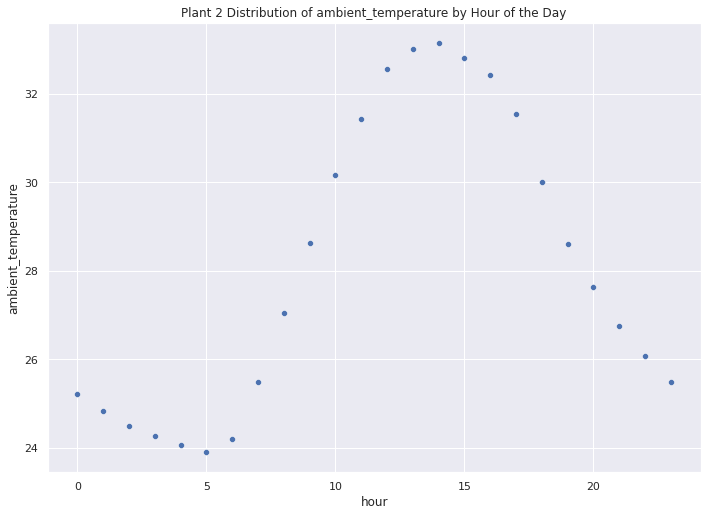

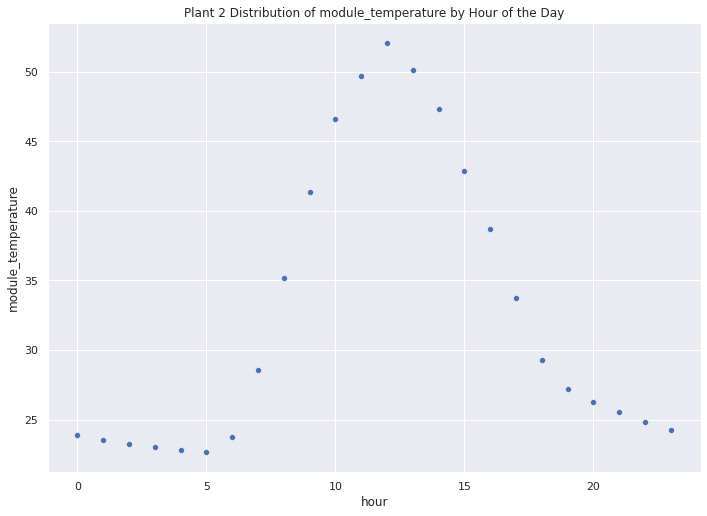

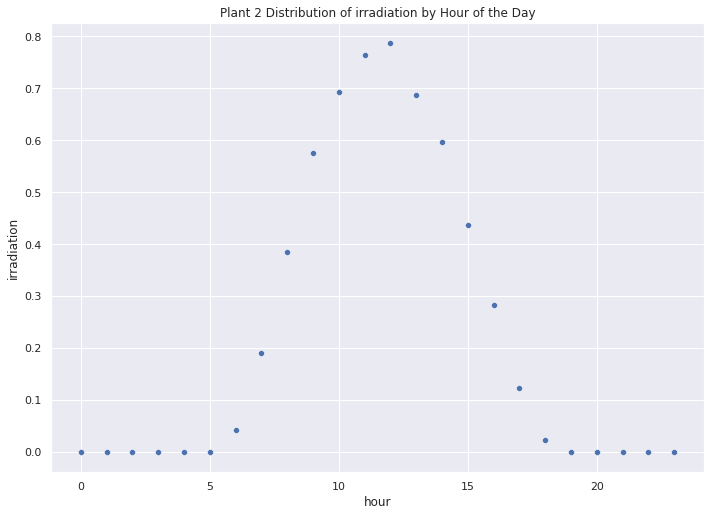

In [ ]:
# plant 2 by hour of the day
for col in plant2.columns[plant1.dtypes=='float']:
    grouped = plant2.groupby('hour').mean().reset_index()
    sns.scatterplot(data=grouped, x='hour', y=col)
    plt.title(f"Plant 2 Distribution of {col} by Hour of the Day")
    plt.show()

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

There are days that have daily_yields above 0 after midnight and before the sun has risen.  This is not possible and indicates a sensor reading error.  I will set these values to 0.

DC Power seems to be 10x higher for plant 1 than for plant 2.  So I will divide plant 1's values by 10 to make them comparable.  

Total yield is a weird field.  The dataset's documentation says it is supposed to be the total yield for an inverter up to a certain point in time.  So unless the inverter is brand new, it should never have a total yield of 0.  Plant 1 has none of these, but plant 2 has plenty of inverters with total yield > 0 one day, but that are suddenly 0 the next day.  It doesn't make sense.  Also, if the total_yield feature measures total yield up to a point in time, then it should equal the previous day's total yield, plus the current day's final daily yield.  Looking at the data, that math works out most of the time, but it often does not. There seem to be adjustments made that are not recorded as a feature in this dataset, causing them to show up as sudden drops in total yield.  Since it is uncertain how total yield calculated, and why it varies, it is an unreliable field.  I will keep it in the data, but will avoid using it for modeling.

**TLDR: Total yield is an unreliable feature, so I will avoid using it for modeling.**

In [ ]:
# fix unreasonable daily_yield values
for df in [plant1, plant2]:
    df.loc[(df['daily_yield'] > 0) & (df['hour'] < 5), 'daily_yield'] = 0

# re-scale plant 1's dc power values to make them comparable to plant 2's
plant1['dc_power'] /= 10.

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

## Feature Engineering

It would be nice to calculate features that capture the DC power, AC power, and yield at different levels.  Now that there are time features in the dataset, I can calculate features at the following levels: 
* the 15 minute level (1 value per row)
* the hour level (1 value per inverter per hour)
* the day level (1 value per inverter per day)
* the inverter level (1 value per inverter)  

Afterwards, I can do some more EDA on the new features.

In [ ]:
#calculate other useful features

for df in [plant1, plant2]:
    df.sort_values(['source_key', 'date_time'], ascending=True, inplace=True)
    df.rename(columns={"daily_yield": "cumulative_daily_yield"}, inplace=True)
    
    # 15 minute level features (1 value per row)
    
    df['dc_ac_ratio'] = np.where(df['ac_power'] == 0, 0, df['dc_power']/df['ac_power'])
    df['yield'] = df['cumulative_daily_yield'].diff().fillna(0)
    # fix differences at the boundaries
    source_key_mask = df['source_key'] != df['source_key'].shift(1)
    day_mask = df['date'] != df['date'].shift(1)
    df.loc[source_key_mask, 'yield'] = 0
    df.loc[day_mask, 'yield'] = 0
    
    # hour level features (1 value per inverter per hour)
    
    df['avg_hourly_dc_power'] = df.groupby(['source_key', 'hour'])['dc_power'].transform(func=np.mean)
    df['avg_hourly_ac_power'] = df.groupby(['source_key', 'hour'])['ac_power'].transform(func=np.mean)
    df['hourly_yield'] = df.groupby(['source_key', 'hour'])['yield'].transform(func=np.sum)
    
    # day level features (1 value per inverter per day)
    
    df['avg_daily_dc_power'] = df.groupby(['source_key', 'date'])['dc_power'].transform(func=np.mean)
    df['avg_daily_ac_power'] = df.groupby(['source_key', 'date'])['ac_power'].transform(func=np.mean)
    df['avg_daily_dc_ac_ratio'] = df.groupby(['source_key', 'date'])['dc_ac_ratio'].transform(func=np.mean)
    # daily_yield is cumulative, so the final value, when grouped by inverter and date, is the total daily yield
    df['total_daily_yield'] = df.groupby(['source_key', 'date'])['cumulative_daily_yield'].transform(func='last')
    
    # inverter level features (1 value per inverter)
    
    # average daily yield should be calculated using the daily total, so there should be 1 average per inverter
    df['avg_daily_yield'] = df.groupby(['source_key'])['total_daily_yield'].transform(func=np.mean)


In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

In [ ]:
# manually spot check the features
plant1[plant1['hour']>6].head(15)

,source_key,date_time,plant_id,dc_power,ac_power,cumulative_daily_yield,total_yield,weather_sensor_key,ambient_temperature,module_temperature,irradiation,date,hour,day,weekday,month,year,dc_ac_ratio,yield,avg_hourly_dc_power,avg_hourly_ac_power,hourly_yield,avg_daily_dc_power,avg_daily_ac_power,avg_daily_dc_ac_ratio,total_daily_yield,avg_daily_yield
28,1BY6WEcLGh8j5v7,2020-05-15 07:00:00,4135001.0,173.457143,170.014286,72.714286,6259631.714,HmiyD2TTLFNqkNe,24.537398,27.185653,0.141940,2020-05-15,7,15,Friday,5,2020,1.020250,37.839286,242.987185,238.294564,6945.511905,245.146559,240.068235,0.532566,1438.5,6078.476471
29,1BY6WEcLGh8j5v7,2020-05-15 07:15:00,4135001.0,185.637500,181.937500,116.250000,6259675.250,HmiyD2TTLFNqkNe,24.815960,28.888478,0.154713,2020-05-15,7,15,Friday,5,2020,1.020337,43.535714,242.987185,238.294564,6945.511905,245.146559,240.068235,0.532566,1438.5,6078.476471
30,1BY6WEcLGh8j5v7,2020-05-15 07:30:00,4135001.0,184.228571,180.585714,162.428571,6259721.429,HmiyD2TTLFNqkNe,24.988790,29.605644,0.148799,2020-05-15,7,15,Friday,5,2020,1.020172,46.178571,242.987185,238.294564,6945.511905,245.146559,240.068235,0.532566,1438.5,6078.476471
31,1BY6WEcLGh8j5v7,2020-05-15 07:45:00,4135001.0,187.787500,184.062500,206.375000,6259765.375,HmiyD2TTLFNqkNe,25.216180,29.547111,0.144793,2020-05-15,7,15,Friday,5,2020,1.020238,43.946429,242.987185,238.294564,6945.511905,245.146559,240.068235,0.532566,1438.5,6078.476471
32,1BY6WEcLGh8j5v7,2020-05-15 08:00:00,4135001.0,324.600000,318.671429,263.571429,6259822.571,HmiyD2TTLFNqkNe,25.419513,31.412545,0.201639,2020-05-15,8,15,Friday,5,2020,1.018604,57.196429,481.145833,471.865314,14954.892857,245.146559,240.068235,0.532566,1438.5,6078.476471
33,1BY6WEcLGh8j5v7,2020-05-15 08:15:00,4135001.0,391.750000,384.837500,359.875000,6259918.875,HmiyD2TTLFNqkNe,25.959082,35.528711,0.345708,2020-05-15,8,15,Friday,5,2020,1.017962,96.303571,481.145833,471.865314,14954.892857,245.146559,240.068235,0.532566,1438.5,6078.476471
34,1BY6WEcLGh8j5v7,2020-05-15 08:30:00,4135001.0,432.200000,424.128571,464.000000,6260023.000,HmiyD2TTLFNqkNe,26.430782,40.318059,0.405349,2020-05-15,8,15,Friday,5,2020,1.019031,104.125000,481.145833,471.865314,14954.892857,245.146559,240.068235,0.532566,1438.5,6078.476471
35,1BY6WEcLGh8j5v7,2020-05-15 08:45:00,4135001.0,425.712500,417.787500,556.125000,6260115.125,HmiyD2TTLFNqkNe,26.831830,39.081954,0.312427,2020-05-15,8,15,Friday,5,2020,1.018969,92.125000,481.145833,471.865314,14954.892857,245.146559,240.068235,0.532566,1438.5,6078.476471
36,1BY6WEcLGh8j5v7,2020-05-15 09:00:00,4135001.0,570.671429,559.228571,688.857143,6260247.857,HmiyD2TTLFNqkNe,27.620970,45.009233,0.623153,2020-05-15,9,15,Friday,5,2020,1.020462,132.732143,674.827582,660.748486,21916.874999,245.146559,240.068235,0.532566,1438.5,6078.476471
37,1BY6WEcLGh8j5v7,2020-05-15 09:15:00,4135001.0,401.550000,394.012500,811.625000,6260370.625,HmiyD2TTLFNqkNe,27.988362,46.617706,0.344884,2020-05-15,9,15,Friday,5,2020,1.019130,122.767857,674.827582,660.748486,21916.874999,245.146559,240.068235,0.532566,1438.5,6078.476471


/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



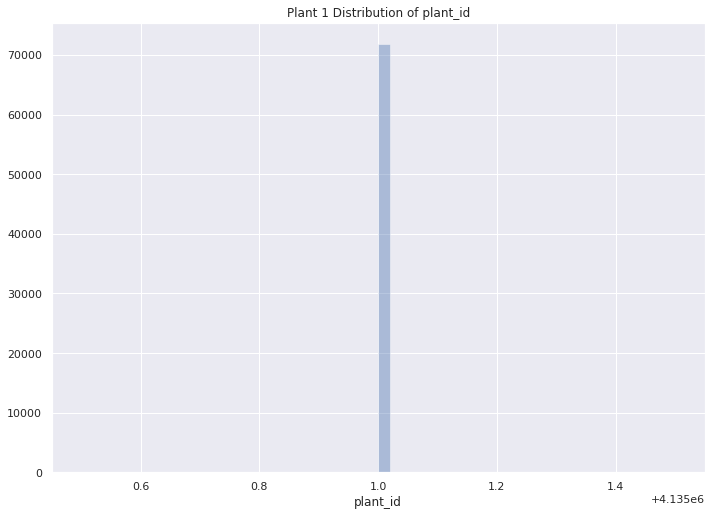

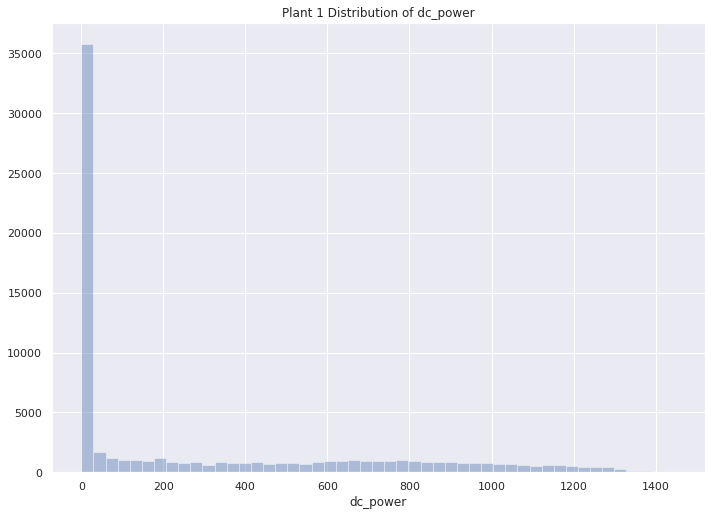

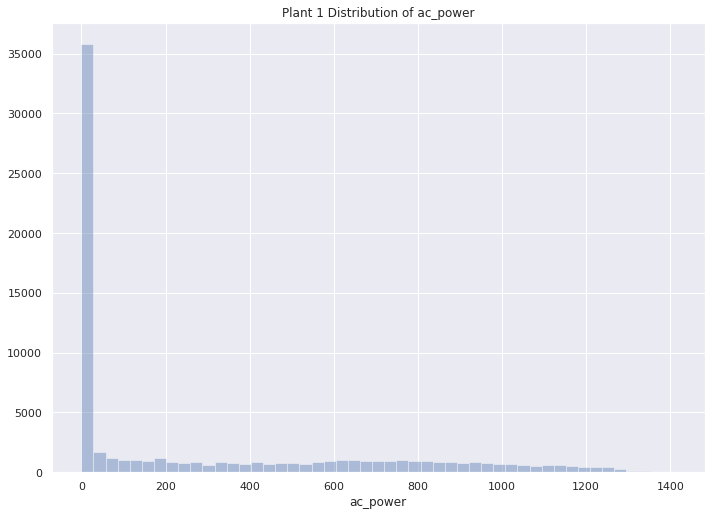

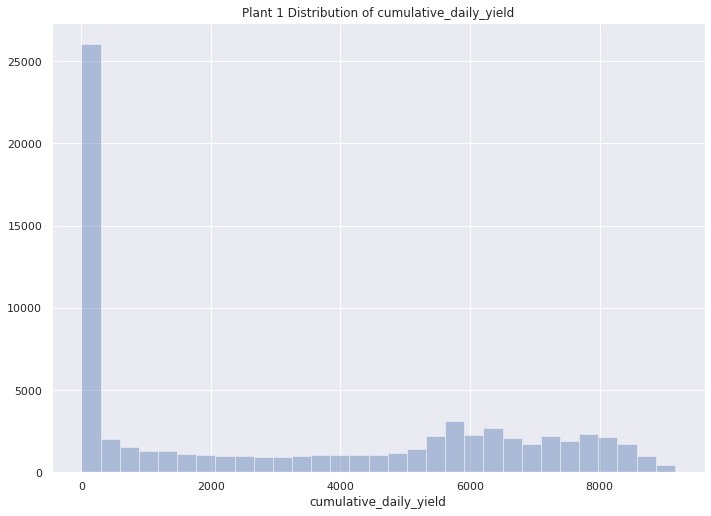

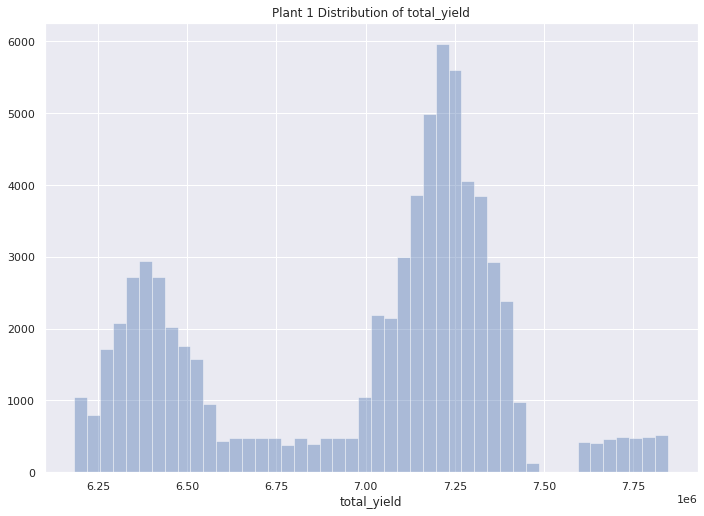

...

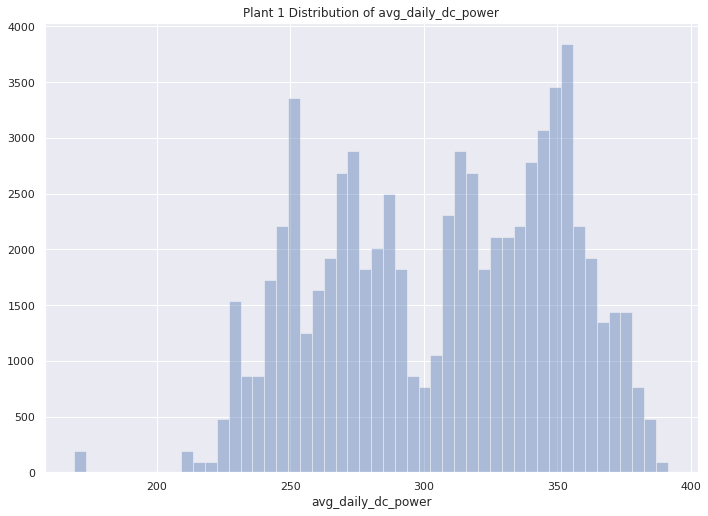

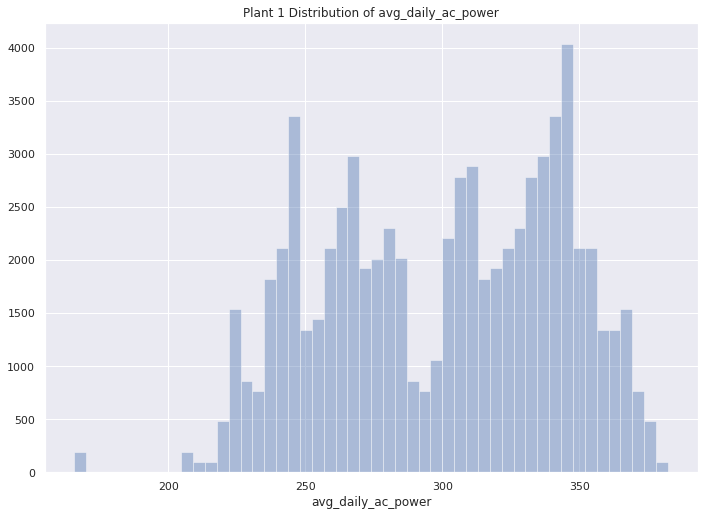

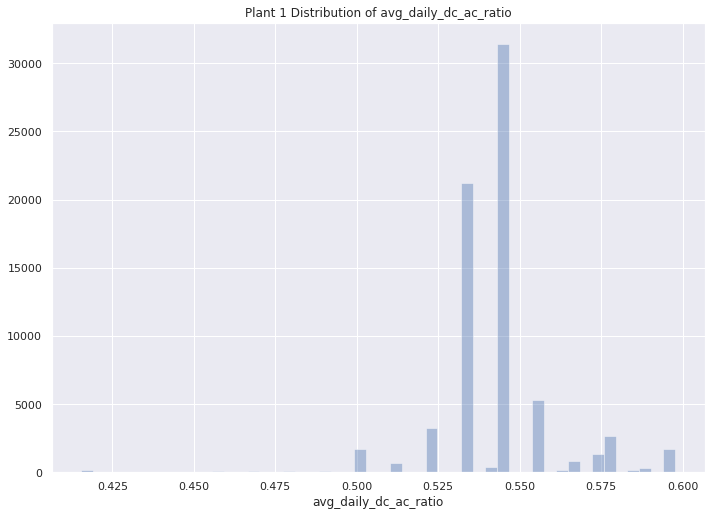

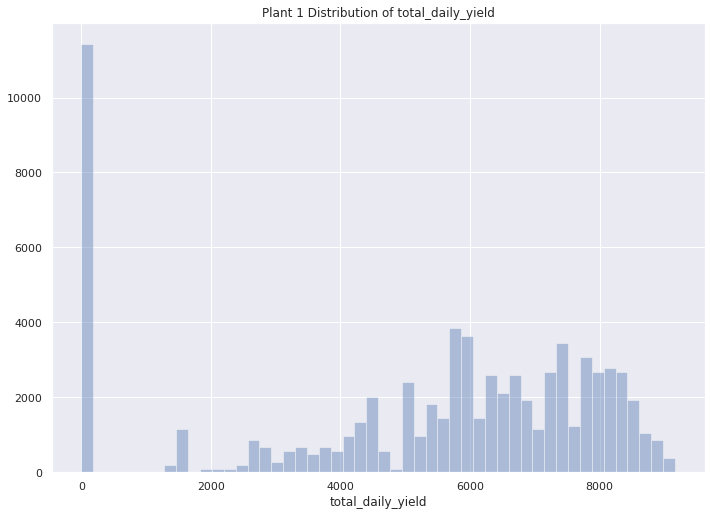

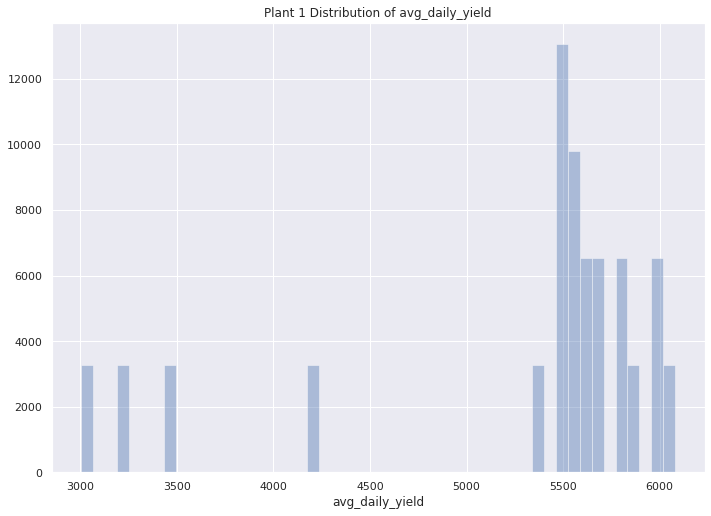

In [ ]:
for col in plant1.columns[plant1.dtypes=='float']:
    sns.distplot(plant1[col], kde=False)
    plt.title(f"Plant 1 Distribution of {col}")
    plt.show()

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



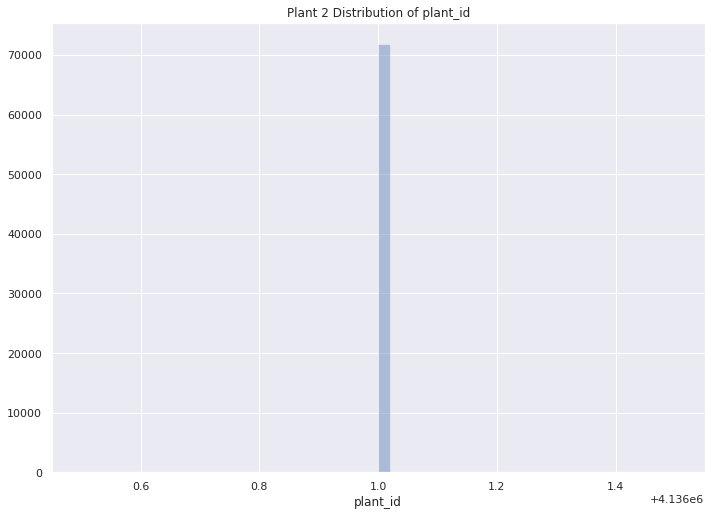

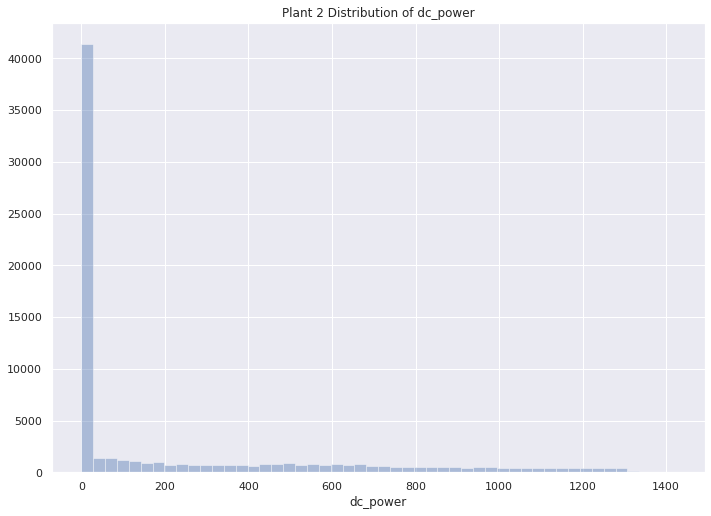

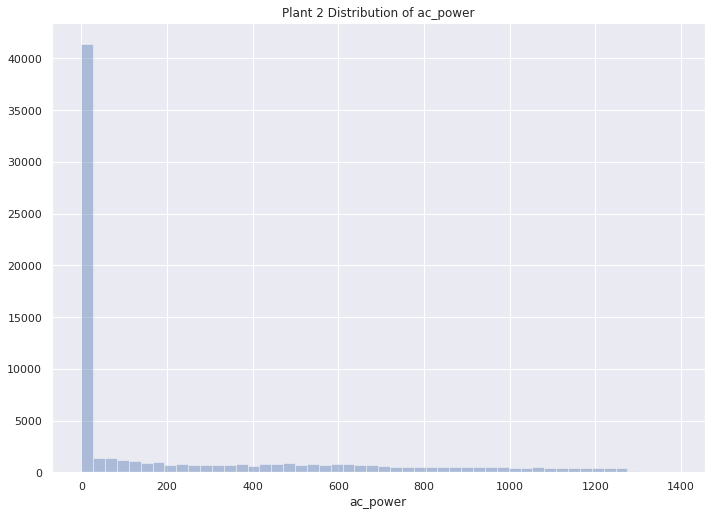

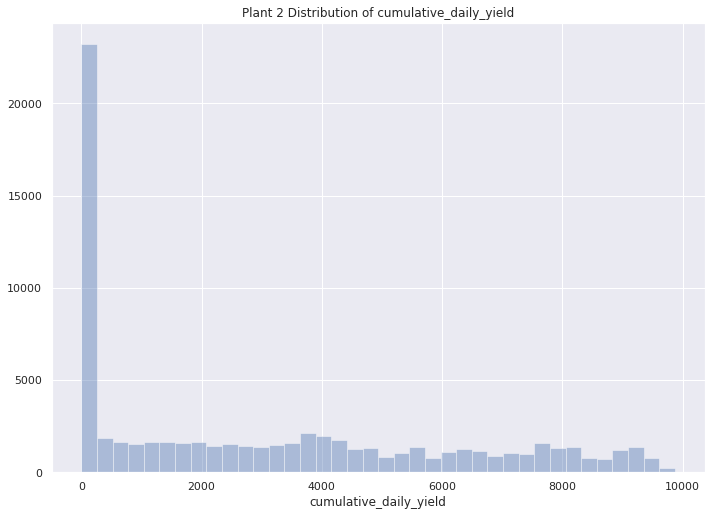

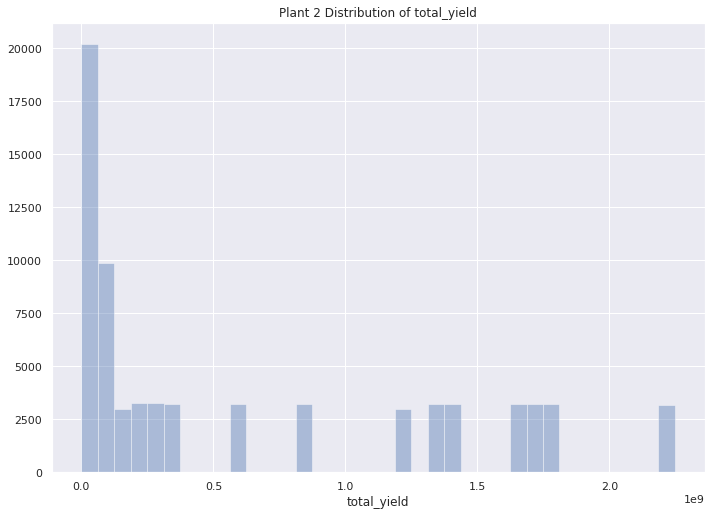

...

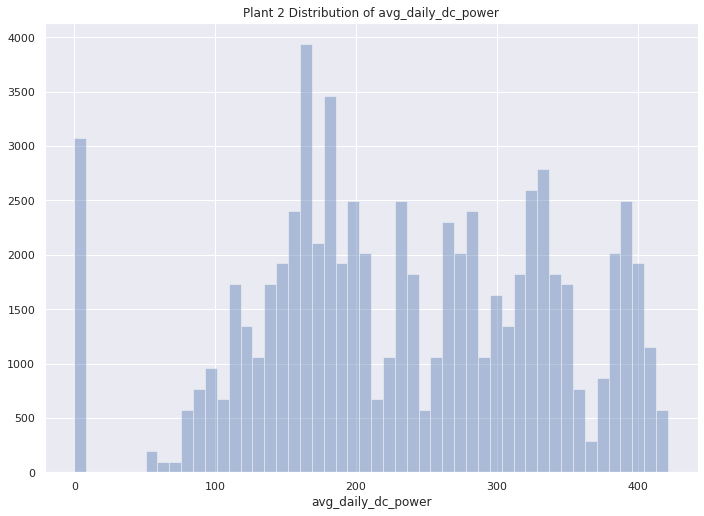

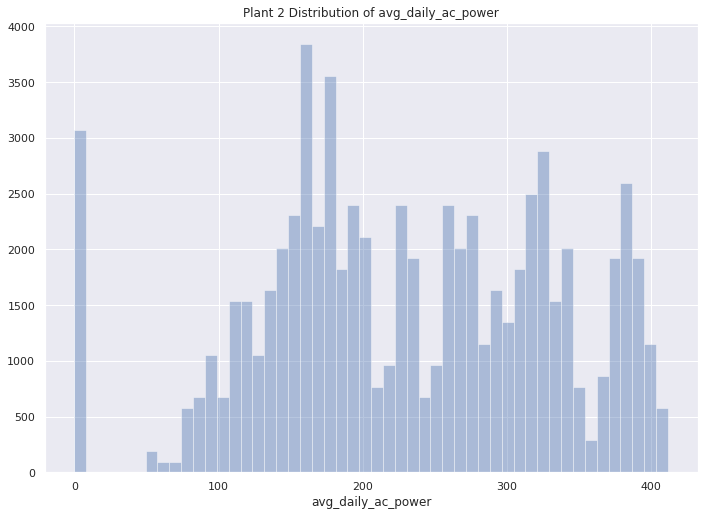

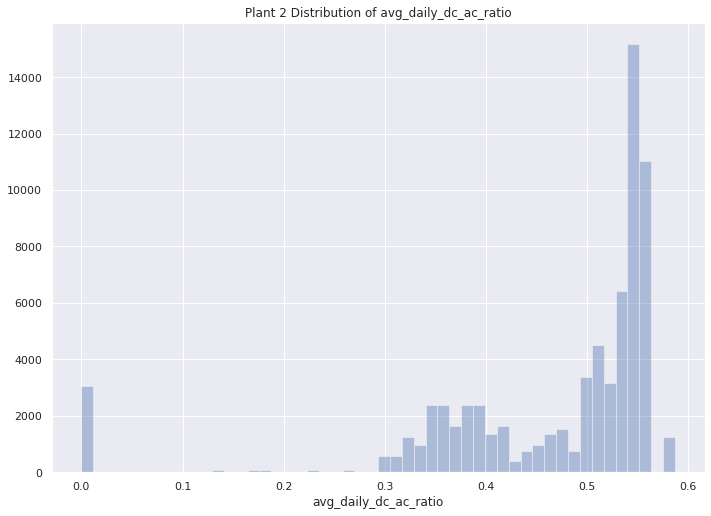

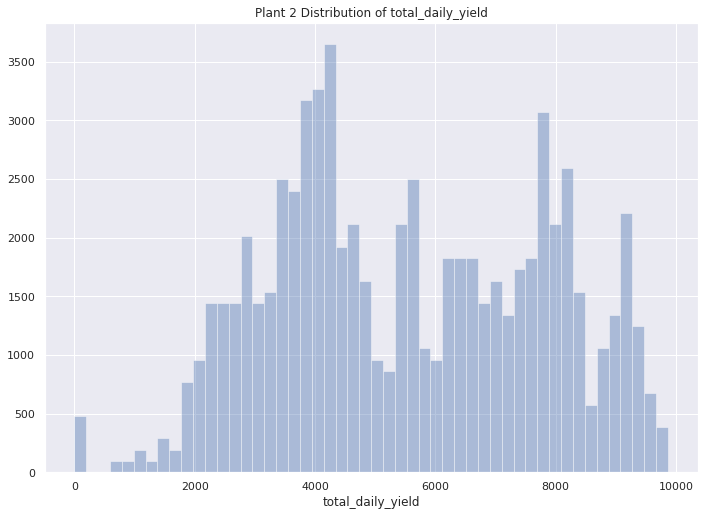

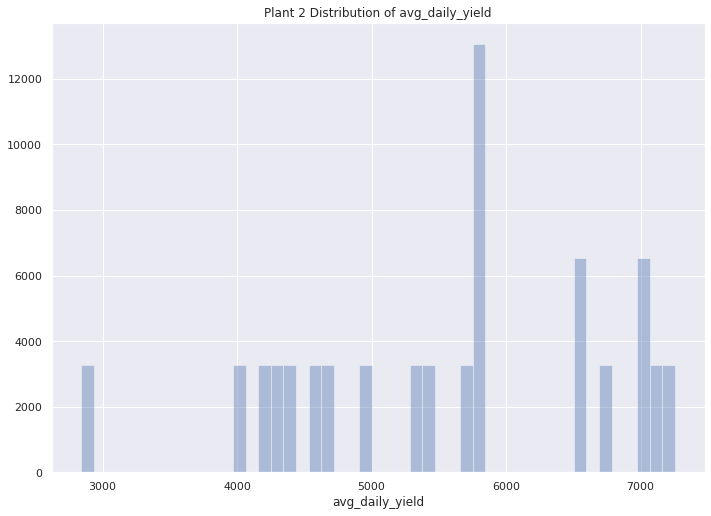

In [ ]:
for col in plant2.columns[plant1.dtypes=='float']:
    sns.distplot(plant2[col], kde=False)
    plt.title(f"Plant 2 Distribution of {col}")
    plt.show()

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

### EDA on the New Features

Looking at the distributions above, a few things become clear.  

1. Many features will need to be transformed to have more normal distributions before modeling.  However, the large number of zero values is the main cause of the skewed distributions.  I will ponder that before making any transformations...
2. The new yield and hourly_yield features have some extreme outliers.
3. Plant 2 had days when no power was generated.
4. dc_ac_ratio is either 0 or 1, meaning it cannot be used to find faulty inverters, because the inverter either converts 100% of DC to AC or nothing at all.  That also means that either dc_power or ac_power can be used, while the other can be ignored.  The same can be said for all features derived off the relationship between dc_power and ac_power.  **I will keep the dc_power features, drop the ac_power features and all dc/ac ratio features.**

**Note about zero values:**
There are many zero values in power generation due to hours with no sunlight, or days where no power was generated.  Scaling or standardizing the data, in preparation for modeling, will be hard with all of these zeros.  Instead, I will drop the rows where there is no sunlight, because who cares about forecasting or looking for anomalies when there is no sunlight?  There would be no power produced at all during these times.  Dropping these rows should remove most of the zeros and reduce or remove the skew in the distributions.  **I will not do anything about the skewed distributions now, but if I use models that require assuming normality, I will address them then.**

### Why not combine the data for both plants?

Some relationships between features, like the one between irradiation and yield, would be the same for both plants.  In these cases, it would make sense to combine the data and model the combined data so there are more samples to learn from.  Other relationships, however, are unique to inverters.  So combining the data would yield no benefit for the feature relationships specific to each inverter.  For example, a time series model fitted to one inverter would most likely be useless when applied to another inverter (unless the yield is so dependent on irradiation that the time series essentially captures irradiation patterns).  The time series models I plan to use for anomaly detection and forecasting will be specific to each inverter.  I may use a neural network, and at that time, I will combine the inputs, but until then, I will keep them separate.

In [ ]:
# inspect the outliers in yield and hourly_yield
plant1[plant1['hourly_yield'] < -2000].head(15)

,source_key,date_time,plant_id,dc_power,ac_power,cumulative_daily_yield,total_yield,weather_sensor_key,ambient_temperature,module_temperature,irradiation,date,hour,day,weekday,month,year,dc_ac_ratio,yield,avg_hourly_dc_power,avg_hourly_ac_power,hourly_yield,avg_daily_dc_power,avg_daily_ac_power,avg_daily_dc_ac_ratio,total_daily_yield,avg_daily_yield
72,1BY6WEcLGh8j5v7,2020-05-15 18:00:00,4135001.0,26.400000,25.485714,5749.285714,6265308.286,HmiyD2TTLFNqkNe,31.132414,30.225331,0.022545,2020-05-15,18,15,Friday,5,2020,1.035874,9.535714,19.782314,19.139758,-6464.839287,245.146559,240.068235,0.532566,1438.5,6078.476471
73,1BY6WEcLGh8j5v7,2020-05-15 18:15:00,4135001.0,7.828571,7.542857,5753.142857,6265312.143,HmiyD2TTLFNqkNe,29.243111,28.682507,0.009150,2020-05-15,18,15,Friday,5,2020,1.037879,3.857143,19.782314,19.139758,-6464.839287,245.146559,240.068235,0.532566,1438.5,6078.476471
74,1BY6WEcLGh8j5v7,2020-05-15 18:30:00,4135001.0,0.000000,0.000000,5754.000000,6265313.000,HmiyD2TTLFNqkNe,28.495518,27.285992,0.001841,2020-05-15,18,15,Friday,5,2020,0.000000,0.857143,19.782314,19.139758,-6464.839287,245.146559,240.068235,0.532566,1438.5,6078.476471
75,1BY6WEcLGh8j5v7,2020-05-15 18:45:00,4135001.0,0.000000,0.000000,5754.000000,6265313.000,HmiyD2TTLFNqkNe,27.884064,25.961947,0.000000,2020-05-15,18,15,Friday,5,2020,0.000000,0.000000,19.782314,19.139758,-6464.839287,245.146559,240.068235,0.532566,1438.5,6078.476471
92,1BY6WEcLGh8j5v7,2020-05-15 23:00:00,4135001.0,0.000000,0.000000,5754.000000,6265313.000,HmiyD2TTLFNqkNe,22.236018,21.241317,0.000000,2020-05-15,23,15,Friday,5,2020,0.000000,0.000000,0.000000,0.000000,-10567.200000,245.146559,240.068235,0.532566,1438.5,6078.476471
93,1BY6WEcLGh8j5v7,2020-05-15 23:15:00,4135001.0,0.000000,0.000000,4315.500000,6265313.000,HmiyD2TTLFNqkNe,22.189863,21.143885,0.000000,2020-05-15,23,15,Friday,5,2020,0.000000,-1438.500000,0.000000,0.000000,-10567.200000,245.146559,240.068235,0.532566,1438.5,6078.476471
94,1BY6WEcLGh8j5v7,2020-05-15 23:30:00,4135001.0,0.000000,0.000000,2877.000000,6265313.000,HmiyD2TTLFNqkNe,22.143709,21.046454,0.000000,2020-05-15,23,15,Friday,5,2020,0.000000,-1438.500000,0.000000,0.000000,-10567.200000,245.146559,240.068235,0.532566,1438.5,6078.476471
95,1BY6WEcLGh8j5v7,2020-05-15 23:45:00,4135001.0,0.000000,0.000000,1438.500000,6265313.000,HmiyD2TTLFNqkNe,22.097554,20.949023,0.000000,2020-05-15,23,15,Friday,5,2020,0.000000,-1438.500000,0.000000,0.000000,-10567.200000,245.146559,240.068235,0.532566,1438.5,6078.476471
168,1BY6WEcLGh8j5v7,2020-05-16 18:00:00,4135001.0,37.362500,36.100000,6285.500000,6271598.500,HmiyD2TTLFNqkNe,30.311684,28.362274,0.026213,2020-05-16,18,16,Saturday,5,2020,1.034972,12.928571,19.782314,19.139758,-6464.839287,267.322786,261.713449,0.532725,6292.0,6078.476471
169,1BY6WEcLGh8j5v7,2020-05-16 18:15:00,4135001.0,12.014286,11.600000,6291.428571,6271604.429,HmiyD2TTLFNqkNe,29.548226,26.940338,0.008812,2020-05-16,18,16,Saturday,5,2020,1.035714,5.928571,19.782314,19.139758,-6464.839287,267.322786,261.713449,0.532725,6292.0,6078.476471


In [ ]:
plant2[plant2['hourly_yield'] < -2000].head(15)

,source_key,date_time,plant_id,dc_power,ac_power,cumulative_daily_yield,total_yield,weather_sensor_key,ambient_temperature,module_temperature,irradiation,date,hour,day,weekday,month,year,dc_ac_ratio,yield,avg_hourly_dc_power,avg_hourly_ac_power,hourly_yield,avg_daily_dc_power,avg_daily_ac_power,avg_daily_dc_ac_ratio,total_daily_yield,avg_daily_yield
24,4UPUqMRk7TRMgml,2020-05-15 06:00:00,4136001.0,15.406667,14.860000,0.800000,2.429012e+06,iq8k7ZNt4Mwm3w0,24.742787,24.077230,0.012962,2020-05-15,6,15,Friday,5,2020,1.036788,0.800000,65.712474,63.883146,-28363.023883,178.256815,174.417485,0.362778,4201.0,6594.198281
25,4UPUqMRk7TRMgml,2020-05-15 06:15:00,4136001.0,27.433333,26.493333,6.133333,2.429017e+06,iq8k7ZNt4Mwm3w0,24.763911,24.356189,0.021038,2020-05-15,6,15,Friday,5,2020,1.035481,5.333333,65.712474,63.883146,-28363.023883,178.256815,174.417485,0.362778,4201.0,6594.198281
26,4UPUqMRk7TRMgml,2020-05-15 06:30:00,4136001.0,58.885714,57.028571,15.714286,2.429027e+06,iq8k7ZNt4Mwm3w0,24.786323,24.548886,0.042435,2020-05-15,6,15,Friday,5,2020,1.032565,9.580952,65.712474,63.883146,-28363.023883,178.256815,174.417485,0.362778,4201.0,6594.198281
27,4UPUqMRk7TRMgml,2020-05-15 06:45:00,4136001.0,158.013333,154.486667,39.466667,2.429050e+06,iq8k7ZNt4Mwm3w0,25.048245,25.746662,0.103496,2020-05-15,6,15,Friday,5,2020,1.022828,23.752381,65.712474,63.883146,-28363.023883,178.256815,174.417485,0.362778,4201.0,6594.198281
28,4UPUqMRk7TRMgml,2020-05-15 07:00:00,4136001.0,313.833333,308.340000,98.533333,2.429110e+06,iq8k7ZNt4Mwm3w0,25.673202,28.674707,0.199450,2020-05-15,7,15,Friday,5,2020,1.017816,59.066667,258.217851,253.139671,-10035.709597,178.256815,174.417485,0.362778,4201.0,6594.198281
29,4UPUqMRk7TRMgml,2020-05-15 07:15:00,4136001.0,393.560000,386.720000,185.866667,2.429197e+06,iq8k7ZNt4Mwm3w0,26.076818,30.725505,0.317665,2020-05-15,7,15,Friday,5,2020,1.017687,87.333333,258.217851,253.139671,-10035.709597,178.256815,174.417485,0.362778,4201.0,6594.198281
30,4UPUqMRk7TRMgml,2020-05-15 07:30:00,4136001.0,473.866667,464.886667,293.466667,2.429304e+06,iq8k7ZNt4Mwm3w0,26.424239,32.206804,0.382913,2020-05-15,7,15,Friday,5,2020,1.019317,107.600000,258.217851,253.139671,-10035.709597,178.256815,174.417485,0.362778,4201.0,6594.198281
31,4UPUqMRk7TRMgml,2020-05-15 07:45:00,4136001.0,564.085714,552.828571,419.642857,2.429431e+06,iq8k7ZNt4Mwm3w0,27.120288,34.591562,0.448287,2020-05-15,7,15,Friday,5,2020,1.020363,126.176190,258.217851,253.139671,-10035.709597,178.256815,174.417485,0.362778,4201.0,6594.198281
120,4UPUqMRk7TRMgml,2020-05-16 06:00:00,4136001.0,15.692857,15.142857,0.785714,2.433213e+06,iq8k7ZNt4Mwm3w0,24.044605,22.218803,0.013039,2020-05-16,6,16,Saturday,5,2020,1.036321,0.785714,65.712474,63.883146,-28363.023883,242.765129,237.408532,0.447893,5677.0,6594.198281
121,4UPUqMRk7TRMgml,2020-05-16 06:15:00,4136001.0,48.360000,46.780000,8.000000,2.433220e+06,iq8k7ZNt4Mwm3w0,23.967376,22.682919,0.035180,2020-05-16,6,16,Saturday,5,2020,1.033775,7.214286,65.712474,63.883146,-28363.023883,242.765129,237.408532,0.447893,5677.0,6594.198281


In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

In [ ]:
# see previous notes about why total_yield and ac_power related features are being removed
features_to_keep = [
    "source_key", "plant_id", 
    "date_time", "date", "hour", "day", "weekday", "month", "year",    
    'dc_power', 'cumulative_daily_yield', 
    'ambient_temperature', 'module_temperature', 'irradiation',
    'avg_hourly_dc_power',
    'avg_daily_dc_power', 
    'total_daily_yield', 'avg_daily_yield',
    'yield', 'hourly_yield',
]
plant1.drop([c for c in plant1.columns if c not in features_to_keep], axis=1, inplace=True)
plant2.drop([c for c in plant2.columns if c not in features_to_keep], axis=1, inplace=True)

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

## Exploratory Data Analysis

In [ ]:
sns.set(rc={'figure.figsize':(11.7, 8.27)})

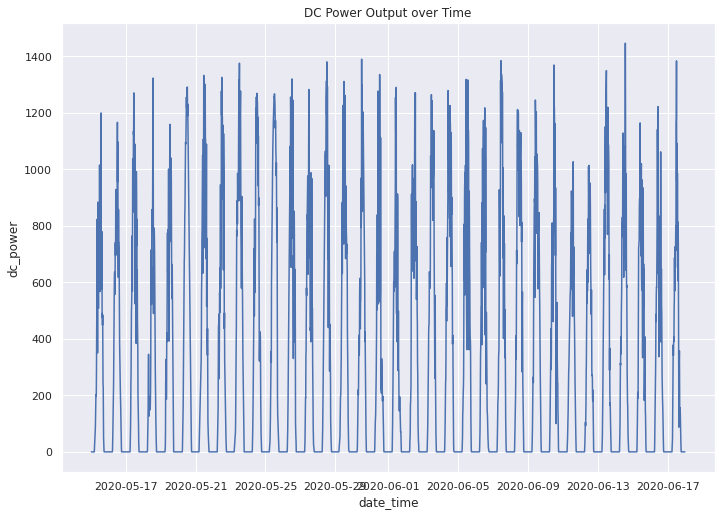

In [ ]:
# view an inverter's DC output over time
sns.lineplot(data=plant1[plant1['source_key']=='YxYtjZvoooNbGkE'], x='date_time', y='dc_power')
plt.title("DC Power Output over Time")
plt.show()

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

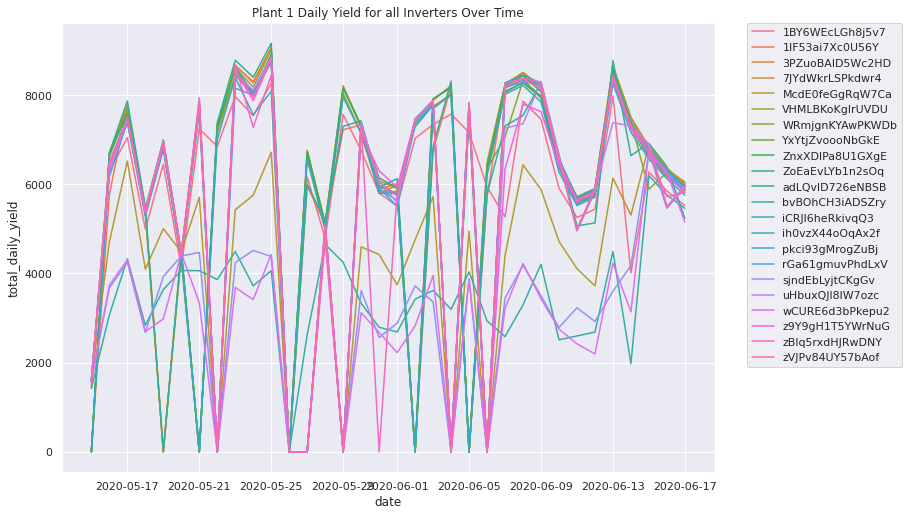

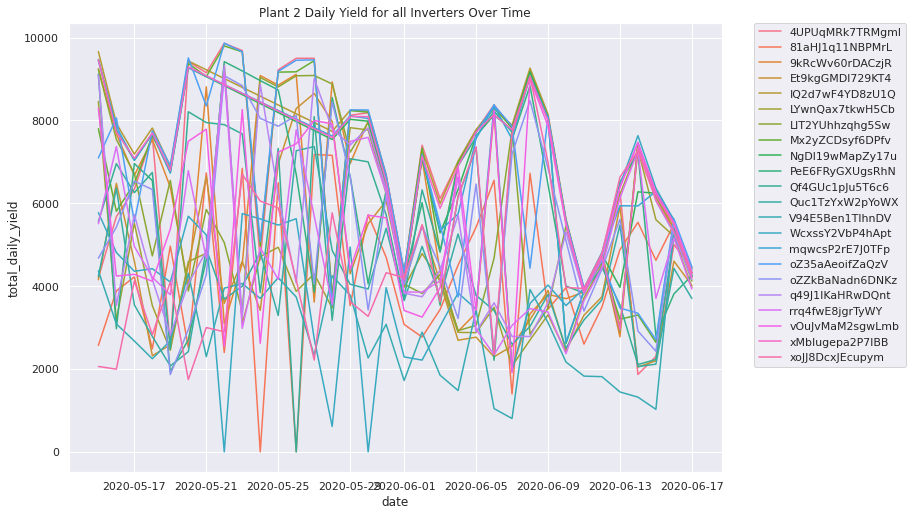

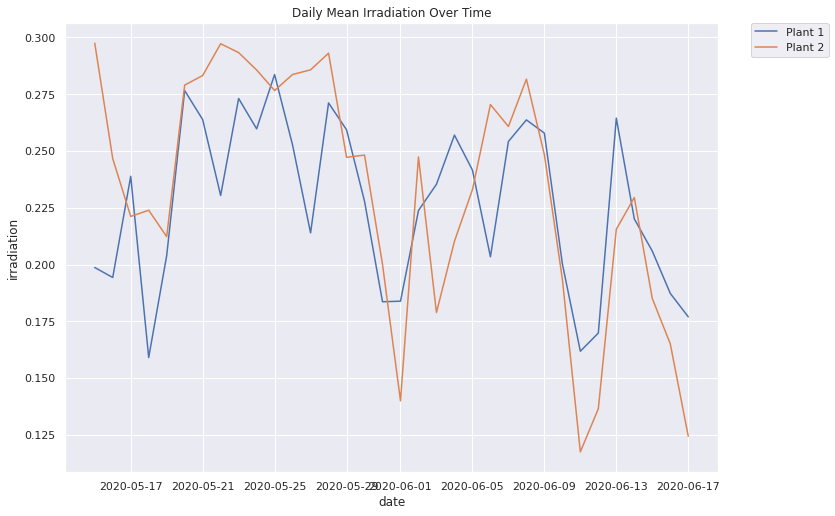

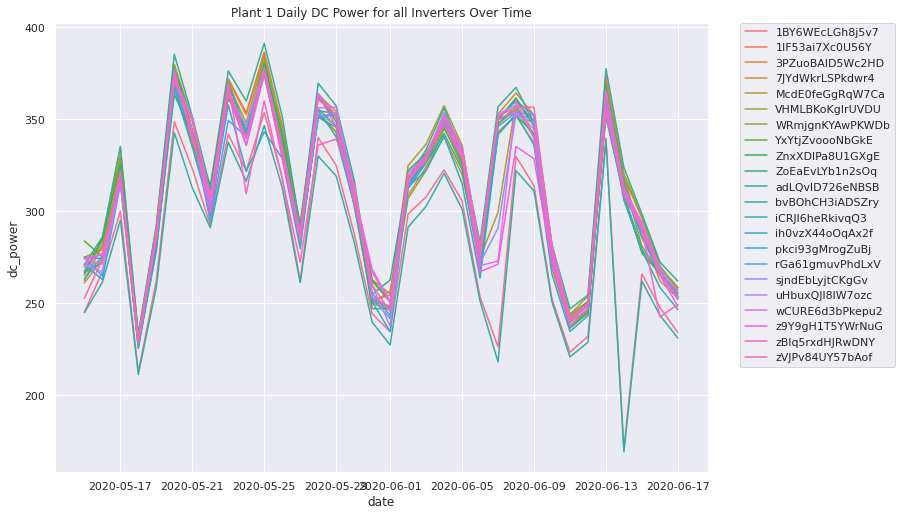

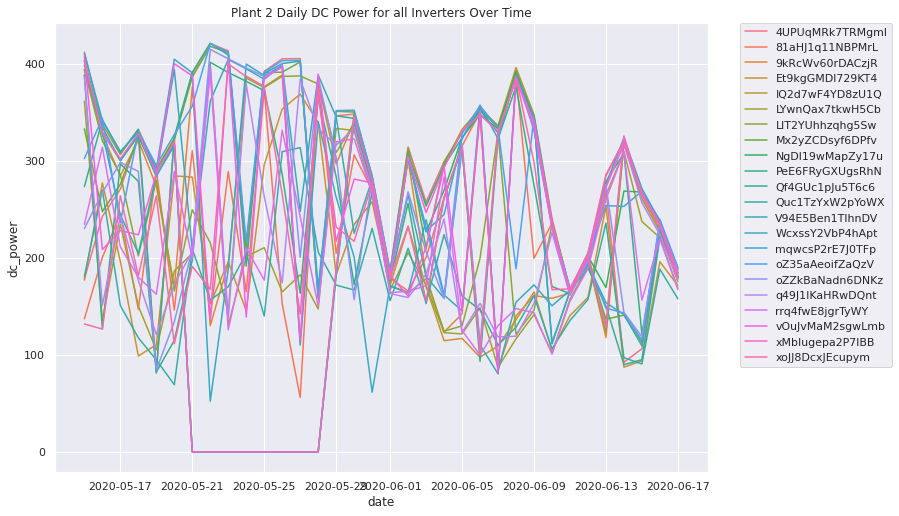

In [ ]:
# plots for all inverters

p1_grouped = plant1.groupby(['source_key', 'date']).last().reset_index()
p2_grouped = plant2.groupby(['source_key', 'date']).last().reset_index()

sns.lineplot(data=p1_grouped, x='date', y='total_daily_yield', hue='source_key')
plt.title("Plant 1 Daily Yield for all Inverters Over Time")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

sns.lineplot(data=p2_grouped, x='date', y='total_daily_yield', hue='source_key')
plt.title("Plant 2 Daily Yield for all Inverters Over Time")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

p1_mean_grouped = plant1.groupby('date').mean().reset_index()
p2_mean_grouped = plant2.groupby('date').mean().reset_index()

sns.lineplot(data=p1_mean_grouped, x='date', y='irradiation', label="Plant 1")
sns.lineplot(data=p2_mean_grouped, x='date', y='irradiation', label="Plant 2")
plt.title("Daily Mean Irradiation Over Time")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

p1_mean_grouped = plant1.groupby(['source_key', 'date']).mean().reset_index()
p2_mean_grouped = plant2.groupby(['source_key', 'date']).mean().reset_index()

sns.lineplot(data=p1_mean_grouped, x='date', y='dc_power', hue='source_key')
plt.title("Plant 1 Daily DC Power for all Inverters Over Time")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

sns.lineplot(data=p2_mean_grouped, x='date', y='dc_power', hue='source_key')
plt.title("Plant 2 Daily DC Power for all Inverters Over Time")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

#### Insights from these Plots

Plant 1 has some inverters that had no yield some days, and some whose dc power dropped lower than the rest. Those could be signs of faulty inverters.

Plant 2 has a lot more variation.  A couple interverters had no yield some days, and one had no dc power output for several consecutive days.  

Sunlight was similar for both plants, with some minor variation.

#### Things to Explore, Based on These Insights

Inverter performance might vary over time because of weather and other factors, but what about overall performance?  It would be interesting to see how the inverters perform by hour of the day, for the entire time period.

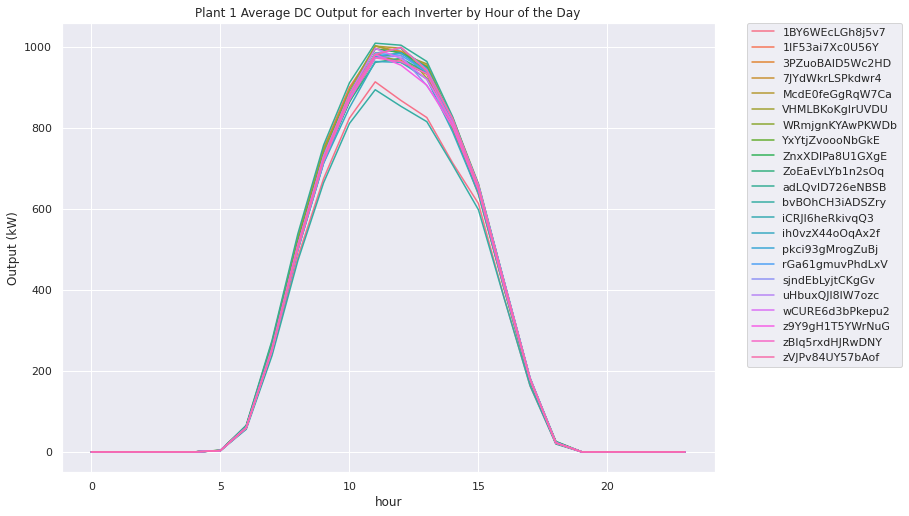

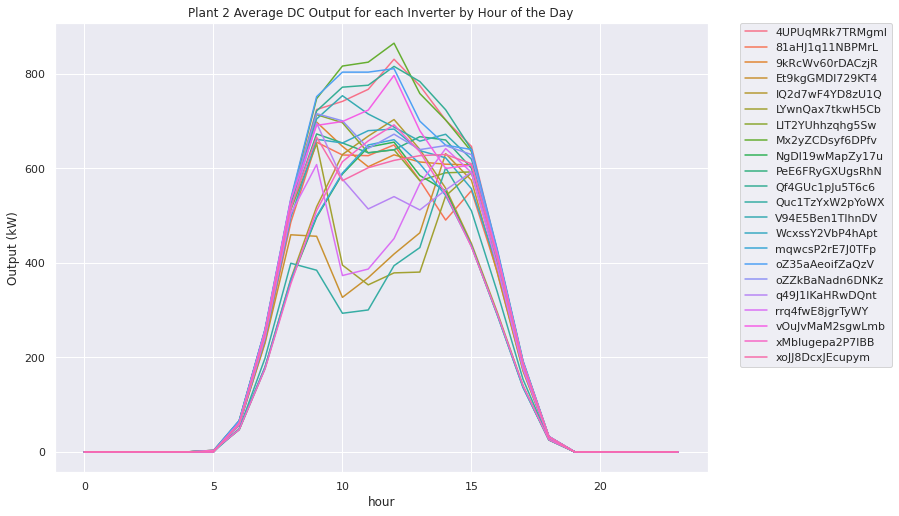

In [ ]:
# inverter performance might vary over time bc of weather & other factors
# but what about overall performance?  for all hours of the day for the entire period, how do the inverters perform?
p1_grouped = plant1.groupby(['source_key', 'hour']).last().reset_index()
p2_grouped = plant2.groupby(['source_key', 'hour']).last().reset_index()

sns.lineplot(data=p1_grouped, x='hour', y='avg_hourly_dc_power', hue='source_key')
plt.title("Plant 1 Average DC Output for each Inverter by Hour of the Day")
plt.ylabel("Output (kW)")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

sns.lineplot(data=p2_grouped, x='hour', y='avg_hourly_dc_power', hue='source_key')
plt.title("Plant 2 Average DC Output for each Inverter by Hour of the Day")
plt.ylabel("Output (kW)")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

#### Insights from These Plots

Plant 1 has a couple inverters with lower dc power, on average, than the rest.

Plant 2 has so much variation.  On average, plant 1 seems to have higher performing inverters, at least in terms of consistency and dc output.  It's interesting that plant 2 has a higher yields, on average, despite lower dc output.  

#### Things to Explore Next

I want to look at bivariate relationships.

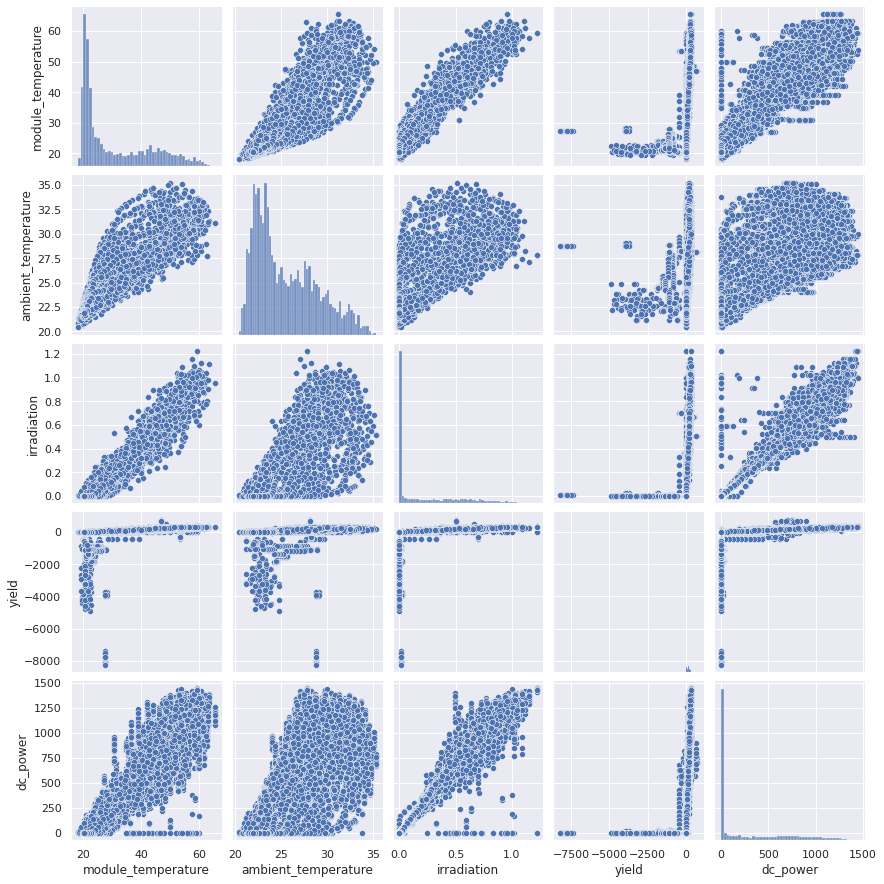

In [ ]:
sns.pairplot(data=plant1[['module_temperature', 'ambient_temperature', 'irradiation', 'yield', 'dc_power']])
plt.show()

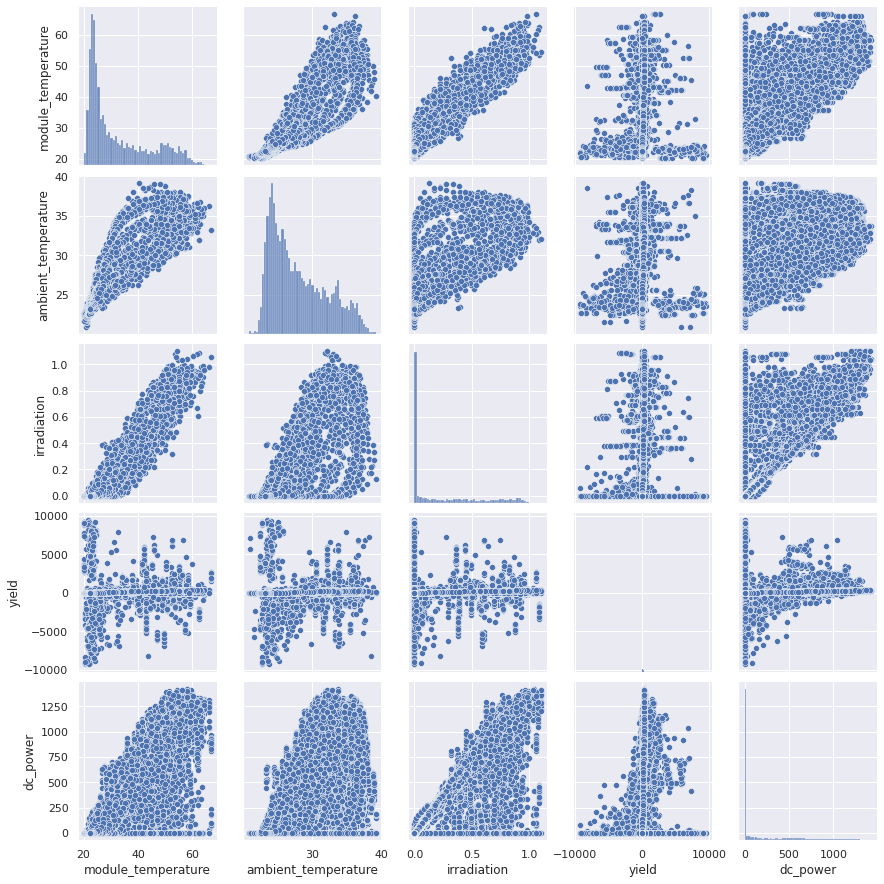

In [ ]:
sns.pairplot(data=plant2[['module_temperature', 'ambient_temperature', 'irradiation', 'yield', 'dc_power']])
plt.show()

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

#### Insights from These Plots

From these charts, it is apparent that:
1. Temperature and irradiation are all strongly correlated.  No surprise there.
2. The distribution of yield is strange, and because of it, it is hard to spot any trends.  It looks like dc_power might be a much more reliable indicator of output.  There are likely other factors affecting yield that are not in this dataset.  That would explain why yields sometimes drop during the day, as if they're being adjusted for some unobserved phenomenon. 
3. Plant 2 has so much variation that it hides the trend of power output to be related to temperature and irradiation.  

**After exploring the data, I have decied to use dc power as the target variable for forecasting, instead of yield.**  I will also use it for anomaly detection.

## Anomaly Detection

A good inverter should be consistently productive.  So I need to look at features that measure productivity and consistency.  That can be average daily yield by standard deviation in daily yield, or the number of times the inverter stopped working, as counted by the number of zeros in DC power output.  I will use the latter, since periodic outages are signs of a faulty inverter.

In [ ]:
a = plant1[plant1['dc_power'] == 0].groupby('source_key')['date_time'].count().reset_index().rename(columns={"date_time": "nbr_zeros_dc_power"}).sort_values('nbr_zeros_dc_power', ascending=False)
b = plant1.groupby(['source_key'])[['source_key', 'avg_daily_yield']].mean().reset_index().sort_values('avg_daily_yield', ascending=False)
plant1_efficiency = pd.merge(a, b, how='inner', on='source_key')

a = plant2[plant2['dc_power'] == 0].groupby('source_key')['date_time'].count().reset_index().rename(columns={"date_time": "nbr_zeros_dc_power"}).sort_values('nbr_zeros_dc_power', ascending=False)
b = plant2.groupby(['source_key'])[['source_key', 'avg_daily_yield']].mean().reset_index().sort_values('avg_daily_yield', ascending=False)
plant2_efficiency = pd.merge(a, b, how='inner', on='source_key')

fig = px.scatter(
    plant1_efficiency, x='nbr_zeros_dc_power', y='avg_daily_yield', 
    color='source_key', hover_data=['source_key'],
    title="Plant 1 Inverter Avg Daily Yield by Nbr Occurrences of 0 DC Output"
)
fig.update_layout(shapes = [
    {'type': 'line', 'yref': 'paper', 'xref': 'paper', 'y0': 0, 'y1': 1, 'x0': 0, 'x1': 1}
])
fig.show()

fig = px.scatter(
    plant2_efficiency, x='nbr_zeros_dc_power', y='avg_daily_yield', 
    color='source_key', hover_data=['source_key'],
    title="Plant 2 Inverter Avg Daily Yield by Nbr Occurrences of 0 DC Output"
)
fig.update_layout(shapes = [
    {'type': 'line', 'yref': 'paper', 'xref': 'paper', 'y0': 0, 'y1': 1, 'x0': 0, 'x1': 1}
])
fig.show()


In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

#### Insights from These Plots

The inverters in the top left of these plots are the best performers.  The ones in the bottom right are the worst. 

**The inverters in the bottom right section of these plots could be faulty and need replacing.**

#### Things to Look for Next

The next step is to look for times when all inverters performed poorly and irradiation was good.  This could indicate that the panels are all dirty at those times, and should be cleaned.

Plant 1 R^2 0.9823831504736822
Plant 2 R^2 0.5857464344712127


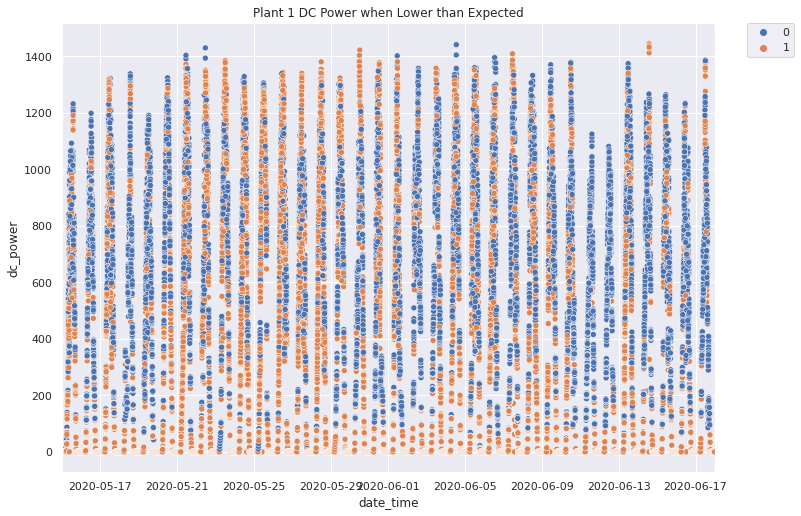

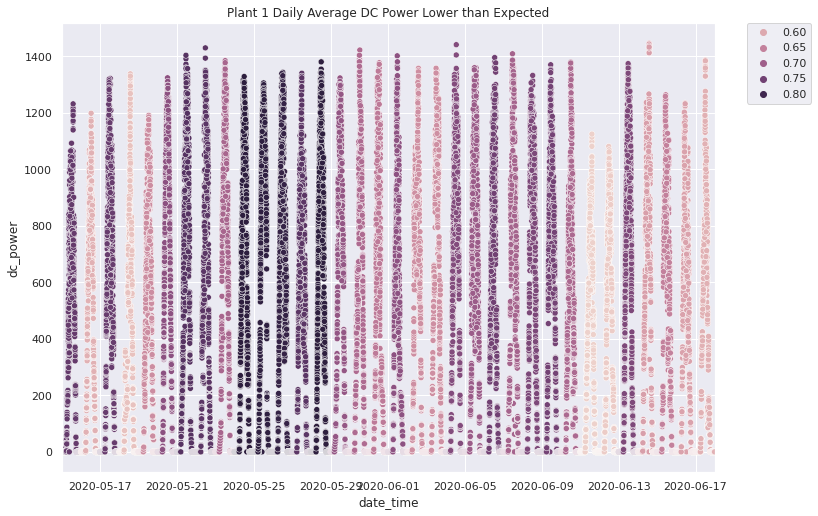

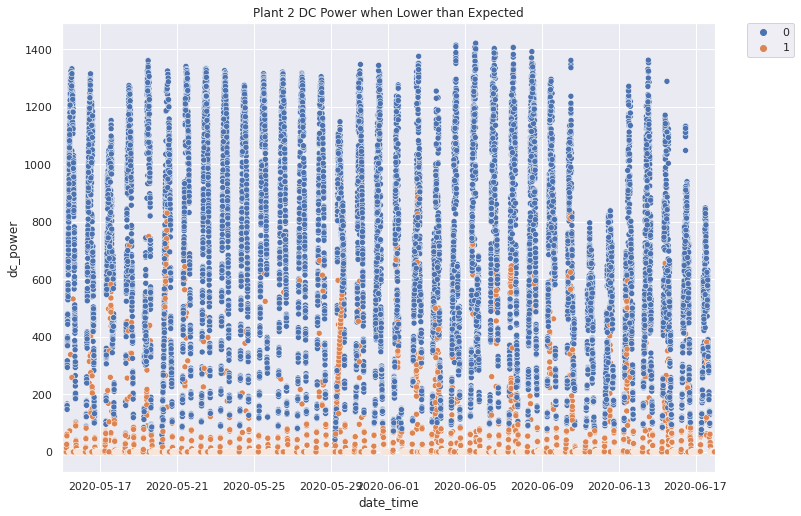

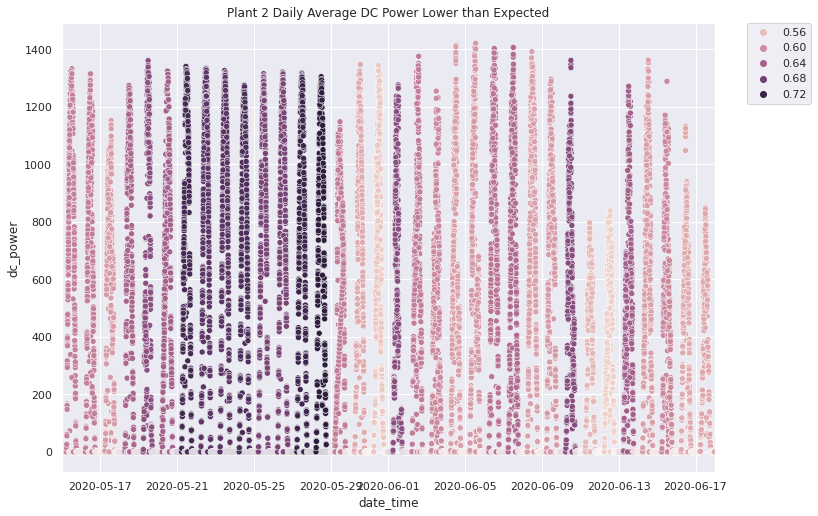

In [ ]:
# filter out possibly faulty inverters by finding them in the plots above
plant1_good = plant1[plant1['avg_daily_yield']>4000].copy()  # easier way to filter these out than by name (see graph)
plant2_good = plant2[plant2['avg_daily_yield']>4700].copy()

# regress dc_power on irradiation and module_temperature - they are linearly related, so a regression is appropriate
# do not fit an intercept, since there should be no power without irradiation
lr_model = LinearRegression(fit_intercept=False, normalize=True)
lr_model.fit(plant1_good[['module_temperature', 'irradiation']], plant1_good['dc_power'])
print("Plant 1 R^2", lr_model.score(plant1_good[['module_temperature', 'irradiation']], plant1_good['dc_power']))
lr_preds = lr_model.predict(plant1_good[['module_temperature', 'irradiation']])
residuals = plant1_good['dc_power'] - lr_preds
plant1_good['lower_dc_power_than_expected'] = np.where(residuals < 0, 1, 0)
plant1_good['1day_ma_of_lower_dc_power_than_expected'] = plant1_good.groupby('date')['lower_dc_power_than_expected'].transform(np.mean)

lr_model = LinearRegression(fit_intercept=False, normalize=True)
lr_model.fit(plant2_good[['module_temperature', 'irradiation']], plant2_good['dc_power'])
print("Plant 2 R^2", lr_model.score(plant2_good[['module_temperature', 'irradiation']], plant2_good['dc_power']))
lr_preds = lr_model.predict(plant2_good[['module_temperature', 'irradiation']])
residuals = plant2_good['dc_power'] - lr_preds
plant2_good['lower_dc_power_than_expected'] = np.where(residuals < 0, 1, 0)
plant2_good['1day_ma_of_lower_dc_power_than_expected'] = plant2_good.groupby('date')['lower_dc_power_than_expected'].transform(np.mean)

sns.scatterplot(data=plant1_good, x='date_time', y='dc_power', hue='lower_dc_power_than_expected')
plt.title("Plant 1 DC Power when Lower than Expected")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xlim(plant1_good.date_time.min(), plant1_good.date_time.max())
plt.show()

sns.scatterplot(data=plant1_good, x='date_time', y='dc_power', hue='1day_ma_of_lower_dc_power_than_expected')
plt.title("Plant 1 Daily Average DC Power Lower than Expected")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xlim(plant1_good.date_time.min(), plant1_good.date_time.max())
plt.show()

sns.scatterplot(data=plant2_good, x='date_time', y='dc_power', hue='lower_dc_power_than_expected')
plt.title("Plant 2 DC Power when Lower than Expected")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xlim(plant2_good.date_time.min(), plant2_good.date_time.max())
plt.show()

sns.scatterplot(data=plant2_good, x='date_time', y='dc_power', hue='1day_ma_of_lower_dc_power_than_expected')
plt.title("Plant 2 Daily Average DC Power Lower than Expected")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xlim(plant2_good.date_time.min(), plant2_good.date_time.max())
plt.show()

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

**The dark purple bands in these plots show when all of the inverters for a plant, on average, performed worse than expected.  It could indicate that the panels needed to be cleaned.**

Interestingly, there are times when the performance was worse than expected, and then suddenly turned around.  That could indicate that the panels were cleaned.  Signs pointing to this are the colors getting darker purple over time, then quickly reversing to light pink.

In the absence of labeled data or knowledge of when (or if) the panels were cleaned during this time period, guessing when panels are dirty based on changes in collective inverter performance is the best we can do.

## Forecasting Future Output

The problem with forecasting solar power generation is that is is so dependent on weather.  Fitting an autoregressive model to yield or output seems silly, because by definition, autoregression fits a variable to its previous values.  How can you predict power generation without knowing anything about the weather?  The weather data is not very helpful here either.  Yes, we can say that the number of hours of sunlight tomorrow should be similar to what they are today, but that is assuming there are no clouds.  There is no way to predict how cloud cover might impact irradiation, with the features in this dataset.  So there is no clean way to forecast power generation.  Nevertheless, I will fit a model and see what happens.  

#### Approach

I explained before why yield was an unreliable feature.  So DC power will be my target variable. 

The first model I will fit is a model that forecasts DC Power, at the 15 minute level, for each inverter.  I will use irradiation and module temperature as features.  A simple regression model that predicts DC power output for given values of irradiation and module temperature would be useful, but it would be more useful to forecast future outputs.  So the model will make 1 step forecasts (forecasts of the DC power output over the next 15 minutes), and it will be specific to an inverter.   

This first model of DC power can be used to find outliers in the DC power output of an individual inverter.  By calculating the 95% prediction intervals, outliers can be found by comparing the true DC power outputs to the predicted value intervals.  Since we only really care about faulty inverters, the lower interval will be of the most importance.  So observations that are lower than expected (predicted) will be plotted, and any trends will become visible.  The trends may show whether an inverter is performing worse than expected for consecutive time steps, which may indicate that the inverter is faulty and needs replacing.  However, when making any judgements on inverter faultiness using the model, it will be important to remember that the benchmark for "good" performance is the inverter's own historical performance.  So if the inverter performed poorly from the start of the dataset, the model may not show anything useful, because it will have trained exclusively on poor performance. 

Another thing that would be useful for a power plant to know is what its expected daily output would be, going into the future.  Each inverter has an average DC output for each day (the average DC power output of every 15 minute interval while there is sunlight).  A model could be fitted to these to forecast the average DC power output for the entire plant.  So I will fit a second model to forecast the average DC power output, for all of a plant's inverters, for the next day.  

In [ ]:
# get a list of inverters, so that 1 can be used as an example
set(plant1.source_key)

{'1BY6WEcLGh8j5v7',
 '1IF53ai7Xc0U56Y',
 '3PZuoBAID5Wc2HD',
 '7JYdWkrLSPkdwr4',
 'McdE0feGgRqW7Ca',
 'VHMLBKoKgIrUVDU',
 'WRmjgnKYAwPKWDb',
 'YxYtjZvoooNbGkE',
 'ZnxXDlPa8U1GXgE',
 'ZoEaEvLYb1n2sOq',
 'adLQvlD726eNBSB',
 'bvBOhCH3iADSZry',
 'iCRJl6heRkivqQ3',
 'ih0vzX44oOqAx2f',
 'pkci93gMrogZuBj',
 'rGa61gmuvPhdLxV',
 'sjndEbLyjtCKgGv',
 'uHbuxQJl8lW7ozc',
 'wCURE6d3bPkepu2',
 'z9Y9gH1T5YWrNuG',
 'zBIq5rxdHJRwDNY',
 'zVJPv84UY57bAof'}

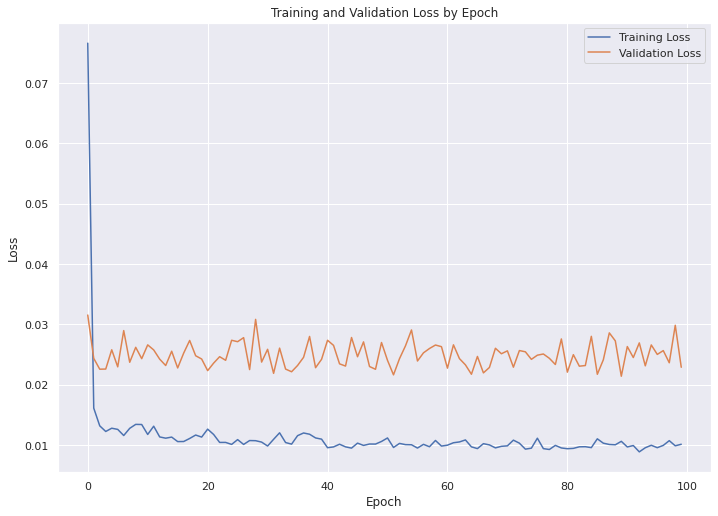

Prediction shape: (1782, 1)


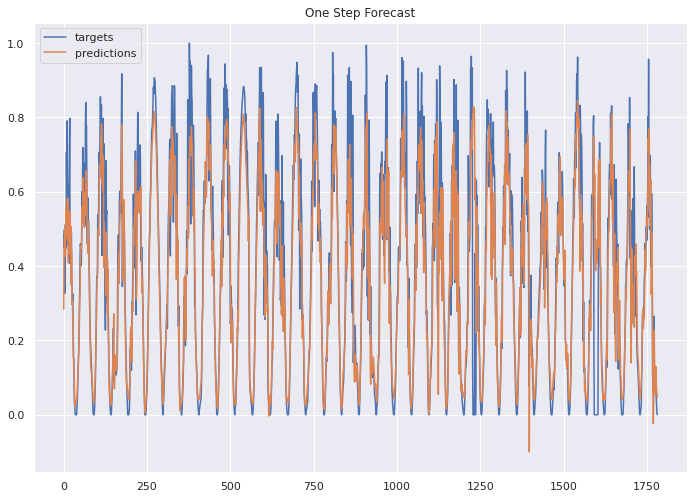

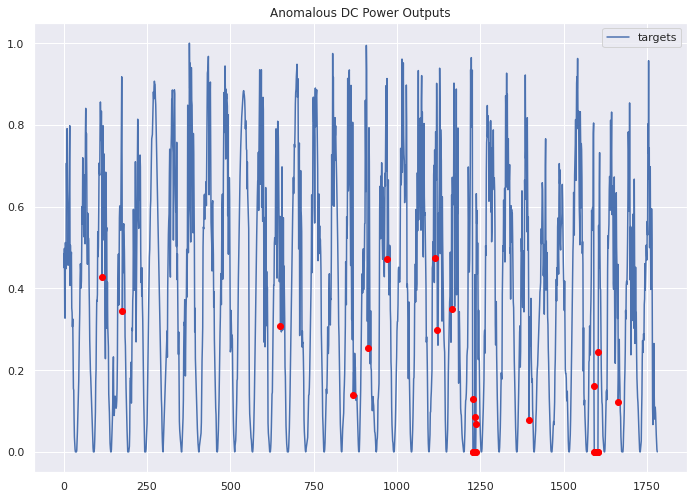

35 total anomalies


'\nfor i in p1_inverters:\n    inverter_models[i] = InverterModel(df=plant1, source_key=i).forecast(show_plot=False)\nfor i in p2_inverters:\n    inverter_models[i] = InverterModel(df=plant2, source_key=i).forecast(show_plot=False)\n'

In [ ]:
class InverterModel:
    def __init__(self, df, source_key):
        self.df = df
        self.source_key = source_key
        self.N = None
        self.T = 16  # use T previous time steps to predict the next one (there are 4 per hour)
        self.D = 2  # irradiation and module_temperature are the features to be used
        self.model = None
        self.r = None
        self.predictions = None
        self.validation_predictions = None
        self.anomalies = None

    def _prepare_input_data(self):
        """
        Prepares input data for a LSTM, for a given source_key.  
        Input will be a N x T x D array, where:
            N = number of samples, or rows
            T = number of time steps to predict into the future
            D = number of features
        The data will be normalized, and the first half will be used as the training set,
        while the second half will be used as the validation set.  This method assumes 
        that the dataset has already been sorted by date_time.
        """
        # remove the times when irradiation = 0
        dsub = self.df[
            (self.df['irradiation'] > 0) & (self.df['source_key']==self.source_key)
        ][['dc_power', 'irradiation', 'module_temperature']].values

        # store the number of samples
        self.N = len(dsub)

        # normalize the data
        # use the first half of the dataset for training and the second half for validation
        # so fit the scaler to the first half, but transform all of it
        normalizer = MinMaxScaler()
        normalizer.fit(dsub[:-self.N//2])
        dsub = normalizer.transform(dsub)

        # reshape the data in preparation for input
        X = []
        Y = []
        for t in range(dsub.shape[0] - self.T):
            x = dsub[t:t+self.T, 1:]  # stop at time t+T, because t+T is the target
            X.append(x)
            y = dsub[t+self.T, 0]
            Y.append(y)

        # store arrays as object attributes, so they can be referenced in other methods
        self.X = np.array(X)
        self.Y = np.array(Y)

        # ensure that the X inputs are shape (N-T, T, D) and the Y inputs are shape (N,)
        assert self.X.shape == (len(dsub)-self.T, self.T, self.D)
        assert self.Y.shape[0] == len(dsub)-self.T

    def _fit_lstm(self):
        """
        Builds and trains an LSTM model on the given dataset.  The first half of the 
        dataset is used for training, and the second half is used for validation.
        """
        # build LSTM model
        i = Input(shape=(self.T, self.D))
        x = LSTM(10)(i)
        x = Dense(5)(x)
        x = Dense(1)(x)
        self.model = Model(i, x)
        self.model.compile(
            loss='mse',
            optimizer=Adam(lr=0.05),
        )

        # train the LSTM
        # use the first half of the dataset for training and the second half for validation
        self.r = self.model.fit(
            self.X[:-self.N//2], self.Y[:-self.N//2],
            batch_size=32,
            epochs=100,
            validation_data=(self.X[-self.N//2:], self.Y[-self.N//2:]),
            verbose=0,
        )

    def _plot_lstm_loss(self):
        """
        Plots the LSTM's training and validation loss.
        """
        plt.plot(self.r.history['loss'], label='Training Loss')
        plt.plot(self.r.history['val_loss'], label='Validation Loss')
        plt.legend()
        plt.title("Training and Validation Loss by Epoch")
        plt.xlabel("Epoch")
        plt.ylabel("Loss")
        plt.show()
    
    def _one_step_forecast(self, show_plot=False):
        """
        Makes one-step forecast using true targets
        """
        outputs = self.model.predict(self.X)
        print("Prediction shape:", outputs.shape)
        self.predictions = outputs[:,0]

        if show_plot:
            plt.plot(self.Y, label='targets')
            plt.plot(self.predictions, label='predictions')
            plt.title("One Step Forecast")
            plt.legend()
            plt.show()
    
    def _multi_step_forecast(self, show_plot=False):
        """
        Makes multi-step forecast using true targets from validation set
        """
        validation_target = self.Y[-self.N//2:]
        self.validation_predictions = []

        # first validation input
        last_x = self.X[-self.N//2]  # array of shape (T, D)

        while len(self.validation_predictions) < len(validation_target):
            # get predictions and turn the 1x1 array into a scaler
            pred = self.model.predict(last_x.reshape(1, self.T, self.D))[0,0]

            # update the predictions list
            self.validation_predictions.append(pred)

            # make the new input
            last_x = np.roll(last_x, -1)
            last_x[-1] = pred

        if show_plot:
            plt.plot(validation_target, label='True Value')
            plt.plot(self.validation_predictions, label='Forecasted Value')
            plt.title(f"{self.T} Step Forecast for the Validation Set")
            plt.legend()
            plt.show()
    
    def _find_anomalies(self, anomaly_type="low", show_plot=False):
        """
        Finds the anomalies in the one-step ahead predictions, using a 
        95% prediction interval.  The anomaly_type specifies whether to 
        focus on samples where the true value was outside of the prediction interval.
        For instance, we may only wish to see samples where output was lower than 
        expected.
        """
        # calculate the prediction interval to find anomalies
        sum_errors = np.sum((self.Y-self.predictions)**2)
        stdev = np.sqrt(1/(len(self.Y)-2) * sum_errors)
        
        # 95% prediction interval = 1.96 standard deviations
        interval = 1.96 * stdev
        lower, upper = self.predictions - interval, self.predictions + interval
        
        # samples where the true value was outside of the prediction interval
        if anomaly_type == "high":
            self.anomalies = np.where(self.Y > upper, 1, 0)
        elif anomaly_type == "low":
            self.anomalies = np.where(self.Y < lower, 1, 0)
        else:
            self.anomalies = np.where(((self.Y > upper) | (self.Y < lower)), 1, 0)

        if show_plot:
            plt.plot(self.Y, label='targets')
            #plt.plot(upper, label='predictions')
            for idx, a in enumerate(list(self.anomalies)):
                if a == 1:
                    plt.plot((idx), (self.Y[idx]), 'o', color='red')
            plt.legend()
            plt.title("Anomalous DC Power Outputs")
            plt.show()

        print(f"{np.sum(self.anomalies)} total anomalies")

    def forecast(self, forecast_type='single_step', show_plot=False):
        """
        Executes all methods in order, and forecasts the given number of steps ahead.
        """
        self._prepare_input_data()
        self._fit_lstm()
        if show_plot:
            self._plot_lstm_loss()
        if forecast_type == 'single_step':
            self._one_step_forecast(show_plot=show_plot)
        else:
            self._multi_step_forecast(show_plot=show_plot)
        self._find_anomalies(show_plot=show_plot)

# run 1 inverter as a test/example
InverterModel(df=plant1, source_key='1BY6WEcLGh8j5v7').forecast(show_plot=True)

# fit a model to each inverter
p1_inverters = list(set(plant1.source_key))
p2_inverters = list(set(plant2.source_key))

inverter_models = dict.fromkeys(p1_inverters + p2_inverters)
'''
for i in p1_inverters:
    inverter_models[i] = InverterModel(df=plant1, source_key=i).forecast(show_plot=False)
for i in p2_inverters:
    inverter_models[i] = InverterModel(df=plant2, source_key=i).forecast(show_plot=False)
'''

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

My suspicions about the plausibility of forecasting output with the features in this dataset seem to have proven accurate, as the LSTM model is overfitting the training set.  The model has picked up on the daily cycles of sunlight, but its performance on the validation set is poor.  

When the model is used to make multi-step forecasts (15 minute forecasts for the next 4 hours), it performs horribly.  This may be due to the influence of weather, which cannot possibly be predicted with the provided data. 

Now I will move on to forecasting the average daily DC power output for each plant.  

In [ ]:
# univariate modeling of avg daily DC power, for all inverters, at the day level
all_inverters = []
for i in p1_inverters:
    dsub = plant1[plant1['source_key']==i].groupby('date')['avg_daily_dc_power'].last().reset_index(drop=True).values
    all_inverters.append(dsub)

# create a N x T x D matrix, where:
#  N = number of samples (34 days)
#  T = number of time steps to predict into the future
#  D = number of features (22 inverters)
all_inverters = np.array(all_inverters).T

# store the number of samples
N = len(all_inverters)

# normalize the data
# use the first half of the dataset for training and the second half for validation
# so fit the scaler to the first half, but transform all of it
normalizer = MinMaxScaler()
normalizer.fit(all_inverters[:-N//2])
all_inverters = normalizer.transform(all_inverters)

# reshape the data in preparation for input
T = 1  # use T previous time steps to predict the next one (there are 4 per hour)
D = all_inverters.shape[1]
X = []
Y = []
for t in range(all_inverters.shape[0] - T):
    x = all_inverters[t:t+T]  # stop at time t+T, because t+T is the target
    X.append(x)
    y = all_inverters[t+T]
    Y.append(y)

X = np.array(X)
Y = np.array(Y)

# ensure that the X inputs are shape (N, T, D) and the Y inputs are shape (N,)
print(X.shape)
print(Y.shape)

(33, 1, 22)
(33, 22)


In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

In [ ]:
# build LSTM model
i = Input(shape=(T, D))
x = LSTM(10)(i)
x = Dense(5)(x)
x = Dense(1)(x)
model = Model(i, x)
model.compile(
  loss='mse',
  optimizer=Adam(lr=0.05),
)

# train the LSTM
# use the first half of the dataset for training and the second half for validation
r = model.fit(
  X[:-N//2], Y[:-N//2],
  batch_size=32,  # data is small enough to fit into 1 batch
  epochs=100,
  validation_data=(X[-N//2:], Y[-N//2:]),
)

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 0.3992 - val_loss: 0.4248
Epoch 2/100
1/1 [==============================] - 0s 39ms/step - loss: 0.4779 - val_loss: 0.1684
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1670 - val_loss: 0.0776
Epoch 4/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0894 - val_loss: 0.1022
Epoch 5/100
1/1 [==============================] - 0s 34ms/step - loss: 0.1424 - val_loss: 0.1117
Epoch 6/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1584 - val_loss: 0.0997
Epoch 7/100
1/1 [==============================] - 0s 34ms/step - loss: 0.1400 - val_loss: 0.0838
Epoch 8/100
1/1 [==============================] - 0s 32ms/step - loss: 0.1118 - val_loss: 0.0755
Epoch 9/100
1/1 [==============================] - 0s 272ms/step - loss: 0.0887 - val_loss: 0.0796
Epoch 10/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0780 - val_loss: 0.0948
Epoch 11/100
1/1 [==

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

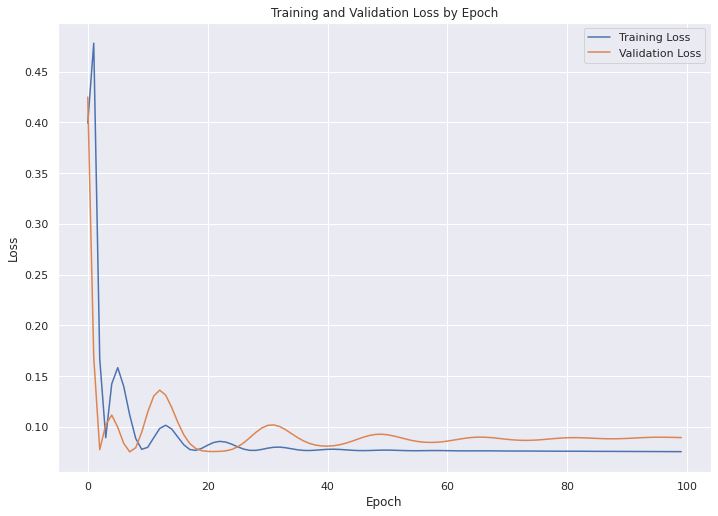

In [ ]:
# Plot the loss
plt.plot(r.history['loss'], label='Training Loss')
plt.plot(r.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title("Training and Validation Loss by Epoch")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.show()

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

(33, 1)


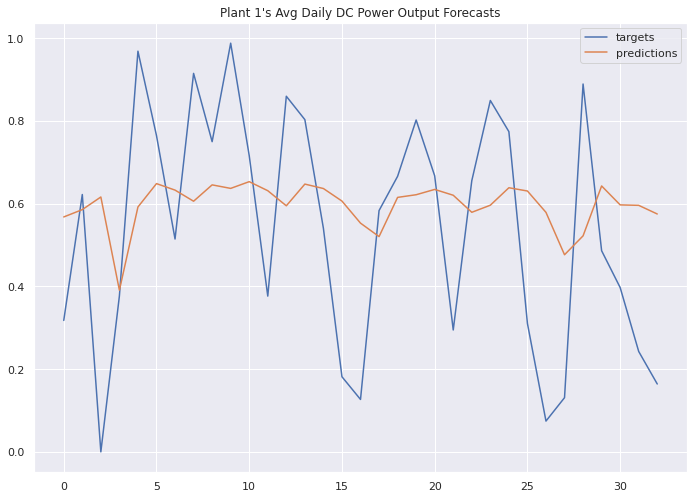

In [ ]:
# One-step forecast using true targets
outputs = model.predict(X)
print(outputs.shape)
predictions = outputs[:,0]

plt.plot(np.mean(Y, axis=1), label='targets')
plt.plot(predictions, label='predictions')
plt.title("Plant 1's Avg Daily DC Power Output Forecasts")
plt.legend()
plt.show()

In [ ]:
curr_time = time.time()
runtime_arr[index] = curr_time - prev_time
index += 1
prev_time = curr_time

All the model seems to be doing is learning a moving average.  That is not too surprising, as the model cannot learn anything about the weather, so predicting something close to the average output likely yields the lowest mean squared error.  **What this means is that unless a power plant has reliable weather forecasting available, the best it may be able to do when forecasting its output is to use climate data for irradiation, and use the historical average output as its forecast.**

This is the end of source program
<hr style="border:1.5px solid gray"> </hr>

# Plotting runtime execution time

In [ ]:
# Storing runtime values
# For index meaning, look at the index explanation above
example_exec_time = runtime_arr

[Text(0, 0.5, 'time (second)'),
 Text(0.5, 0, 'index'),
 Text(0.5, 1.0, 'Modification Program Execution Time')]

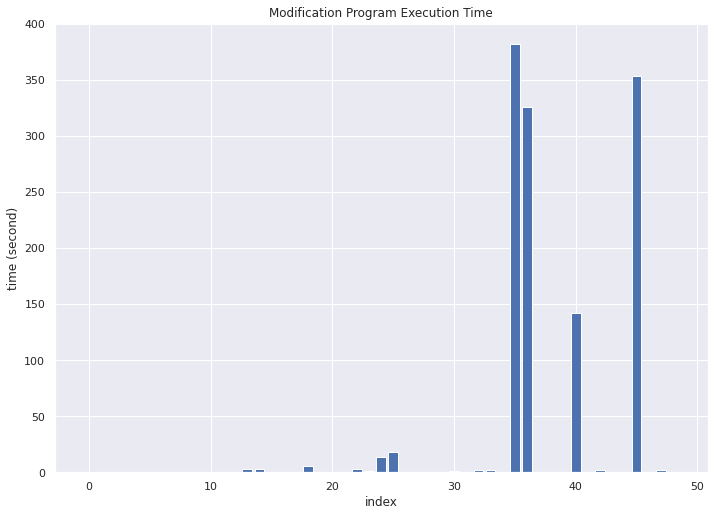

In [ ]:
# Plotting
x = np.arange(0, len(code_exec_time), 1)
t = code_exec_time
ax = plt.axes()
ax.bar(x, t)
ax.set(xlabel='index', ylabel='time (second)', title='Modification Program Execution Time')

[Text(0, 0.5, 'time (second)'),
 Text(0.5, 0, 'index'),
 Text(0.5, 1.0, 'Example Program Execution Time')]

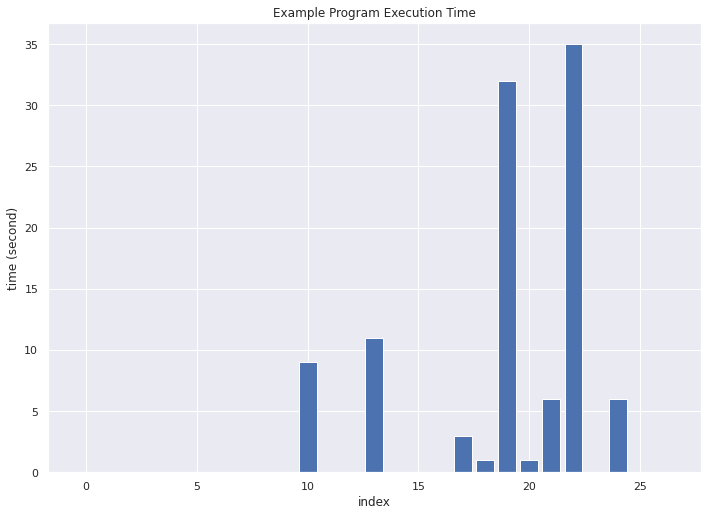

In [ ]:
# Plotting
x = np.arange(0, len(example_exec_time), 1)
t = example_exec_time
ax = plt.axes()
ax.bar(x, t)
ax.set(xlabel='index', ylabel='time (second)', title='Example Program Execution Time')

# Comparing runtime execution time for both code

Index explanation :

Own code :

Dataset preparation :
- 0 : Reading dataset
- 1 : Showing info for dataframe

Data cleaning
- 2 : Convert date and time for to pandas datetime
- 3 : Check for null values
- 4 : Check for missing data
- 5 : Fill missing data with NaN
- 6 : Reducing memory hog
- 7 : Sanity check

- 8 : Combining datasets
- 9 : Figure out sunrise and sunset times

Fill null values :
- 10 : Create additional time features
- 11 : Determine how total yield is calculated
- 12 : Inserting missing time steps

Check data distribution :
- 13 : Check data distribution for plant 1
- 14 : Check data distribution for plant 2

Fixing weird daily_yield data
- 15 : Fixing weird daily_yield data
- 16 : Rescale plant 1's DC power values

Feature engineering :
- 17 : Manually spot check the features
- 18 : Plotting distribution of each feature

EDA (Explorative Data Analysis) :
- 19 : Inspect outliers in yield and hourly_yield of plant 1
- 20 : Inspect outliers in yield and hourly_yield of plant 2
- 21 : Remove some of the features
- 22 : Plotting DC power output for all inverter
- 23 : Plotting overall inverter performance
- 24 : Bivariate relationship plot of plant 1
- 25 : Bivariate relationship plot of plant 2
- 26 : Pearson's correlation plot of plant 1
- 27 : Pearson's correlation plot of plant 2
- 28 : Spearman's correlation plot of plant 1
- 29 : Spearman's correlation plot of plant 2
- 30 : Kendall's correlation plot of plant 1
- 31 : Kendall's correlation plot of plant 2

Anomaly detection :
- 32 : Consistency check by 0 output
- 33 : Consistency check by output distribution
- 34 : Filter out faulty inverters
- 35 : Regress dc_power against module_temperature and irradiation on plant 1
- 36 : Regress dc_power against module_temperature and irradiation on plant 2

Forecasting :
- 37 : LSTM class definition
- 38 : Function for splitting sequences into samples
Plant 1 : 
- 39 : Preparation
- 40 : Training
- 41 : Plotting loss value for each epoch
- 42 : Predicting the values
- 43 : Plotting actual and predicted DC output
Plant 2 : 
- 44 : Preparation
- 45 : Training
- 46 : Plotting loss value for each epoch
- 47 : Predicting the values
- 48 : Plotting actual and predicted DC output

Example code :

- 0 : read datasets

Data Cleaning :
- 1 : convert date-times to pandas datetime format
- 2 : checking for null values
- 3 : counting missing data
- 4 : fill NaNs
- 5 : prepare data for merging
- 6 : figure out sunset and sunrise time
- 7 : create additional time features
- 8 : determine how total yield is calculated
- 9 : fill null values
- 10 : plotting data distribution for each plant
- 11 : fix unreasonably daily_yield values

Feature Engineering :
- 12 : calculate other useful features
- 13 : manually spot check the features
- 14 : inspect outliers in yield and hourly_yield
- 15 : remove some feature

Exploratory Data Analysis : 
- 16 : view an inverter's DC output over time
- 17 : plotting daily_yield, irradiation, and dc_power for all inverters
- 18 : plotting dc_output for each plant by the hour
- 19 : plotting bivariate relationship plot for each plant data
- 20 : searching for faulty inverters
- 21 : filter out faulty inverters and regress dc_power

Forecasting Future Output :
- 22 : LSTM class definition
- 23 : modelling each variable
- 24 : build LSTM object and training
- 25 : plotting loss
- 26 : forecasting using true targets

Index 1 is for our own code

Index 2 is for example code

In [ ]:
def arr_sum(arr, x1, x2):
  sum = 0
  for index in range(x1, x2+1, 1):
    sum += arr[index]
  return sum

## Data preparation and cleaning

own code 	: 7.015800476074219 seconds
example code 	: 9 seconds


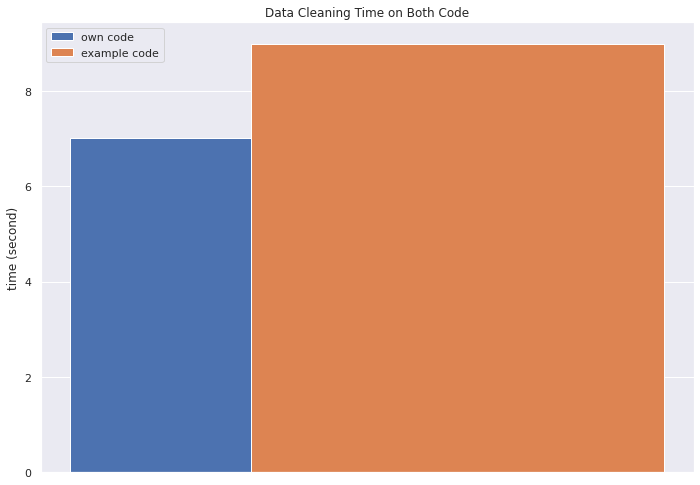

In [ ]:
# Plotting

# Data to plot
n_groups = 1
t1 = (arr_sum(code_exec_time, 0, 16))
t2 = (arr_sum(example_exec_time, 0, 11))
print("own code \t:", t1, "seconds")
print("example code \t:", t2, "seconds")

# Create plot
bar_width = 0.35

fig, ax = plt.subplots()
index = np.arange(n_groups)

rects1 = plt.bar(index, t1, label="own code")
rects2 = plt.bar(index+bar_width, t2, label="example code")

plt.title("Data Cleaning Time on Both Code")

plt.xticks([])
plt.ylabel("time (second)")
plt.legend()
plt.show()

## Feature engineering

own code 	: 6.30044960975647 seconds
example code 	: 11 seconds


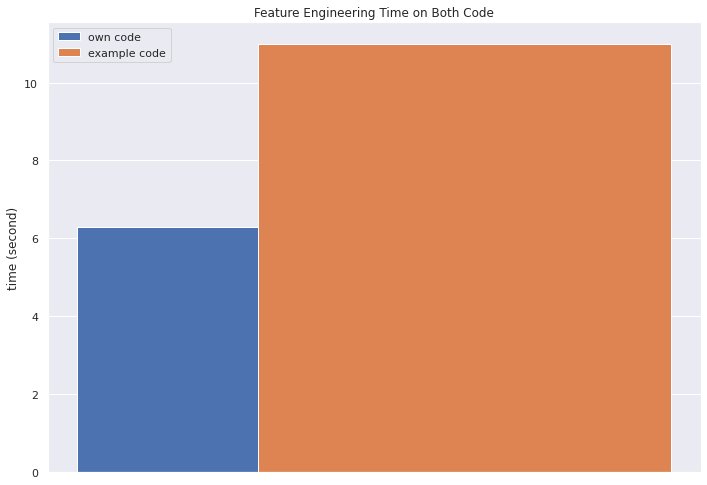

In [ ]:
# Plotting

# Data to plot
n_groups = 1
t1 = (arr_sum(code_exec_time, 17, 18))
t2 = (arr_sum(example_exec_time, 12, 15))
print("own code \t:", t1, "seconds")
print("example code \t:", t2, "seconds")

# Create plot
bar_width = 0.35

fig, ax = plt.subplots()
index = np.arange(n_groups)

rects1 = plt.bar(index, t1, label="own code")
rects2 = plt.bar(index+bar_width, t2, label="example code")

plt.title("Feature Engineering Time on Both Code")

plt.xticks([])
plt.ylabel("time (second)")
plt.legend()
plt.show()

## Exploratory data analysis

own code 	: 39.2451376914978 seconds
example code 	:  43 seconds


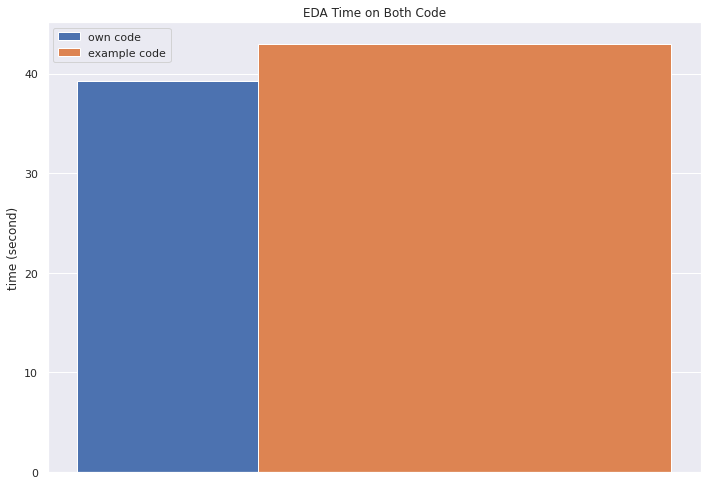

In [ ]:
# Plotting

# Data to plot
n_groups = 1
t1 = (arr_sum(code_exec_time, 19, 31))
t2 = (arr_sum(example_exec_time, 16, 21))
print("own code \t:", t1, "seconds")
print("example code \t: ", t2, "seconds")

# Create plot
bar_width = 0.35

fig, ax = plt.subplots()
index = np.arange(n_groups)

rects1 = plt.bar(index, t1, label="own code")
rects2 = plt.bar(index+bar_width, t2, label="example code")

plt.title("EDA Time on Both Code")

plt.xticks([])
plt.ylabel("time (second)")
plt.legend()
plt.show()

### Comparison of data correlation check

bivariate 	: 32.0439236164093 seconds
pearson 	: 0.7184679508209229 seconds
spearman 	: 0.7303895950317383 seconds
kendall 	: 1.267265796661377 seconds


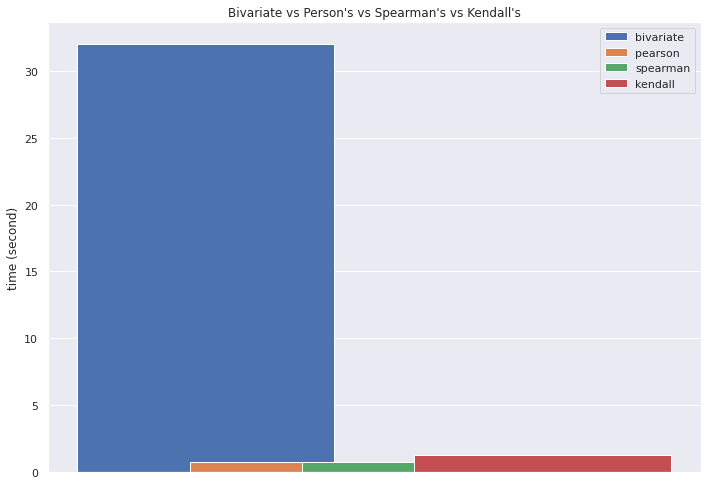

In [ ]:
# Plotting

# Data to plot
n_groups = 1
bivariate = (arr_sum(code_exec_time, 24, 25))
pearson = (arr_sum(code_exec_time, 26, 27))
spearman = (arr_sum(code_exec_time, 28, 29))
kendall = (arr_sum(code_exec_time, 30, 31))
print("bivariate \t:", bivariate, "seconds")
print("pearson \t:", pearson, "seconds")
print("spearman \t:", spearman, "seconds")
print("kendall \t:", kendall, "seconds")

# Create plot
bar_width = 0.35

fig, ax = plt.subplots()
index = np.arange(n_groups)

rects1 = plt.bar(index, bivariate, label="bivariate")
rects2 = plt.bar(index+bar_width, pearson, label="pearson")
rects3 = plt.bar(index+2*bar_width, spearman, label="spearman")
rects4 = plt.bar(index+3*bar_width, kendall, label="kendall")

plt.title("Bivariate vs Person's vs Spearman's vs Kendall's")

plt.xticks([])
plt.ylabel("time (second)")
plt.legend()
plt.show()

### Comparison of anomaly detection

own code 	: 1.8552401065826416 seconds
example code 	: 1.9698474407196045 seconds


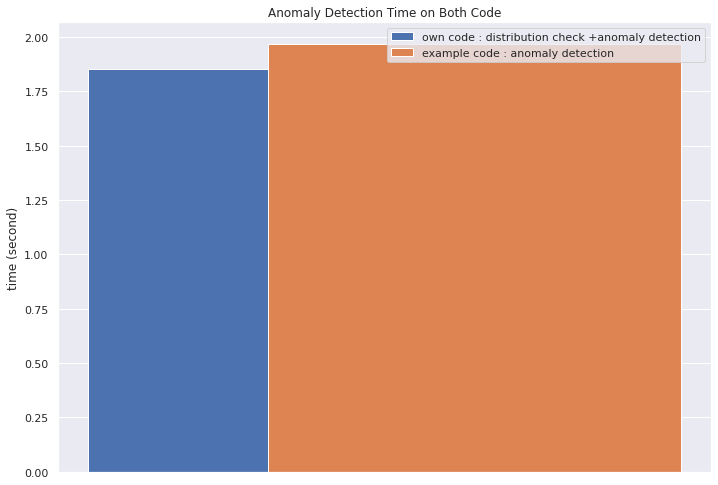

In [ ]:
# Plotting

# Data to plot
n_groups = 1
t1 = code_exec_time[32]
t2 = code_exec_time[33]
print("own code \t:", t1, "seconds")
print("example code \t:", t2, "seconds")

# Create plot
bar_width = 0.35

fig, ax = plt.subplots()
index = np.arange(n_groups)

rects1 = plt.bar(index, t1, label="own code : distribution check +anomaly detection")
rects2 = plt.bar(index+bar_width, t2, label="example code : anomaly detection")

plt.title("Anomaly Detection Time on Both Code")

plt.xticks([])
plt.ylabel("time (second)")
plt.legend()
plt.show()

### Comparison of Forecasting future output

own code 	: 501.1176254749298 seconds
example code 	: 41 seconds


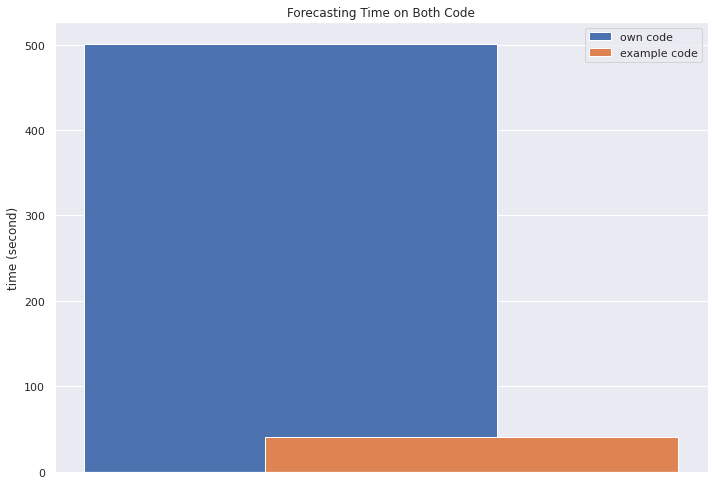

In [ ]:
# Plotting

# Data to plot
n_groups = 1
t1 = (arr_sum(code_exec_time, 37, 48))
t2 = (arr_sum(example_exec_time, 22, 26))
print("own code \t:", t1, "seconds")
print("example code \t:", t2, "seconds")

# Create plot
bar_width = 0.35

fig, ax = plt.subplots()
index = np.arange(n_groups)

rects1 = plt.bar(index, t1, label="own code")
rects2 = plt.bar(index+bar_width, t2, label="example code")

plt.title("Forecasting Time on Both Code")

plt.xticks([])
plt.ylabel("time (second)")
plt.legend()
plt.show()

## Total runtime execution time

own code : 1264.552 seconds = 21.076 minutes
example code : 104.00 seconds = 1.733 minutes


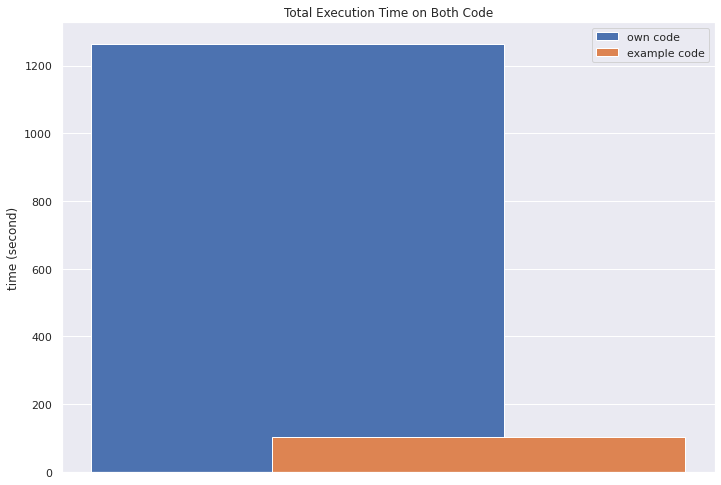

In [ ]:
# Plotting

# Data to plot
n_groups = 1
t1 = (arr_sum(code_exec_time, 0, 48))
t2 = (arr_sum(example_exec_time, 0, 26))
t1_minute = t1/60
t2_minute = t2/60
print("own code : %.3f seconds = %.3f minutes" %(t1,t1_minute))
print("example code : %.2f seconds = %.3f minutes" %(t2,t2_minute))

# Create plot
bar_width = 0.35

fig, ax = plt.subplots()
index = np.arange(n_groups)

rects1 = plt.bar(index, t1, label="own code")
rects2 = plt.bar(index+bar_width, t2, label="example code")

plt.title("Total Execution Time on Both Code")

plt.xticks([])
plt.ylabel("time (second)")
plt.legend()
plt.show()

This is the end of this notebook. Thank you.